In [ ]:
%reset

In [ ]:
import json
import glob
import calendar
from statistics import mean 
import statistics
from sklearn import preprocessing

In [ ]:
import numpy as np 
import pandas as pd                  # for DataFrames
from numpy.linalg import eig
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot
from scipy.stats import kurtosis
from scipy.stats import skew


In [ ]:
import scipy.fftpack                 # discrete Fourier transforms
from scipy import signal
from scipy.signal import find_peaks
from scipy.signal import butter, lfilter
from scipy.signal import find_peaks, peak_prominences
from scipy.signal import chirp, peak_widths


In [ ]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import os

In [ ]:
root = "/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/Graduate/WBL/Project_IOTEX/iotex-glove/PD/"
# Write all the results outside of the PD data folder.
root_results_write = "/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/Graduate/WBL/Project_IOTEX/iotex-glove/"



In [ ]:
s

## Initial Raw Data Plots

In [ ]:
df_p1 = pd.read_csv(root + "Participant1/2021-06-24/rg_20210624-170825.csv")
df_p2 = pd.read_csv(root + "Participant2/2021-06-28/rg_20210628-153436.csv")
df_p3 = pd.read_csv(root +  "Participant3/2021-07-08/rg_20210708-130053.csv")
df_p4 = pd.read_csv(root + "/Participant4/2021-10-18/rg_20211018-184648.csv")



In [ ]:
plt.rcParams["figure.figsize"] = [10.50, 6.50] # WIDTH, HEIGHT
fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(df_p1[df_p1["activity"]==1]["index"][100:500] )
axs[0, 0].set_title('Raw Data: Index Particiant 1')
axs[0, 1].plot(df_p2[df_p2["activity"]==1]["index"][100:500] )
axs[0, 1].set_title('Raw Data: Index Particiant 2')
axs[1, 0].plot(df_p3[df_p3["activity"]==1]["index"][100:500] )
axs[1, 0].set_title('Raw Data: Index Particiant 3')
axs[1, 1].plot(df_p4[df_p4["activity"]==1]["index"][100:500] )
axs[1, 1].set_title('Raw Data: Index Particiant 4')
fig.subplots_adjust(wspace=0.4,hspace=0.5)


In [ ]:
plt.rcParams["figure.figsize"] = [10.50, 6.50] # WIDTH, HEIGHT
fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(df_p1[df_p1["activity"]==1]["index"][100:500]*-1 )
axs[0, 0].set_title('Raw Data: Index Particiant 1 (Inverted)')
axs[0, 1].plot(df_p2[df_p2["activity"]==1]["index"][100:500]*-1 )
axs[0, 1].set_title('Raw Data: Index Particiant 2 (Inverted)')
axs[1, 0].plot(df_p3[df_p3["activity"]==1]["index"][100:500]*-1 )
axs[1, 0].set_title('Raw Data: Index Particiant 3 (Inverted)')
axs[1, 1].plot(df_p4[df_p4["activity"]==1]["index"][100:500]*-1 )
axs[1, 1].set_title('Raw Data: Index Particiant 4 (Inverted)')
fig.subplots_adjust(wspace=0.4,hspace=0.5)


In [ ]:


# Create the line plot
fig = go.Figure(data=go.Scatter(y=df_p1[df_p1["activity"]==1]["index"][100:500],line=dict(width=5)))
# Set the background color to be fully transparent
fig.update_layout(plot_bgcolor='rgba(0, 0, 0, 0)')

# Show the plot
fig.show()

In [ ]:


# Create the line plot
fig = go.Figure(data=go.Scatter(y=df_p2[df_p2["activity"]==1]["index"][100:500],line=dict(width=5)))
# Set the background color to be fully transparent
fig.update_layout(plot_bgcolor='rgba(0, 0, 0, 0)')

# Show the plot
fig.show()

In [ ]:


# Create the line plot
fig = go.Figure(data=go.Scatter(y=df_p3[df_p3["activity"]==1]["index"][100:500],line=dict(width=5)))
# Set the background color to be fully transparent
fig.update_layout(plot_bgcolor='rgba(0, 0, 0, 0)')

# Show the plot
fig.show()

In [ ]:


# Create the line plot
fig = go.Figure(data=go.Scatter(y=df_p4[df_p4["activity"]==1]["index"][100:500],line=dict(width=5)))
# Set the background color to be fully transparent
fig.update_layout(plot_bgcolor='rgba(0, 0, 0, 0)')

# Show the plot
fig.show()

In [ ]:
plt.rcParams["figure.figsize"] = [10.50, 6.50] # WIDTH, HEIGHT
inv_p1 = df_p1[df_p1["activity"]==1]["index"][100:500]*-1
inv_p2 = df_p2[df_p2["activity"]==1]["index"][100:500]*-1 
inv_p3 = df_p3[df_p3["activity"]==1]["index"][100:500]*-1
inv_p4 = df_p4[df_p4["activity"]==1]["index"][100:500]*-1
fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(inv_p1.diff())
axs[0, 0].set_title('Raw Data: Index Particiant 1 (Difference)')
axs[0, 1].plot(inv_p2.diff())
axs[0, 1].set_title('Raw Data: Index Particiant 2 (Difference)')
axs[1, 0].plot(inv_p3.diff())
axs[1, 0].set_title('Raw Data: Index Particiant 3 (Difference)')
axs[1, 1].plot(inv_p4.diff())
axs[1, 1].set_title('Raw Data: Index Particiant 4 (Difference)')
fig.subplots_adjust(wspace=0.4,hspace=0.5)


In [ ]:
df_issue = pd.read_csv(root+"Participant1/2021-07-03/rg_20210703-070405.csv")
df_issue["activity"].value_counts() # FT low sampling rate poroblem 1      96.

## Signal Processing functions for the paper pipeline

In [14]:
# Takes: An n-dimentional numpy array.
# Returns: yf,xf,AMP where yf is the scipi.fft() output, xf is the frequencies of the given fft, and AMP is the amplitude of the given fft. 
def my_fft(df_finger_tapping_2_5_index_norm,Fs):
    N = len(df_finger_tapping_2_5_index_norm)
    yf = scipy.fftpack.fft(df_finger_tapping_2_5_index_norm)
    xf = scipy.fftpack.fftfreq(N,1/Fs)[:N//2] # get the frequency component Fs = 40 Hz
    #print("xf: ",xf)
    AMP= 2.0/N * np.abs(yf[0:N//2])
    #print("AMP: ",AMP)
    return yf,xf,AMP


In [15]:
# Takes : the fft() output yf.
# Returns: Filtered singal.
def frequency_filtering(yf,max_amp_index):
    bounds = 1
    high_freq_fft = yf.copy()
    high_freq_fft[:max_amp_index-bounds] = 0
    high_freq_fft[max_amp_index+bounds:] = 0
    filtered_sig = scipy.fftpack.ifft(high_freq_fft)
    return filtered_sig


In [27]:

def time_based_peak_detect(df_finger_tapping_2_5_index_norm):
    indices,properties_peaks = find_peaks(df_finger_tapping_2_5_index_norm, height=np.quantile(df_finger_tapping_2_5_index_norm, 0.50))
    print("Number of Peaks in time based: ", len(indices))
    # find the widths of the peak detected by the random peak detector.
    peak_width = peak_widths(df_finger_tapping_2_5_index_norm, indices, rel_height=0.5)
    width_threshold = peak_width[0].mean()
    # get peak indicies of the raw signal based on the width parameter.
    indicies_p2, properties_peaks_p2 =find_peaks(df_finger_tapping_2_5_index_norm, height=np.quantile(df_finger_tapping_2_5_index_norm, 0.50),width =width_threshold)
    peaks_timebased =[df_finger_tapping_2_5_index_norm[j] for j in indicies_p2]

    return width_threshold, indices, peak_width[0],indicies_p2,peaks_timebased



In [28]:
def moving_average(X, window_size):
    X_new =[]
    # end_index = window_size
    for i, value in enumerate(X):
        #print("index, value",i, value)
        X_new.insert(i, sum(X[i:i+window_size])/len(X[i:i+window_size]))
    return X_new
        

In [29]:
def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a



In [30]:

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y

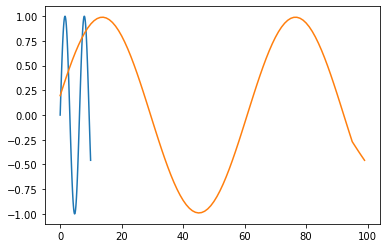

In [31]:
########################################################
# Sanity check if the moving average filter is working.
########################################################
# Get x values of the sine wave
time        = np.arange(0, 10, 0.1);
# Amplitude of the sine wave is sine of a variable like time
amplitude   = np.sin(time)
# Plot a sine wave using time and amplitude obtained for the sine wave
plt.plot(time, amplitude)
########################################################
# Apply Filter.
########################################################
window_size = 5
X_new = moving_average(amplitude,window_size)
plt.plot(X_new)

## Call the above funtions in the main processing pipeline.

In [32]:
# Returns a list of filepaths and date IDs at which the exercises were performed.
def process_iotex_data(participant_id,results_file_name):
    np.set_printoptions(suppress=True) # to get only numeric notations. 
    df_rg_paths = pd.read_csv(root_results_write + results_file_name) # reaults_file - results_p2.csv
    # print(df_rg_paths["Participant"])
    df_rg_paths = df_rg_paths[df_rg_paths["Participant"]==participant_id]
    df_rg_paths = df_rg_paths[df_rg_paths["NOT"]!="X"]
    df_rg_paths = df_rg_paths[df_rg_paths["MedStatus"]!="X"]
    df_rg_paths["Stage1_Random_Peaks"] = np.linspace(-911, -911, num=df_rg_paths.shape[0], endpoint=False)
    df_rg_paths["Method1_TimeBased_Peaks"] = np.linspace(-911, -911, num=df_rg_paths.shape[0], endpoint=False)
    df_rg_paths["Method3_FreqBased_Peaks"] = np.linspace(-911, -911, num=df_rg_paths.shape[0], endpoint=False)
    df_rg_paths["width_threshold"] = np.linspace(-911, -911, num=df_rg_paths.shape[0], endpoint=False)
    df_rg_paths["SNR_mean_std"] = np.linspace(-911, -911, num=df_rg_paths.shape[0], endpoint=False)
    df_rg_paths['SNR_Filtered'] = np.linspace(-911, -911, num=df_rg_paths.shape[0], endpoint=False)
    peak2peak_diff_freq_list = []
    peak2peak_diff_time_list = []
    peakamp_list_per_session = []
    peakamp_list_per_session_timeBased = []

    file_name_list = []
    med_time_list = []
    feel_medicaiton_list = []
    feel_medication_list = []
    width_threshold_list = []
    for index, row in df_rg_paths.iterrows():
        print("",index, row["Participant"] +"/"+ row["DateList"] + "/" + row["FileName"],"===========================")
        if row["FileName"] != "rg_20210703-070405.csv":
            if row["FileName"] != "lg_20211029-153037.csv":
                df = pd.read_csv(root+row["Participant"] +"/"+ row["DateList"] + "/" + row["FileName"])
                df_med = pd.read_fwf(root+row["Participant"] +"/"+ row["DateList"] + "/" + row["MedStatus"],header=None,ignore_index = True)
#                 print("df_med: ",df_med.shape,df_med)
#                 print("Tremor === ",df_med.loc[0].values, type(df_med.loc[0]),"======")
#                 print("dyskinesia === ",df_med.loc[1].values,"======")
#                 print("bands_difficulty === ",df_med.loc[2].values,"======")
#                 print("sleep_quality === ",df_med.loc[3].values,"======")
#                 print("time_since_medication === ",df_med.loc[4].values,"======")
#                 print("feel_medication === ",df_med.loc[5].values,"======")
                df_rg_paths.at[index,'tremor'] = int(df_med.loc[0].values[0].split("=")[1])
                df_rg_paths.at[index,'dyskinesia'] =int(df_med.loc[1].values[0].split("=")[1])
                df_rg_paths.at[index,'bands_difficulty'] =int(df_med.loc[2].values[0].split("=")[1])
                df_rg_paths.at[index,'sleep_quality'] =int(df_med.loc[3].values[0].split("=")[1])
                df_rg_paths.at[index,'time_since_medication'] =df_med.loc[4].values[0].split("=")[1]
                df_rg_paths.at[index,'feel_medication'] = df_med.loc[5].values[0].split("=")[1]
                if df_med.loc[4].values[0].split("=")[1] == "4_plus"or df_med.loc[4].values[0].split("=")[1] == "0_to_1_hrs":
                    df_rg_paths.at[index,'med_on_off'] = 0 # MED OFF
                if df_med.loc[4].values[0].split("=")[1] == "1_to_2_hrs" or df_med.loc[4].values[0].split("=")[1] == "2_to_3_hrs" :
                    df_rg_paths.at[index,'med_on_off'] = 1 # MED ON
                    
#         # Subset the Finger tapping activity.
        #################### ------------------------ SUBSET DATA ------------------------ ####################
        if row["FileName"].startswith("rg_"):
            df_finger_tapping = df[df["activity"]==1]
        if row["FileName"].startswith("lg_"):
             df_finger_tapping = df[df["activity"]==0]
        #################### ------------------------ PREPROCESSING ------------------------ ####################
        if df_finger_tapping.shape[0]>0: # If data is present.
            st_time = df_finger_tapping["time"].iloc[0]
            stop_time = df_finger_tapping["time"].iloc[df_finger_tapping.shape[0]-1]
            total_time_nano = stop_time - st_time
            total_sec = total_time_nano/1000000000
#             print("total_time_nano: ",total_time_nano)
#             print("total_sec: ",total_sec)
            Fs = df_finger_tapping.shape[0]/round(total_sec, 2) # int(total_sec)
            print("Sampling Frequency (Fs =): ", Fs)
            num_samples_2 = Fs*2.5
            print("num_samples_2: Fs*2.5 ",num_samples_2)
            # Subset 2.5 seconds of data.
            start_idx = 100
            end_idx = start_idx+int(num_samples_2) 
#             print("start_idx, end_idx: ",start_idx,end_idx)   
            if int(num_samples_2)>=30: # Number of samples should be >= 30. 
                df_finger_tapping_2_5 = df_finger_tapping[start_idx:end_idx]*-1 # invert the signal *-1.
                # Normalize the  raw index finger values.
                # df_finger_tapping_2_5_index_norm is a <class 'numpy.ndarray'> of shape (1, 160) 
                # take df_finger_tapping_2_5_index_norm[0] to get the actual array of values of lingth 160.
                detrended_signal = signal.detrend(df_finger_tapping_2_5["index"])
                df_finger_tapping_2_5_index_norm =preprocessing.normalize([detrended_signal])
                #print("df_finger_tapping_2_5_index_norm: ",df_finger_tapping_2_5_index_norm)
                # signal.detrend(preprocessing.normalize([])) # df_lg_activity[column_id] #
                #print("df_finger_tapping_2_5_index_norm:",type(df_finger_tapping_2_5_index_norm[0]))
                band_pass_filtered = butter_bandpass_filter(df_finger_tapping_2_5_index_norm[0], 1, 5, Fs, order=5)

                mov_average_filt = moving_average(band_pass_filtered, 10) #scipy.signal.medfilt(df_finger_tapping_2_5_index_norm[0], kernel_size=9)
                mov_average_filt_diff = [x - mov_average_filt[i - 1] for i, x in enumerate(mov_average_filt)][1:]

                # print("median_filt_results: ",median_filt_results)
                # width_threshold, indices, peak_width[0],indicies_p2,peaks_timebased
                #################### ------------------------ TIME BASED ------------------------ ####################. 
                width_threshold, indices, peak_width, indicies_p2, peaks_timebased = time_based_peak_detect(mov_average_filt)
                peakamp_list_per_session_timeBased.append(peaks_timebased)
                df_rg_paths.at[index,'AchievedSR'] = Fs
                # my_new_list = [i/5 for i in my_list]
                # append output resutls to a df.
                my_new_list = [i/Fs for i in peak_width] #Fs=. 1/period.
                width_threshold_list.append(my_new_list) # Time sapce converted values. 
                
                df_rg_paths.at[index,'Stage1_Random_Peaks']   =len(indices)
                df_rg_paths.at[index,'width_threshold'] =width_threshold 
                df_rg_paths.at[index,'Method1_TimeBased_Peaks'] =len(indicies_p2)
                peak2peak_diff_time = [peaks_timebased[i + 1] - peaks_timebased[i] for i in range(len(peaks_timebased)-1)]
                peak2peak_diff_time_list.append(peak2peak_diff_time)
                # peak detector on moving average filter. 
                width_threshold_diff, indices_diff, peak_width_diff, indicies_p2_diff, peaks_timebased_diff = time_based_peak_detect(mov_average_filt_diff)
                
                
                ######################################################################################################################
                #################### ------------------------ FREQUENCY BASED FILTERING------------------------ ####################
                ######################################################################################################################
                time_steps = np.linspace(0, 40, len(df_finger_tapping_2_5_index_norm[0]))
                yf,xf,AMP = my_fft(mov_average_filt,Fs)
                print("np.array(AMP).argmax(): index of max amp ,AMP ",type(AMP),AMP.argmax(), ",",AMP[AMP.argmax()],", Freq = ",xf[AMP.argmax()])
                # np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 1 , 0.000207940515408654 , Freq =  0.25
                print("pld_amplidute: ",len(AMP))
                while xf[AMP.argmax()]<3:
                    print("xf[AMP.argmax()]: ",xf[AMP.argmax()])
                    AMP[AMP.argmax()] = 0
                print("NEW FREQUENCYxf[np.array(AMP).argmax()]: ",xf[AMP.argmax()])
                filtered_sig = frequency_filtering(yf,np.array(AMP).argmax()) # Filtered signal based on inverse fft and dominant frequency component.
                
                ########################################################################################################################
                #################### ------------------------ FIND PEAKS IN FILTERED SIGNAL ------------------------ ####################
                ########################################################################################################################
                filt_peak_indices, filt_properties_peaks = find_peaks(filtered_sig.real, height=np.quantile(filtered_sig.real, 0.50))

                # Get the peak values in the raw data instead of the filtered data. 
                raw_data_peaks = [mov_average_filt[j] for j in filt_peak_indices]
                peakamp_list_per_session.append(raw_data_peaks)
                title_font = 12
                axis_font = 12
                font = {'family' : 'Sans'}
                plt.rc('font', **font)
                fig, axs  = plt.subplots(4, 2)
                plt.subplots_adjust(wspace=2,hspace=1.4,top=1,right =1.5) # top=0.8-> for top title spacing
                axs[0,0].plot(df_finger_tapping_2_5["index"],color="red",label  = "Raw Data")
                axs[0,0].set_title("Raw Data",fontweight="bold",fontsize=title_font)
                axs[0,0].set_xlabel("# Smaples",fontsize=axis_font)
                axs[0,0].set_ylabel(" Voltage",fontsize=axis_font)
                
                axs[0,1].plot(df_finger_tapping_2_5_index_norm[0],color="orange",label  = "Norm/Dtrend")
                axs[0,1].set_title("Normalized/Detrended data",fontweight="bold",fontsize=title_font)
                axs[0,1].set_xlabel("# Smaples",fontsize=axis_font)
                axs[0,1].set_ylabel(" Voltage",fontsize=axis_font)
          
              
                axs[1,0].plot(mov_average_filt,color="green",label = "moving average filter")
                axs[1,0].plot(filtered_sig.real,color="blue",label  = "Frequecy Filtered Signal")
                axs[1,0].scatter(indicies_p2, peaks_timebased,s=20,marker="o",color="black",label  = "Time based Peaks")
                axs[1,0].scatter(filt_peak_indices, raw_data_peaks, s=20, marker="x",color="blue",label  = "Freq Based peaks")
#                 axs[0,0].hlines(*peak_width[1:], color="black",label="Peak widths")
                axs[1,0].set_title("Moving Average",fontweight="bold",fontsize=title_font)
                axs[1,0].legend(bbox_to_anchor=(4, 1),loc='upper right',fontsize="10")
                axs[1,0].set_xlabel("# Samples",fontsize=axis_font)
                axs[1,0].set_ylabel("Voltage",fontsize=axis_font)

                axs[1,1].set_title("FFT of Normalized and Detrended Signal",fontweight="bold",fontsize=title_font)
                axs[1,1].plot(xf,AMP,color='blue')
                axs[1,1].set_xlabel("Frequency (Hz)",fontsize=axis_font)
                axs[1,1].set_ylabel("Amplitude",fontsize=axis_font)
                axs[2,0].plot(mov_average_filt_diff,color="#660066",)
                axs[2,0].scatter(indicies_p2_diff, peaks_timebased_diff, s=20,marker ="o",color="red")
                axs[2,0].set_title("Difference of Moving Average",fontweight="bold",fontsize=title_font)
                axs[2,0].set_xlabel("# Smaples",fontsize=axis_font)
                axs[2,0].set_ylabel("Diff Voltage",fontsize=axis_font)
                axs[2,1].set_title("Peaks: Moving Average Diference",fontweight="bold",fontsize=title_font)
                axs[2,1].plot(mov_average_filt,color="#003300")
                axs[2,1].scatter(indicies_p2_diff, peaks_timebased_diff,  s=20,marker ="o",color="red")
                axs[2,1].set_xlabel("# Smaples",fontsize=axis_font)
                axs[2,1].set_ylabel("Voltage",fontsize=axis_font)
                axs[3,0].set_title("BandPass Filtered",fontweight="bold",fontsize=title_font)
                axs[3,0].plot(band_pass_filtered)
                plt.show()
                # Calculate the peak to peak differencs in freequency based filtereing method.
                peak2peak_diff_freq = [raw_data_peaks[i + 1] - raw_data_peaks[i] for i in range(len(raw_data_peaks)-1)]
                peak2peak_diff_freq_list.append(peak2peak_diff_freq)
                file_name_list.append(row["FileName"])
                print("Medicaiton Time: ",df_med.loc[4].values[0].split("=")[1])
                med_time_list.append(df_med.loc[4].values[0].split("=")[1])
                feel_medicaiton_list.append(df_med.loc[5].values[0].split("=")[1])
                #df_rg_paths.at[index,'feel_medication'] = df_med.loc[5].values[0].split("=")[1]

                # Append results to a pandas data frame.
                df_rg_paths.at[index,'Method3_FreqBased_Peaks'] = len(peak2peak_diff_freq)
                df_rg_paths.at[index,'DominantFreq'] = xf[AMP.argmax()]
                print("df_finger_tapping_2_5_index_norm: ",type(df_finger_tapping_2_5_index_norm[0]))
                df_rg_paths.at[index,'SNR_mean_std'] = abs(df_finger_tapping_2_5["index"].mean()/df_finger_tapping_2_5["index"].std())
                df_rg_paths.at[index,'SNR_Filtered'] =  mean(mov_average_filt)/statistics.pstdev(mov_average_filt)
                df_rg_paths.at[index,'PeakAmplitudeMean'] = mean(raw_data_peaks)
                df_rg_paths.at[index,'PeakAmplitudeMax'] = mean(raw_data_peaks)
                df_rg_paths.at[index,'PeakAmplitudeMin'] = min(raw_data_peaks)
                df_rg_paths.at[index,'PeakAmplitudeStd'] = statistics.pstdev(raw_data_peaks)
                print("Skewness: ",skew(AMP, axis=0, bias=True))
                print("Kurtosis: ",kurtosis(AMP, axis=0, bias=True))
                df_rg_paths.at[index,'KurtosisFFT'] = kurtosis(AMP, axis=0, bias=True)
                df_rg_paths.at[index,'SkewnessFFT'] = skew(AMP, axis=0, bias=True)
                auto_correlation = scipy.signal.correlate(df_finger_tapping_2_5_index_norm, df_finger_tapping_2_5_index_norm, mode='full', method='auto')
        p2p_freq_df = pd.DataFrame(peak2peak_diff_freq_list)
        p2p_time_df = pd.DataFrame(peak2peak_diff_time_list)
        withd_threshold_df = pd.DataFrame(width_threshold_list)
        peak_amnplitude_df_freq = pd.DataFrame(peakamp_list_per_session)
        peak_amnplitude_df_timebased = pd.DataFrame(peakamp_list_per_session_timeBased)
        peak_amnplitude_df_timebased["filename"] =file_name_list
        peak_amnplitude_df_timebased["med_time"]=med_time_list
        peak_amnplitude_df_timebased["med_feel"]=feel_medicaiton_list
        peak_amnplitude_df_freq["filename"]=file_name_list
        peak_amnplitude_df_freq["med_time"]=med_time_list
        peak_amnplitude_df_freq["med_feel"]=feel_medicaiton_list
        withd_threshold_df["filename"] = file_name_list
        withd_threshold_df["med_time"] = med_time_list
        withd_threshold_df["med_feel"] = feel_medicaiton_list
        p2p_time_df["med_feel"] = file_name_list
        p2p_time_df["med_time"] = med_time_list
        p2p_time_df["med_feel"] = feel_medicaiton_list
        p2p_freq_df["filename"] =  file_name_list
        p2p_freq_df["med_time"] = med_time_list
        p2p_freq_df["med_feel"] = feel_medicaiton_list

    return df_rg_paths, p2p_freq_df,p2p_time_df,withd_threshold_df,peak_amnplitude_df_freq,peak_amnplitude_df_timebased  # Row is Session number, columsn are peak indexes


    
    

In [33]:
output_file_results = "/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/Graduate/WBL/Project_IOTEX/Results_Out"


 0 Participant1/2021-06-24/lg_20210624-170825.csv ===========================
Sampling Frequency (Fs =):  86.89492325855961
num_samples_2: Fs*2.5  217.23730814639904
Number of Peaks in time based:  12
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 12 , 0.02573462407370739 , Freq =  4.8052492124549095
pld_amplidute:  108
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.8052492124549095


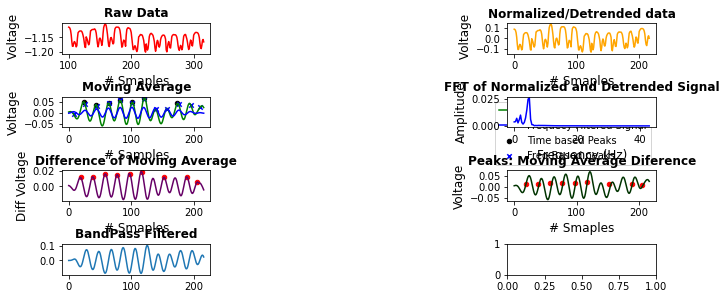

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.798815413397206
Kurtosis:  24.612171150456412
 1 Participant1/2021-06-25/lg_20210625-071807.csv ===========================
Sampling Frequency (Fs =):  79.13446676970634
num_samples_2: Fs*2.5  197.83616692426585
Number of Peaks in time based:  9
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 9 , 0.0476011998691927 , Freq =  3.6152802077530817
pld_amplidute:  98
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.6152802077530817


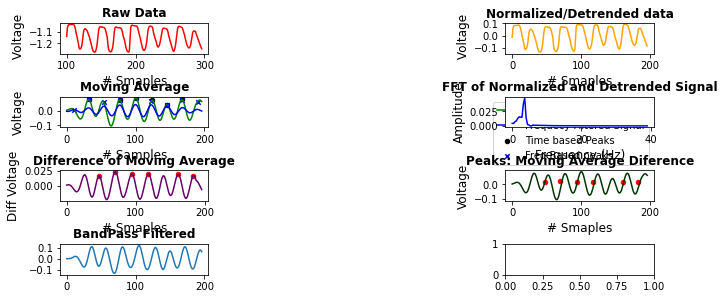

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.92281028979738
Kurtosis:  26.64131658138987
 2 Participant1/2021-06-25/lg_20210625-172211.csv ===========================
Sampling Frequency (Fs =):  88.09946714031972
num_samples_2: Fs*2.5  220.24866785079928
Number of Peaks in time based:  9
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 11 , 0.019387493911858716 , Freq =  4.404973357015986
pld_amplidute:  110
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.404973357015986


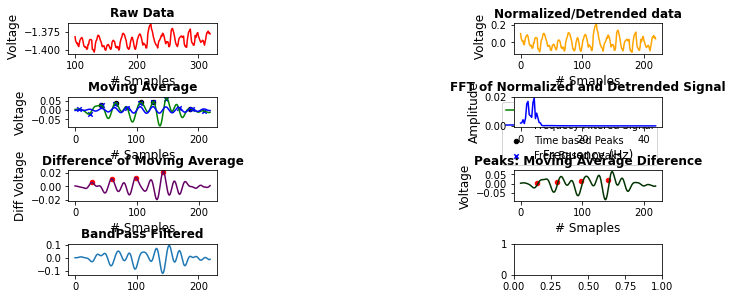

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.6458575566219893
Kurtosis:  13.257144773766285
 3 Participant1/2021-06-27/lg_20210627-093647.csv ===========================
Sampling Frequency (Fs =):  0.007089887729135271
num_samples_2: Fs*2.5  0.017724719322838176
 4 Participant1/2021-06-27/lg_20210627-122353.csv ===========================
Sampling Frequency (Fs =):  88.96860986547085
num_samples_2: Fs*2.5  222.42152466367713
Number of Peaks in time based:  11
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 12 , 0.017466971277663636 , Freq =  4.809114046782208
pld_amplidute:  111
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.809114046782208


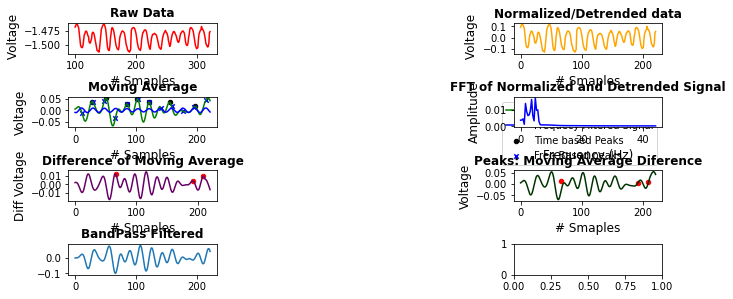

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.334782439522328
Kurtosis:  11.058572469658653
 7 Participant1/2021-06-29/lg_20210629-063713.csv ===========================
Sampling Frequency (Fs =):  82.85714285714286
num_samples_2: Fs*2.5  207.14285714285717
Number of Peaks in time based:  8
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 4 , 0.019661206712261084 , Freq =  1.601104209799862
pld_amplidute:  103
xf[AMP.argmax()]:  1.601104209799862
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.202208419599724


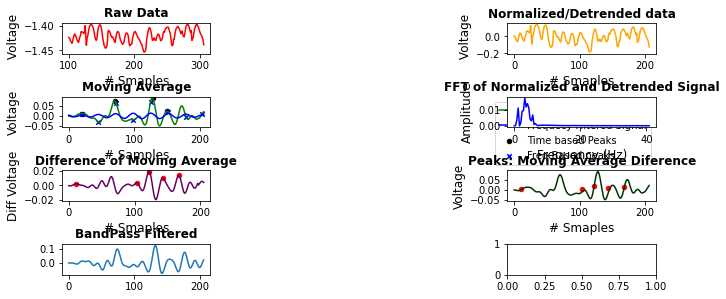

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.376293627790949
Kurtosis:  10.831924212003548
 8 Participant1/2021-06-29/lg_20210629-194025.csv ===========================
Sampling Frequency (Fs =):  89.85959438377535
num_samples_2: Fs*2.5  224.64898595943836
Number of Peaks in time based:  9
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 9 , 0.025664850379892284 , Freq =  3.6104301314909737
pld_amplidute:  112
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.6104301314909737


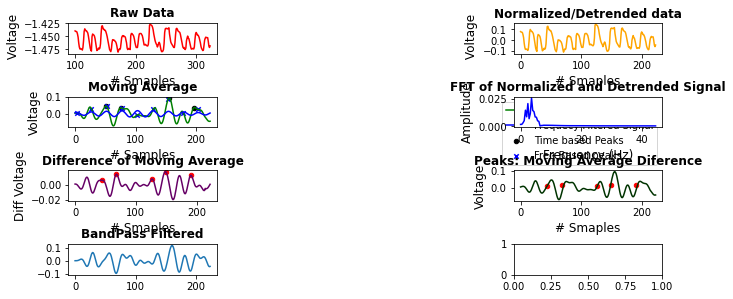

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.753617919236669
Kurtosis:  14.994937605424958
 9 Participant1/2021-06-30/lg_20210630-071412.csv ===========================
Sampling Frequency (Fs =):  90.51094890510949
num_samples_2: Fs*2.5  226.27737226277372
Number of Peaks in time based:  10
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 11 , 0.021786065414613306 , Freq =  4.405400167947806
pld_amplidute:  113
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.405400167947806


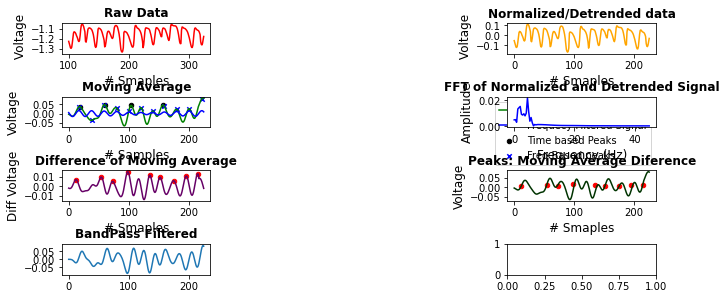

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.264584952912304
Kurtosis:  11.10296034006479
 10 Participant1/2021-06-30/lg_20210630-221335.csv ===========================
Sampling Frequency (Fs =):  92.02226345083488
num_samples_2: Fs*2.5  230.0556586270872
Number of Peaks in time based:  10
Number of Peaks in time based:  11
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.01705297689639749 , Freq =  2.000483988061628
pld_amplidute:  115
xf[AMP.argmax()]:  2.000483988061628
xf[AMP.argmax()]:  1.200290392836977
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.000967976123256


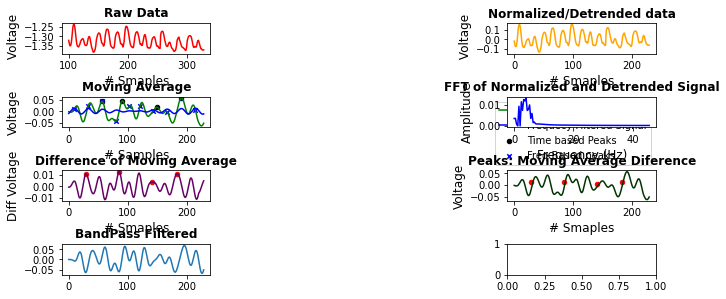

Medicaiton Time:  2_to_3_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.0728201411143576
Kurtosis:  8.417577963464554
 11 Participant1/2021-07-01/lg_20210701-070904.csv ===========================
Sampling Frequency (Fs =):  89.28892889288929
num_samples_2: Fs*2.5  223.22232223222323
Number of Peaks in time based:  8
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 6 , 0.020697113252125466 , Freq =  2.402392705638277
pld_amplidute:  111
xf[AMP.argmax()]:  2.402392705638277
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.203190274184369


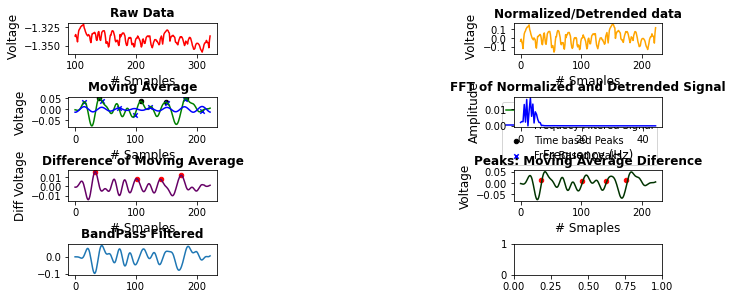

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.7050325331850265
Kurtosis:  13.402428237967666
 12 Participant1/2021-07-01/lg_20210701-212116.csv ===========================
Sampling Frequency (Fs =):  22.211938917167977
num_samples_2: Fs*2.5  55.52984729291994
Number of Peaks in time based:  5
Number of Peaks in time based:  6
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 1 , 0.02699014760775185 , Freq =  0.40385343485759956
pld_amplidute:  27
xf[AMP.argmax()]:  0.40385343485759956
xf[AMP.argmax()]:  0.0
xf[AMP.argmax()]:  0.8077068697151991
xf[AMP.argmax()]:  1.2115603045727987
xf[AMP.argmax()]:  1.6154137394303982
xf[AMP.argmax()]:  2.019267174287998
xf[AMP.argmax()]:  2.4231206091455975
xf[AMP.argmax()]:  2.826974044003197
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2308274788607965


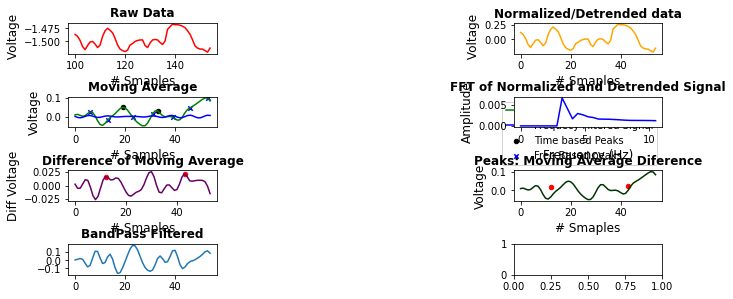

Medicaiton Time:  2_to_3_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  1.7623459135453952
Kurtosis:  4.145405610965673
 13 Participant1/2021-07-02/lg_20210702-065005.csv ===========================
Sampling Frequency (Fs =):  89.41574936494496
num_samples_2: Fs*2.5  223.5393734123624
Number of Peaks in time based:  8
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 3 , 0.02743957144181067 , Freq =  1.2029024578243717
pld_amplidute:  111
xf[AMP.argmax()]:  1.2029024578243717
xf[AMP.argmax()]:  1.6038699437658288
xf[AMP.argmax()]:  2.004837429707286
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.410642345356029


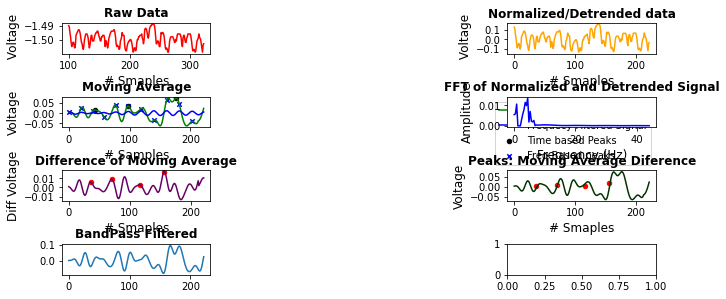

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.443945572880525
Kurtosis:  11.439904537173826
 14 Participant1/2021-07-02/lg_20210702-185148.csv ===========================
Sampling Frequency (Fs =):  0.022391840413353372
num_samples_2: Fs*2.5  0.05597960103338343
 15 Participant1/2021-07-03/lg_20210703-070405.csv ===========================
Sampling Frequency (Fs =):  88.39779005524862
num_samples_2: Fs*2.5  220.99447513812154
Number of Peaks in time based:  8
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 4 , 0.026390743576734602 , Freq =  1.6072325464590658
pld_amplidute:  110
xf[AMP.argmax()]:  1.6072325464590658
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.419889502762431


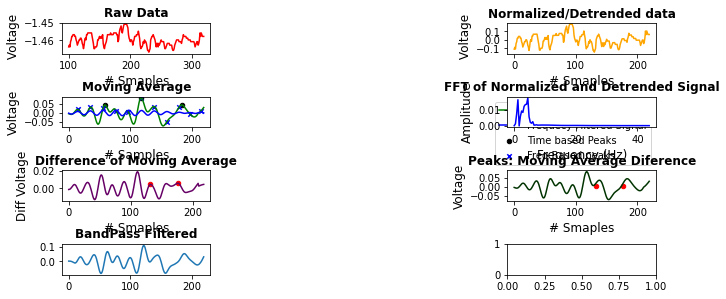

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.4382317279874552
Kurtosis:  11.118927227119892
 16 Participant1/2021-07-04/lg_20210704-074924.csv ===========================
Sampling Frequency (Fs =):  86.23676612127045
num_samples_2: Fs*2.5  215.5919153031761
Number of Peaks in time based:  10
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 9 , 0.025853753358035945 , Freq =  3.609911139960158
pld_amplidute:  107
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.609911139960158


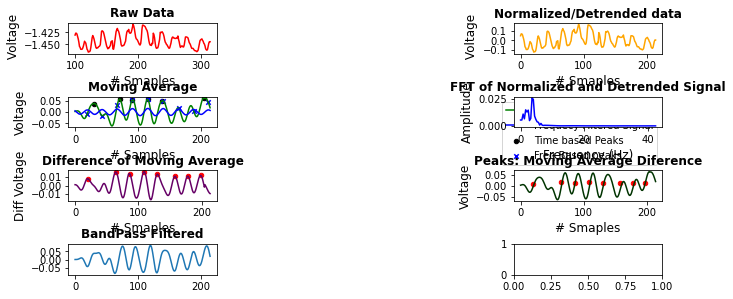

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.771902883883645
Kurtosis:  15.168076652581401
 17 Participant1/2021-07-04/lg_20210704-145340.csv ===========================
Sampling Frequency (Fs =):  88.212927756654
num_samples_2: Fs*2.5  220.53231939163499
Number of Peaks in time based:  8
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.019278184249244736 , Freq =  2.0048392671966817
pld_amplidute:  110
xf[AMP.argmax()]:  2.0048392671966817
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.4106463878327


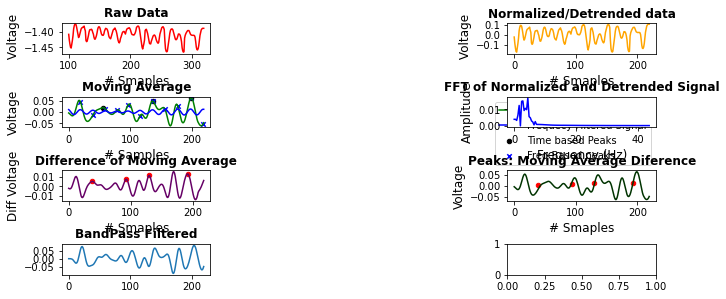

Medicaiton Time:  2_to_3_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.290339516326534
Kurtosis:  10.333094869287907
 18 Participant1/2021-07-05/lg_20210705-125950.csv ===========================
Sampling Frequency (Fs =):  90.22556390977444
num_samples_2: Fs*2.5  225.5639097744361
Number of Peaks in time based:  9
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 6 , 0.02239872677525472 , Freq =  2.4060150375939844
pld_amplidute:  112
xf[AMP.argmax()]:  2.4060150375939844
xf[AMP.argmax()]:  2.0050125313283202
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.0100250626566405


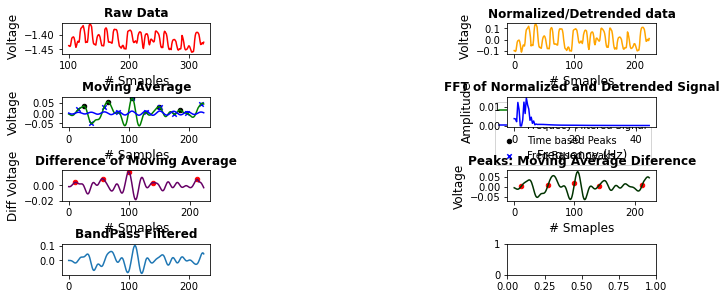

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.5449583493200056
Kurtosis:  12.136856800215877
 19 Participant1/2021-07-05/lg_20210705-191026.csv ===========================
Sampling Frequency (Fs =):  0.045473089740592526
num_samples_2: Fs*2.5  0.11368272435148132
 20 Participant1/2021-07-06/lg_20210706-070145.csv ===========================
Sampling Frequency (Fs =):  86.89138576779027
num_samples_2: Fs*2.5  217.22846441947567
Number of Peaks in time based:  10
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 12 , 0.01987582507830021 , Freq =  4.805053590845545
pld_amplidute:  108
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.805053590845545


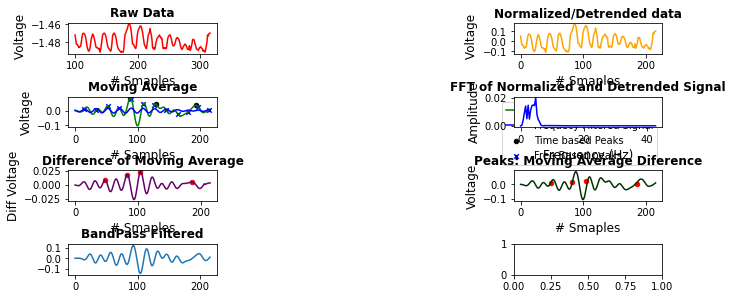

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.099177611109445
Kurtosis:  8.708147417443456
 21 Participant1/2021-06-24/rg_20210624-170825.csv ===========================
Sampling Frequency (Fs =):  94.64428457234213
num_samples_2: Fs*2.5  236.61071143085533
Number of Peaks in time based:  11
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 11 , 0.040290048609517785 , Freq =  4.411386145321031
pld_amplidute:  118
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.411386145321031


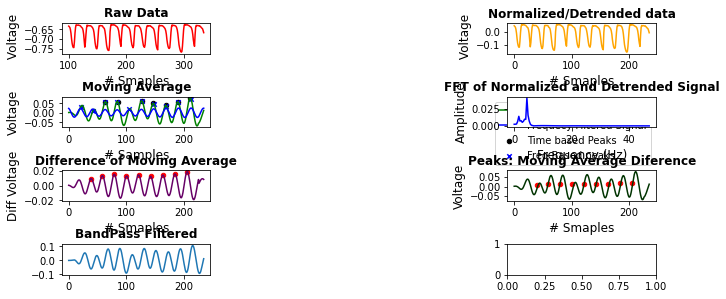

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  6.3655159174943465
Kurtosis:  48.90554536636572
 22 Participant1/2021-06-25/rg_20210625-071807.csv ===========================
Sampling Frequency (Fs =):  90.30390738060781
num_samples_2: Fs*2.5  225.75976845151953
Number of Peaks in time based:  10
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 11 , 0.04410402407296782 , Freq =  4.414857694163048
pld_amplidute:  112
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.414857694163048


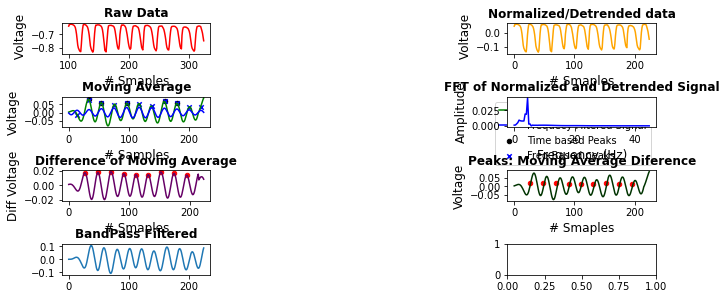

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  6.392377787842846
Kurtosis:  47.3579163245882
 23 Participant1/2021-06-25/rg_20210625-172211.csv ===========================
Sampling Frequency (Fs =):  81.92397207137316
num_samples_2: Fs*2.5  204.8099301784329
Number of Peaks in time based:  12
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 12 , 0.02868684816476224 , Freq =  4.8190571806690095
pld_amplidute:  102
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.8190571806690095


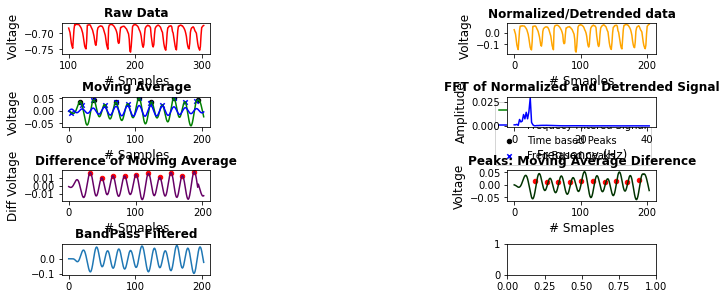

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.013326107762963
Kurtosis:  28.952925841947042
 24 Participant1/2021-06-27/rg_20210627-093647.csv ===========================
Sampling Frequency (Fs =):  81.17839607201309
num_samples_2: Fs*2.5  202.9459901800327
Number of Peaks in time based:  10
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 11 , 0.03927561405340708 , Freq =  4.420605726693782
pld_amplidute:  101
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.420605726693782


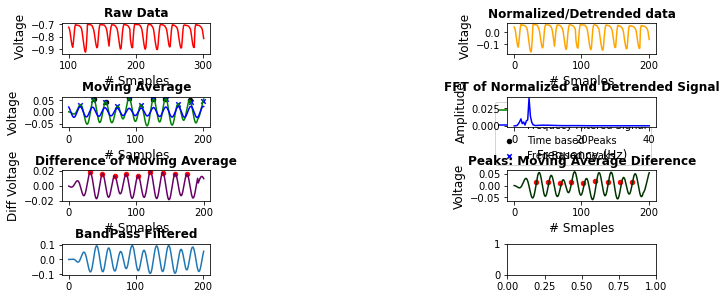

Medicaiton Time:  2_to_3_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  7.062107771733615
Kurtosis:  56.4954163500122
 25 Participant1/2021-06-27/rg_20210627-122353.csv ===========================
Sampling Frequency (Fs =):  91.19170984455958
num_samples_2: Fs*2.5  227.97927461139895
Number of Peaks in time based:  12
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 13 , 0.019892012647295596 , Freq =  5.222432722375659
pld_amplidute:  113
NEW FREQUENCYxf[np.array(AMP).argmax()]:  5.222432722375659


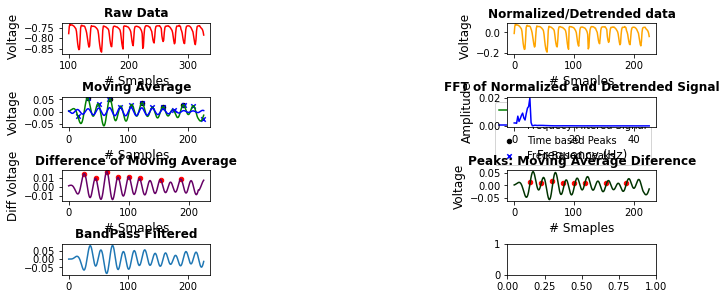

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.036874533392714
Kurtosis:  17.769404031442832
 28 Participant1/2021-06-29/rg_20210629-063713.csv ===========================
Sampling Frequency (Fs =):  91.59212880143113
num_samples_2: Fs*2.5  228.98032200357784
Number of Peaks in time based:  11
Number of Peaks in time based:  11
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 12 , 0.02993602586227864 , Freq =  4.82063835797006
pld_amplidute:  114
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.82063835797006


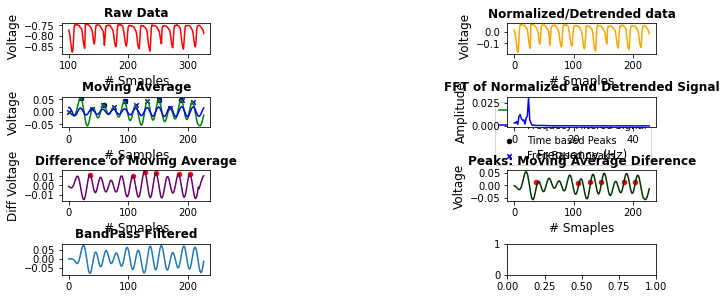

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.4938458345171615
Kurtosis:  37.19771459731524
 29 Participant1/2021-06-29/rg_20210629-194025.csv ===========================
Sampling Frequency (Fs =):  90.96989966555184
num_samples_2: Fs*2.5  227.4247491638796
Number of Peaks in time based:  11
Number of Peaks in time based:  13
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 13 , 0.011552526832950478 , Freq =  5.209729936793717
pld_amplidute:  113
NEW FREQUENCYxf[np.array(AMP).argmax()]:  5.209729936793717


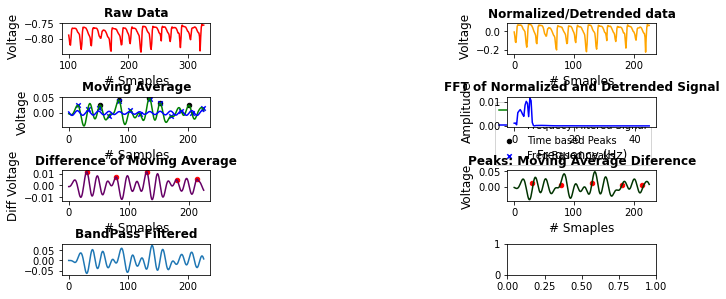

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.1053761623908938
Kurtosis:  8.732764670235925
 30 Participant1/2021-06-30/rg_20210630-071412.csv ===========================
Sampling Frequency (Fs =):  84.82632541133455
num_samples_2: Fs*2.5  212.06581352833638
Number of Peaks in time based:  11
Number of Peaks in time based:  11
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 11 , 0.036602151940994754 , Freq =  4.401365941154151
pld_amplidute:  106
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.401365941154151


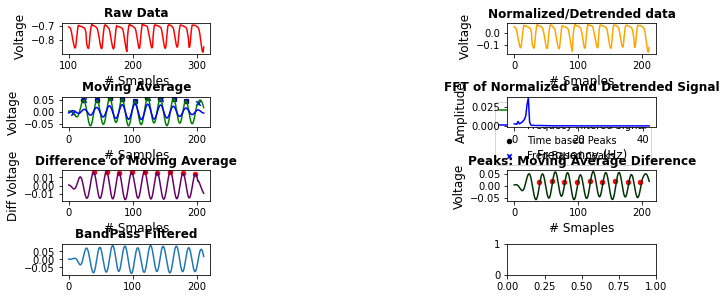

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.850770461209085
Kurtosis:  36.56401749338919
 31 Participant1/2021-06-30/rg_20210630-221335.csv ===========================
Sampling Frequency (Fs =):  90.59360730593608
num_samples_2: Fs*2.5  226.4840182648402
Number of Peaks in time based:  11
Number of Peaks in time based:  11
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 10 , 0.02407087624679898 , Freq =  4.008566694952924
pld_amplidute:  113
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.008566694952924


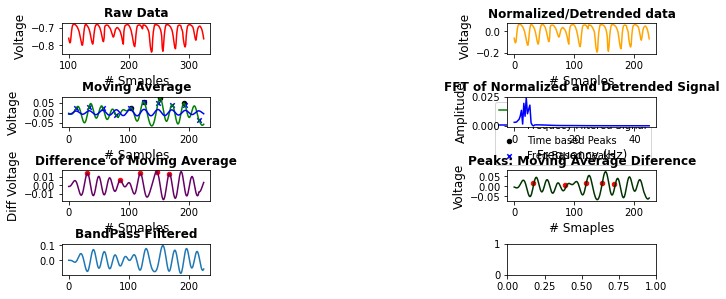

Medicaiton Time:  2_to_3_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.846065032556778
Kurtosis:  14.986786875205237
 32 Participant1/2021-07-01/rg_20210701-070904.csv ===========================
Sampling Frequency (Fs =):  83.72093023255813
num_samples_2: Fs*2.5  209.30232558139534
Number of Peaks in time based:  11
Number of Peaks in time based:  11
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 12 , 0.028114712799066865 , Freq =  4.806943362634916
pld_amplidute:  104
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.806943362634916


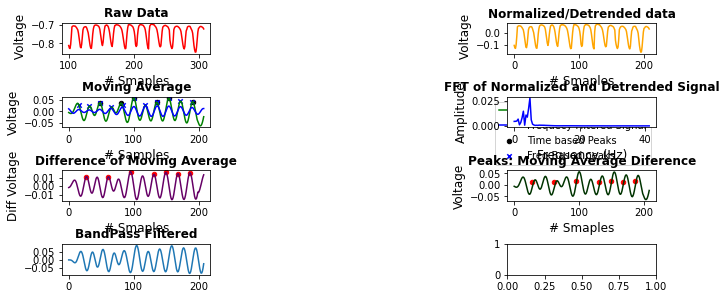

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.548736131117998
Kurtosis:  23.60125144827962
 33 Participant1/2021-07-01/rg_20210701-212116.csv ===========================
Sampling Frequency (Fs =):  92.10770659238626
num_samples_2: Fs*2.5  230.26926648096565
Number of Peaks in time based:  13
Number of Peaks in time based:  14
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 13 , 0.015533455739562007 , Freq =  5.206087763917484
pld_amplidute:  115
NEW FREQUENCYxf[np.array(AMP).argmax()]:  5.206087763917484


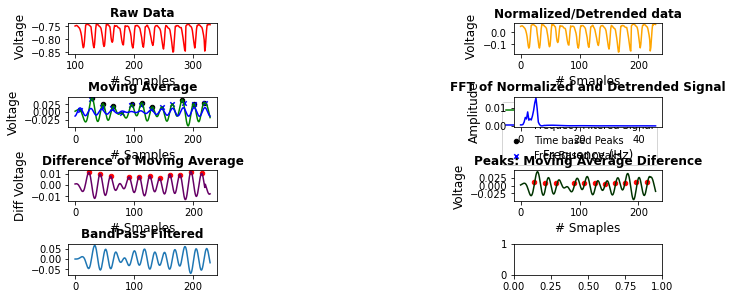

Medicaiton Time:  2_to_3_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.08295251580015
Kurtosis:  17.62719847305798
 34 Participant1/2021-07-02/rg_20210702-065005.csv ===========================
Sampling Frequency (Fs =):  79.26605504587155
num_samples_2: Fs*2.5  198.16513761467888
Number of Peaks in time based:  11
Number of Peaks in time based:  11
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 11 , 0.040273069987087434 , Freq =  4.403669724770642
pld_amplidute:  99
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.403669724770642


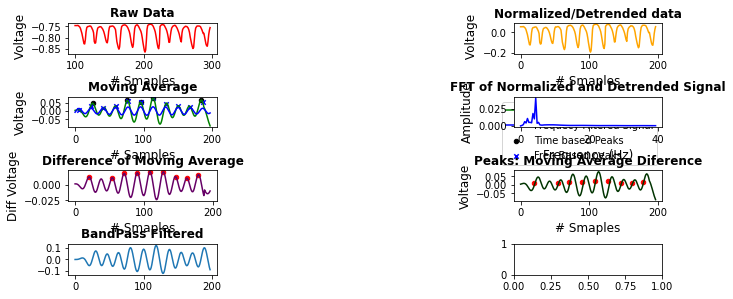

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  6.586061366978206
Kurtosis:  49.24184459554338
 35 Participant1/2021-07-02/rg_20210702-185148.csv ===========================
Sampling Frequency (Fs =):  81.11888111888112
num_samples_2: Fs*2.5  202.7972027972028
Number of Peaks in time based:  11
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 12 , 0.02855098431876057 , Freq =  4.818943432804819
pld_amplidute:  101
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.818943432804819


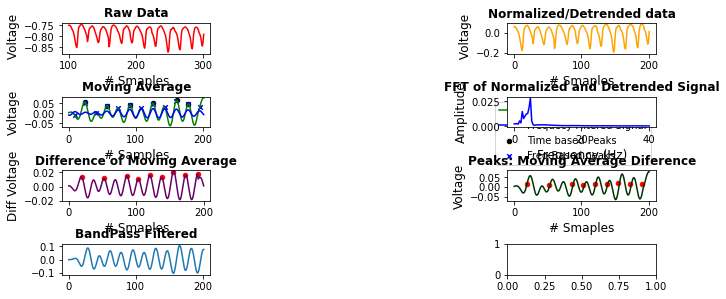

Medicaiton Time:  0_to_1_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.331329394538827
Kurtosis:  20.794581395093054
 36 Participant1/2021-07-03/rg_20210703-070405.csv ===========================
Sampling Frequency (Fs =):  81.11888111888112
num_samples_2: Fs*2.5  202.7972027972028
Number of Peaks in time based:  11
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 12 , 0.02855098431876057 , Freq =  4.818943432804819
pld_amplidute:  101
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.818943432804819


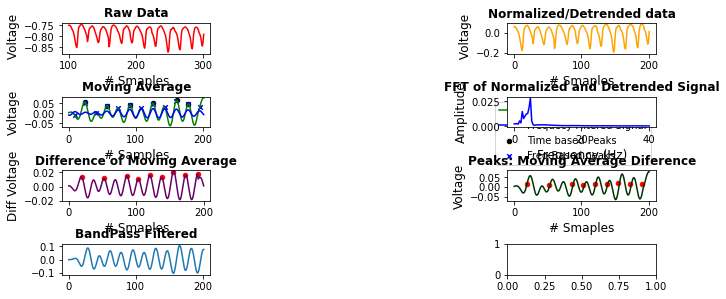

Medicaiton Time:  0_to_1_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.331329394538827
Kurtosis:  20.794581395093054
 37 Participant1/2021-07-04/rg_20210704-074924.csv ===========================
Sampling Frequency (Fs =):  93.85884509624198
num_samples_2: Fs*2.5  234.64711274060494
Number of Peaks in time based:  11
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 13 , 0.02208322730531712 , Freq =  5.214380283124554
pld_amplidute:  117
NEW FREQUENCYxf[np.array(AMP).argmax()]:  5.214380283124554


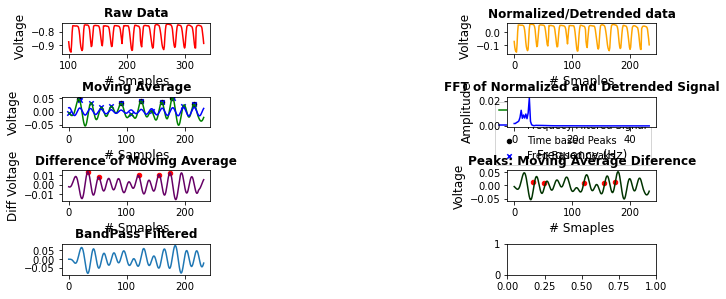

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.514062903180865
Kurtosis:  24.229833257336587
 38 Participant1/2021-07-04/rg_20210704-145340.csv ===========================
Sampling Frequency (Fs =):  91.93697868396664
num_samples_2: Fs*2.5  229.8424467099166
Number of Peaks in time based:  11
Number of Peaks in time based:  14
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 9 , 0.013061361362841202 , Freq =  3.6132437037366802
pld_amplidute:  114
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.6132437037366802


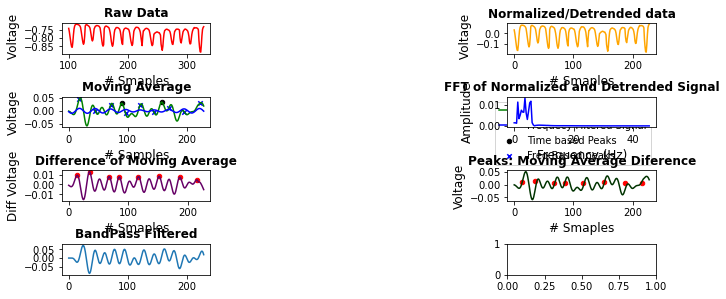

Medicaiton Time:  2_to_3_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.2869737693920915
Kurtosis:  10.209200018437478
 39 Participant1/2021-07-05/rg_20210705-125950.csv ===========================
Sampling Frequency (Fs =):  91.0091743119266
num_samples_2: Fs*2.5  227.5229357798165
Number of Peaks in time based:  12
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 13 , 0.022071068856331266 , Freq =  5.211979145616943
pld_amplidute:  113
NEW FREQUENCYxf[np.array(AMP).argmax()]:  5.211979145616943


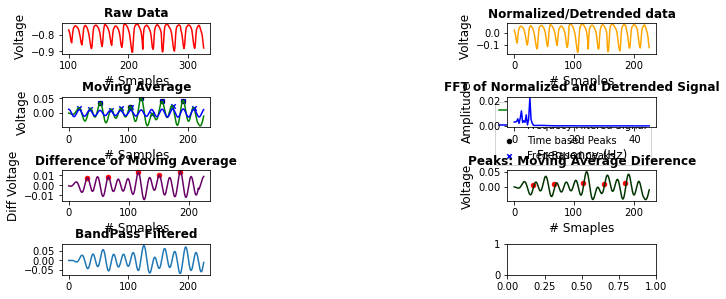

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.389589172829578
Kurtosis:  34.88210714714883
 40 Participant1/2021-07-05/rg_20210705-191026.csv ===========================
Sampling Frequency (Fs =):  81.65869218500798
num_samples_2: Fs*2.5  204.14673046251994
Number of Peaks in time based:  11
Number of Peaks in time based:  13
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 12 , 0.03081225370849931 , Freq =  4.803452481471058
pld_amplidute:  102
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.803452481471058


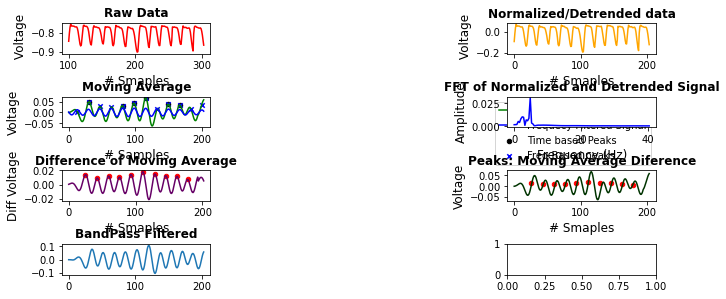

Medicaiton Time:  0_to_1_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  6.230961840931299
Kurtosis:  46.15865478209229
 41 Participant1/2021-07-06/rg_20210706-070145.csv ===========================
Sampling Frequency (Fs =):  81.9704433497537
num_samples_2: Fs*2.5  204.92610837438423
Number of Peaks in time based:  11
Number of Peaks in time based:  11
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 12 , 0.031411932296119084 , Freq =  4.821790785279629
pld_amplidute:  102
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.821790785279629


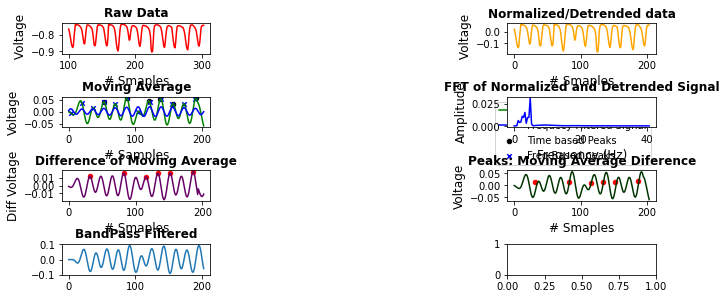

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.4741592298515656
Kurtosis:  35.242071931831234


In [34]:
results_p1, peak2peak_diff_freq_list1, peak2peak_diff_time_list1,withd_threshold_df,peak_amnplitude_df_freq,peak_amnplitude_df_timebased = process_iotex_data("Participant1","results_p1.csv")
results_p1 = results_p1[results_p1["FileName"] != "rg_20210703-070405.csv"]



In [ ]:
# results_p1.to_csv(output_file_results+"results_p1.csv",index=0)
# peak2peak_diff_freq_list1.to_csv(output_file_results+"results_p1_p2pdiff_freq.csv",index=0)
# peak2peak_diff_time_list1.to_csv(output_file_results+"results_p1_p2pdiff_time.csv",index=0)
# withd_threshold_df.to_csv(output_file_results+"results_p1_width_threshold.csv",index=0)
# peak_amnplitude_df_freq.to_csv(output_file_results+"results_p1_peak_amplitude_frequency.csv",index=0)
# peak_amnplitude_df_timebased.to_csv(output_file_results+"results_p1_peak_amplitude_time.csv",index=0)



 1 Participant2/2021-06-28/lg_20210628-153436.csv ===========================
Sampling Frequency (Fs =):  97.43101807802094
num_samples_2: Fs*2.5  243.57754519505235
Number of Peaks in time based:  9
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 3 , 0.017689929345044892 , Freq =  1.2028520750372955
pld_amplidute:  121
xf[AMP.argmax()]:  1.2028520750372955
xf[AMP.argmax()]:  2.405704150074591
xf[AMP.argmax()]:  1.603802766716394
xf[AMP.argmax()]:  2.0047534583954927
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.009506916790985


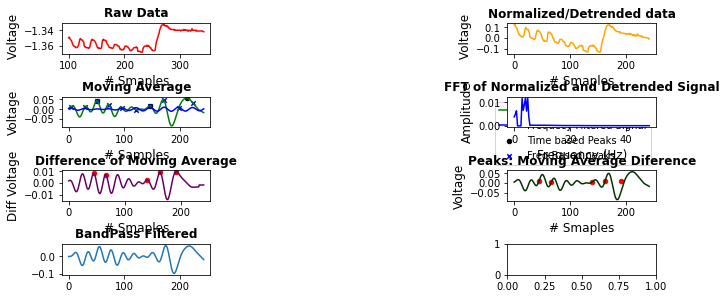

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.8431044942775663
Kurtosis:  14.248678232882249
 2 Participant2/2021-06-30/lg_20210630-153050.csv ===========================
Sampling Frequency (Fs =):  91.42857142857143
num_samples_2: Fs*2.5  228.57142857142858
Number of Peaks in time based:  7
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 3 , 0.022254354694129206 , Freq =  1.2030075187969926
pld_amplidute:  114
xf[AMP.argmax()]:  1.2030075187969926
xf[AMP.argmax()]:  1.6040100250626568
xf[AMP.argmax()]:  0.4010025062656642
xf[AMP.argmax()]:  0.8020050125313284
xf[AMP.argmax()]:  2.4060150375939853
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2080200501253135


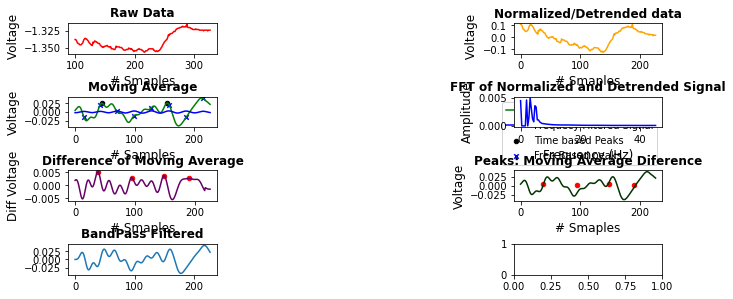

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.8350239676091142
Kurtosis:  14.046509079341227
 3 Participant2/2021-07-01/lg_20210701-001106.csv ===========================
Sampling Frequency (Fs =):  91.5157292659676
num_samples_2: Fs*2.5  228.78932316491898
Number of Peaks in time based:  9
Number of Peaks in time based:  11
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 4 , 0.02460160826335113 , Freq =  1.6055391099292562
pld_amplidute:  114
xf[AMP.argmax()]:  1.6055391099292562
xf[AMP.argmax()]:  2.4083086648938843
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.816617329787769


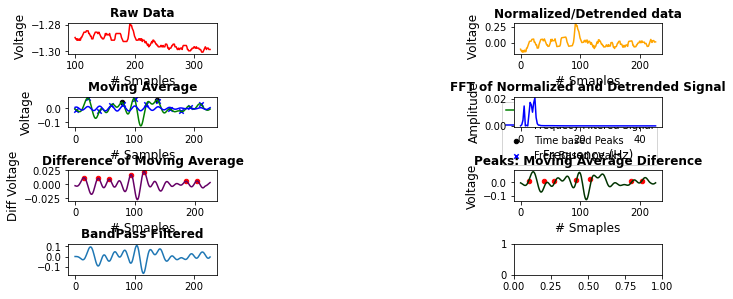

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.8503715258125437
Kurtosis:  13.937790623398563
 6 Participant2/2021-07-02/lg_20210702-171944.csv ===========================
Sampling Frequency (Fs =):  93.05816135084427
num_samples_2: Fs*2.5  232.64540337711068
Number of Peaks in time based:  9
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 8 , 0.01393297738748322 , Freq =  3.2089021155463544
pld_amplidute:  116
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2089021155463544


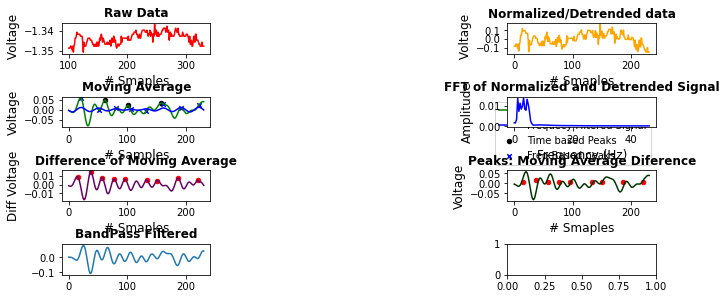

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.005478034288296
Kurtosis:  7.885961224914707
 7 Participant2/2021-07-03/lg_20210703-083853.csv ===========================
Sampling Frequency (Fs =):  93.20388349514563
num_samples_2: Fs*2.5  233.0097087378641
Number of Peaks in time based:  10
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 10 , 0.04354414900860767 , Freq =  4.0001666736114005
pld_amplidute:  116
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.0001666736114005


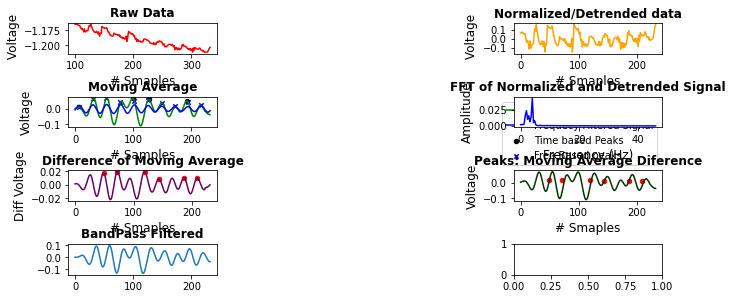

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.6618505562985035
Kurtosis:  37.05510693605525
 8 Participant2/2021-07-04/lg_20210704-080419.csv ===========================
Sampling Frequency (Fs =):  92.50985545335085
num_samples_2: Fs*2.5  231.27463863337712
Number of Peaks in time based:  10
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 7 , 0.012740291265859053 , Freq =  2.803328953131844
pld_amplidute:  115
xf[AMP.argmax()]:  2.803328953131844
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.805706776797447


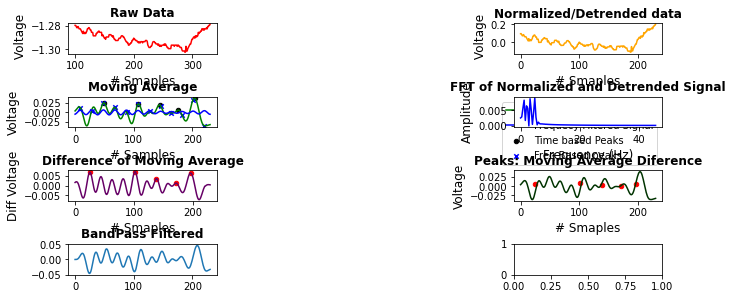

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.442894373124044
Kurtosis:  11.240577904100544
 9 Participant2/2021-07-04/lg_20210704-115503.csv ===========================
Sampling Frequency (Fs =):  0.06920802305939734
num_samples_2: Fs*2.5  0.17302005764849335
 10 Participant2/2021-07-05/lg_20210705-100219.csv ===========================
Sampling Frequency (Fs =):  93.38521400778211
num_samples_2: Fs*2.5  233.46303501945528
Number of Peaks in time based:  10
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 11 , 0.028798399971457632 , Freq =  4.408744008951087
pld_amplidute:  116
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.408744008951087


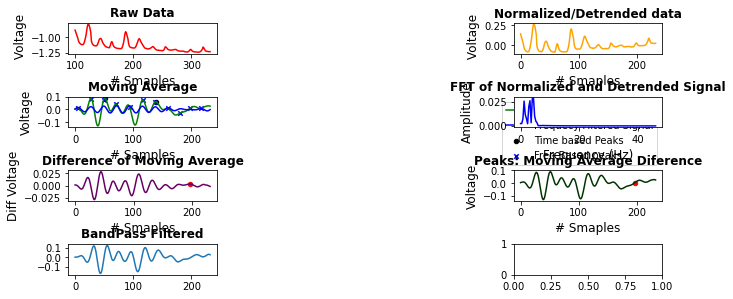

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.9803389834383025
Kurtosis:  15.152016538521856
 11 Participant2/2021-07-05/lg_20210705-105203.csv ===========================
Sampling Frequency (Fs =):  81.24488124488124
num_samples_2: Fs*2.5  203.1122031122031
Number of Peaks in time based:  10
Number of Peaks in time based:  11
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 11 , 0.032716066784188744 , Freq =  4.402431988638885
pld_amplidute:  101
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.402431988638885


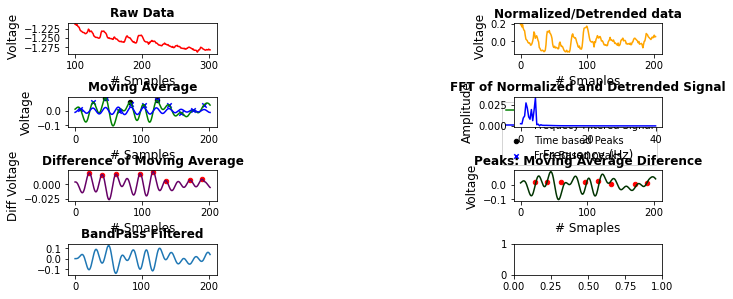

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.8008405557712286
Kurtosis:  14.604194834899587
 13 Participant2/2021-07-06/lg_20210706-105513.csv ===========================
Sampling Frequency (Fs =):  91.33858267716535
num_samples_2: Fs*2.5  228.34645669291336
Number of Peaks in time based:  6
Number of Peaks in time based:  11
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 3 , 0.010555499366238622 , Freq =  1.2018234562784915
pld_amplidute:  114
xf[AMP.argmax()]:  1.2018234562784915
xf[AMP.argmax()]:  2.0030390937974856
xf[AMP.argmax()]:  1.6024312750379885
xf[AMP.argmax()]:  2.80425473131648
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.807293825113966


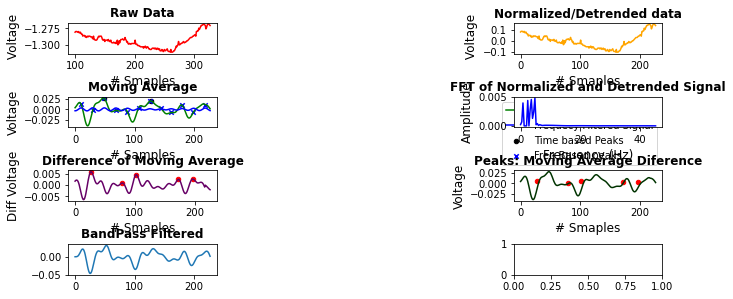

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.193418264729793
Kurtosis:  16.60653814909026
 15 Participant2/2021-06-28/rg_20210628-151121.csv ===========================
Sampling Frequency (Fs =):  93.34548769371011
num_samples_2: Fs*2.5  233.36371923427527
Number of Peaks in time based:  9
Number of Peaks in time based:  11
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 11 , 0.023353085985647684 , Freq =  4.406868517728803
pld_amplidute:  116
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.406868517728803


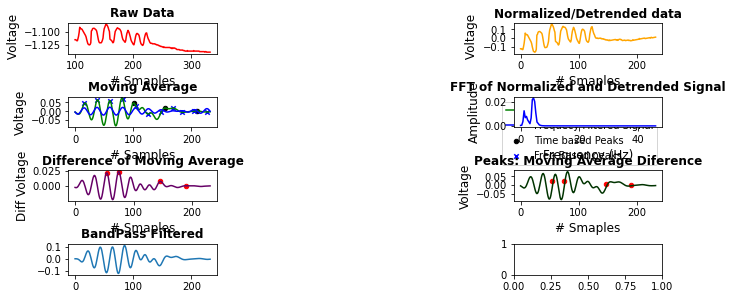

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.287375665799692
Kurtosis:  18.7115992802479
 16 Participant2/2021-06-28/rg_20210628-153436.csv ===========================
Sampling Frequency (Fs =):  96.875
num_samples_2: Fs*2.5  242.1875
Number of Peaks in time based:  9
Number of Peaks in time based:  11
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 11 , 0.02870505974139503 , Freq =  4.403409090909091
pld_amplidute:  121
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.403409090909091


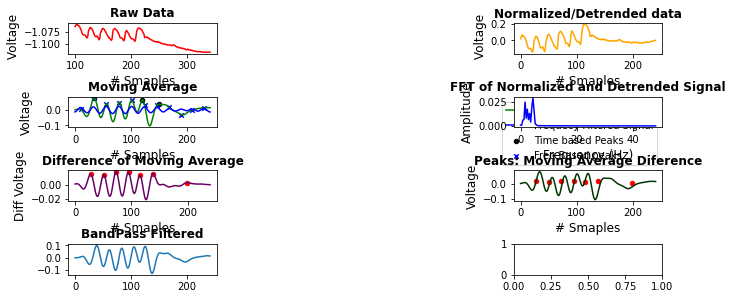

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.215848026661105
Kurtosis:  18.102685746761
 18 Participant2/2021-07-01/rg_20210701-001106.csv ===========================
Sampling Frequency (Fs =):  94.11764705882352
num_samples_2: Fs*2.5  235.2941176470588
Number of Peaks in time based:  11
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.02921842312817061 , Freq =  2.002503128911139
pld_amplidute:  117
xf[AMP.argmax()]:  2.002503128911139
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.806007509386733


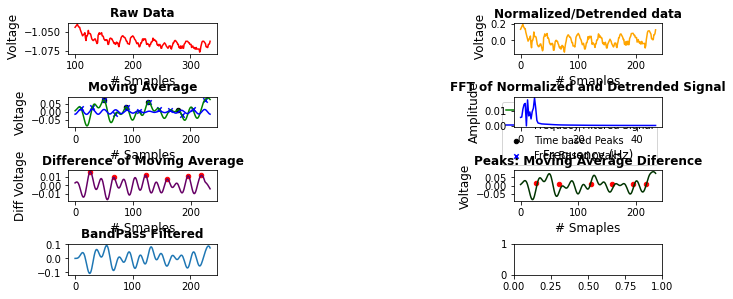

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.138317650464112
Kurtosis:  9.174183419113609
 19 Participant2/2021-07-01/rg_20210701-092555.csv ===========================
Sampling Frequency (Fs =):  92.39653512993262
num_samples_2: Fs*2.5  230.99133782483153
Number of Peaks in time based:  11
Number of Peaks in time based:  11
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 10 , 0.03186817353808648 , Freq =  4.017240657823157
pld_amplidute:  115
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.017240657823157


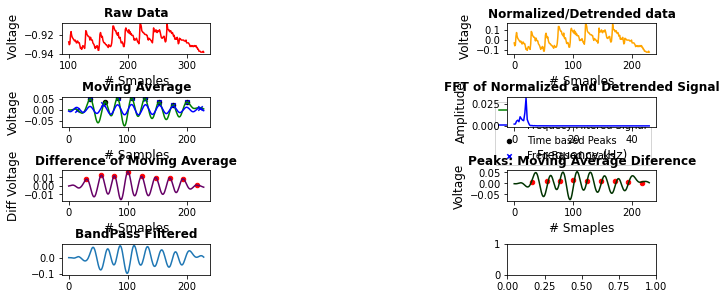

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.995413052653517
Kurtosis:  43.044867981460456
 20 Participant2/2021-07-02/rg_20210702-144253.csv ===========================
Sampling Frequency (Fs =):  92.02226345083488
num_samples_2: Fs*2.5  230.0556586270872
Number of Peaks in time based:  11
Number of Peaks in time based:  11
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 11 , 0.018202977806473432 , Freq =  4.401064773735582
pld_amplidute:  115
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.401064773735582


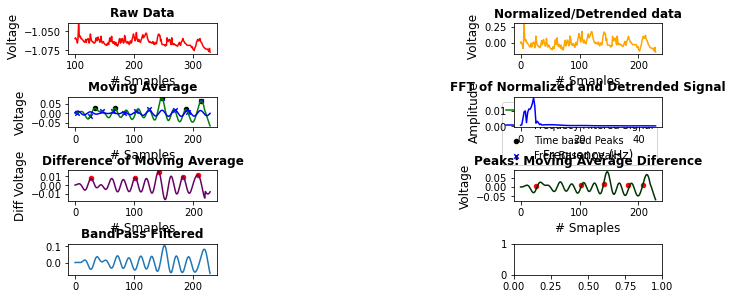

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.3305290424675214
Kurtosis:  10.444940697188107
 21 Participant2/2021-07-02/rg_20210702-171944.csv ===========================
Sampling Frequency (Fs =):  94.2100098135427
num_samples_2: Fs*2.5  235.52502453385674
Number of Peaks in time based:  6
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 3 , 0.02752873294585862 , Freq =  1.2026809763430983
pld_amplidute:  117
xf[AMP.argmax()]:  1.2026809763430983
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.40983024659136


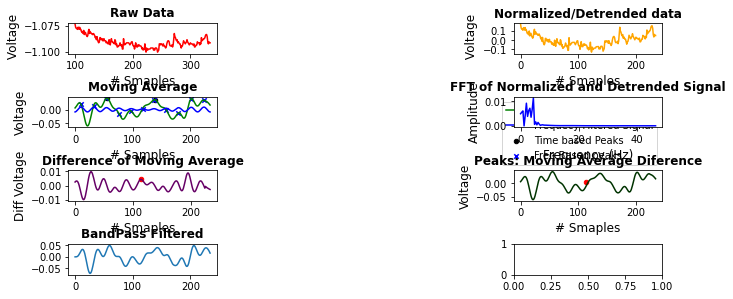

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.4498205238333806
Kurtosis:  11.874850152483438
 23 Participant2/2021-07-04/rg_20210704-080419.csv ===========================
Sampling Frequency (Fs =):  91.93697868396664
num_samples_2: Fs*2.5  229.8424467099166
Number of Peaks in time based:  10
Number of Peaks in time based:  11
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 11 , 0.022013527046106315 , Freq =  4.416186749011498
pld_amplidute:  114
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.416186749011498


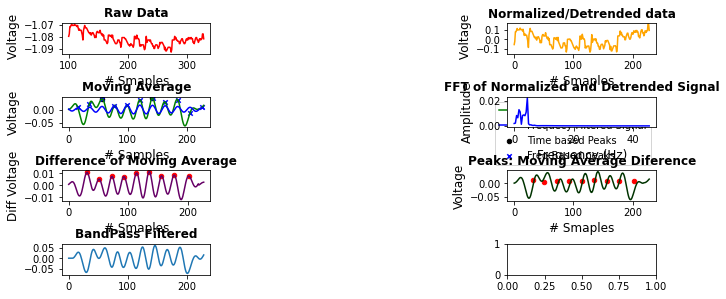

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.219376191488574
Kurtosis:  19.995270490468908
 25 Participant2/2021-07-05/rg_20210705-100219.csv ===========================
Sampling Frequency (Fs =):  85.459940652819
num_samples_2: Fs*2.5  213.6498516320475
Number of Peaks in time based:  9
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 9 , 0.04476421608592697 , Freq =  3.6109834078655916
pld_amplidute:  106
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.6109834078655916


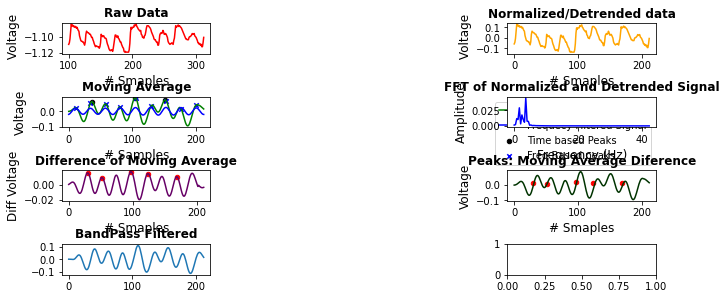

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.577444257145449
Kurtosis:  34.71499574426228
 26 Participant2/2021-07-05/rg_20210705-105203.csv ===========================
Sampling Frequency (Fs =):  94.58128078817734
num_samples_2: Fs*2.5  236.45320197044333
Number of Peaks in time based:  10
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 4 , 0.011799812786415186 , Freq =  1.6030725557318193
pld_amplidute:  118
xf[AMP.argmax()]:  1.6030725557318193
xf[AMP.argmax()]:  2.404608833597729
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.408449528262503


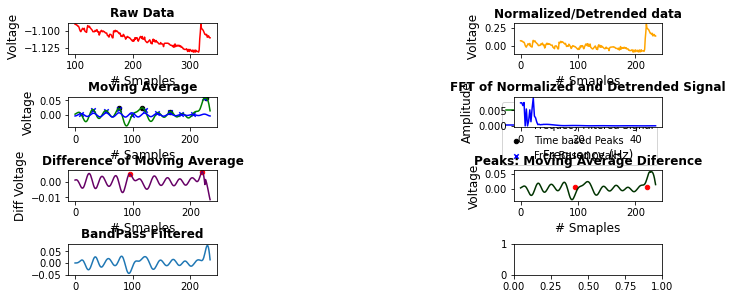

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.3504980712682393
Kurtosis:  10.207770174149022
 27 Participant2/2021-07-06/rg_20210706-095943.csv ===========================
Sampling Frequency (Fs =):  91.42857142857143
num_samples_2: Fs*2.5  228.57142857142858
Number of Peaks in time based:  10
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 10 , 0.04554890607523188 , Freq =  4.010025062656642
pld_amplidute:  114
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.010025062656642


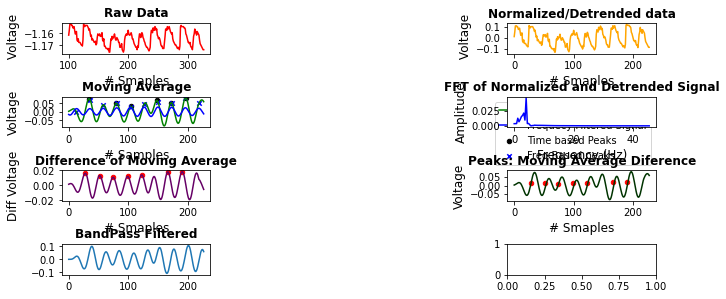

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.884461081823151
Kurtosis:  40.93328599698162
 28 Participant2/2021-07-06/rg_20210706-105513.csv ===========================
Sampling Frequency (Fs =):  81.7717206132879
num_samples_2: Fs*2.5  204.42930153321976
Number of Peaks in time based:  10
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 10 , 0.030138777592925266 , Freq =  4.008417677121956
pld_amplidute:  102
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.008417677121956


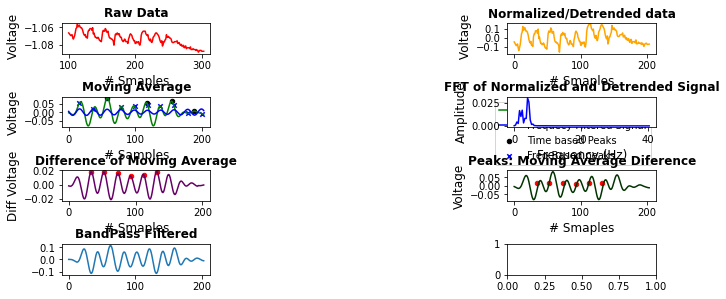

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.407053759729127
Kurtosis:  20.24976794754143


In [35]:
results_p2,peak2peak_diff_freq_list2,peak2peak_diff_time_list2,withd_threshold_df2,peak_amnplitude_df_freq2,peak_amnplitude_df_timebased2 = process_iotex_data("Participant2","results_p2.csv")


In [38]:
# results_p2.to_csv(output_file_results+"results_p2.csv",index=0)
# peak2peak_diff_freq_list2.to_csv(output_file_results+"results_p1_p2pdiff_freq2.csv",index=0)
# peak2peak_diff_time_list2.to_csv(output_file_results+"results_p1_p2pdiff_time2.csv",index=0)
# withd_threshold_df2.to_csv(output_file_results+"results_p1_width_threshold2.csv",index=0)
# peak_amnplitude_df_freq2.to_csv(output_file_results+"results_p1_peak_amplitude_frequency2.csv",index=0)
# peak_amnplitude_df_timebased2.to_csv(output_file_results+"results_p1_peak_amplitude_time2.csv",index=0)



 0 Participant3/2021-07-08/lg_20210708-100026.csv ===========================
Sampling Frequency (Fs =):  88.25741746761388
num_samples_2: Fs*2.5  220.6435436690347
Number of Peaks in time based:  7
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.014050890051243213 , Freq =  2.0058503969912245
pld_amplidute:  110
xf[AMP.argmax()]:  2.0058503969912245
xf[AMP.argmax()]:  1.2035102381947347
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.814040952778939


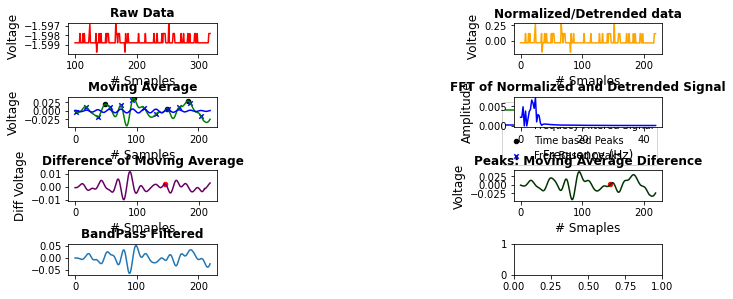

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.117616912865099
Kurtosis:  9.169932431420605
 1 Participant3/2021-07-08/lg_20210708-130053.csv ===========================
Sampling Frequency (Fs =):  88.03582853486884
num_samples_2: Fs*2.5  220.08957133717212
Number of Peaks in time based:  9
Number of Peaks in time based:  11
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 10 , 0.03227020921802926 , Freq =  4.0016285697667655
pld_amplidute:  110
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.0016285697667655


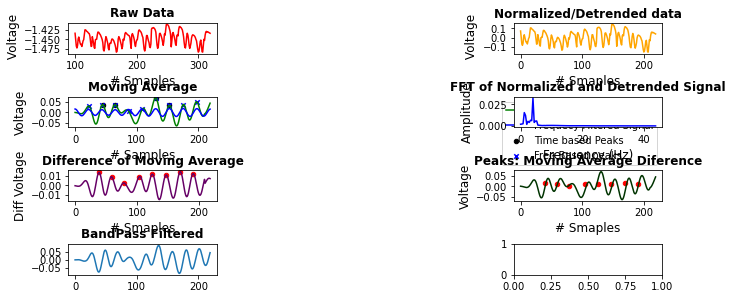

Medicaiton Time:  2_to_3_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  6.223590178663753
Kurtosis:  45.012423394778466
 2 Participant3/2021-07-09/lg_20210709-083010.csv ===========================
Sampling Frequency (Fs =):  90.75937785910338
num_samples_2: Fs*2.5  226.89844464775845
Number of Peaks in time based:  5
Number of Peaks in time based:  8
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.06604734345885824 , Freq =  2.0079508375907826
pld_amplidute:  113
xf[AMP.argmax()]:  2.0079508375907826
xf[AMP.argmax()]:  2.811131172627096
xf[AMP.argmax()]:  1.2047705025544697
xf[AMP.argmax()]:  1.6063606700726263
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.015901675181565


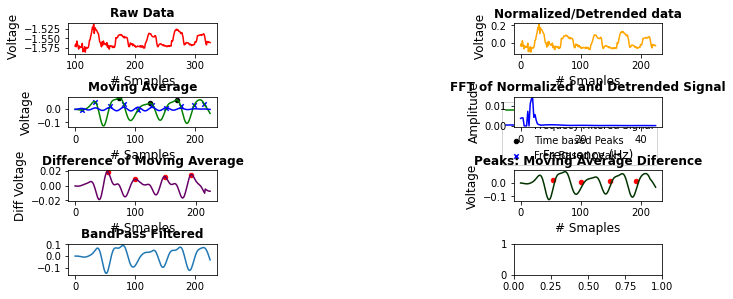

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.3905203998798195
Kurtosis:  19.779788555963247
 3 Participant3/2021-07-09/lg_20210709-093033.csv ===========================
Sampling Frequency (Fs =):  93.93939393939394
num_samples_2: Fs*2.5  234.84848484848484
Number of Peaks in time based:  9
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 6 , 0.006310856129438503 , Freq =  2.408702408702409
pld_amplidute:  117
xf[AMP.argmax()]:  2.408702408702409
xf[AMP.argmax()]:  2.8101528101528106
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.211603211603212


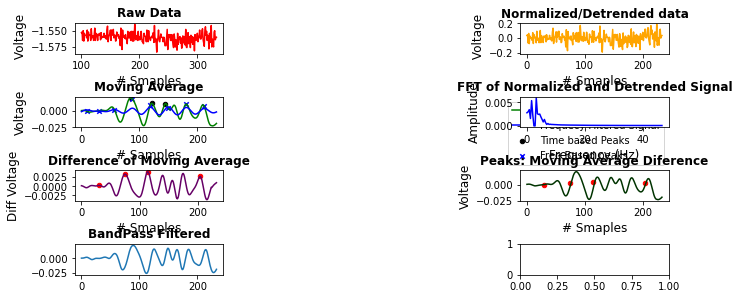

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.6641934696075524
Kurtosis:  14.48025922358238
 4 Participant3/2021-07-09/lg_20210709-103945.csv ===========================
Sampling Frequency (Fs =):  95.29298751200768
num_samples_2: Fs*2.5  238.23246878001922
Number of Peaks in time based:  10
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 8 , 0.011356161151272012 , Freq =  3.2031256306557205
pld_amplidute:  119
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2031256306557205


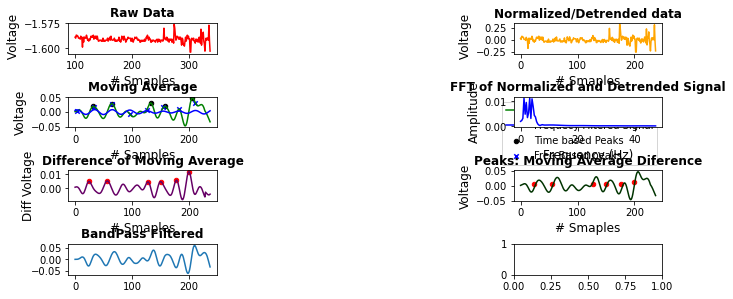

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.6114546439119732
Kurtosis:  12.736045842532464
 5 Participant3/2021-07-09/lg_20210709-135557.csv ===========================
Sampling Frequency (Fs =):  90.87221095334687
num_samples_2: Fs*2.5  227.18052738336718
Number of Peaks in time based:  6
Number of Peaks in time based:  7
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 6 , 0.059674856687573656 , Freq =  2.401908659559829
pld_amplidute:  113
xf[AMP.argmax()]:  2.401908659559829
xf[AMP.argmax()]:  2.0015905496331907
xf[AMP.argmax()]:  1.6012724397065528
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.40349920919302


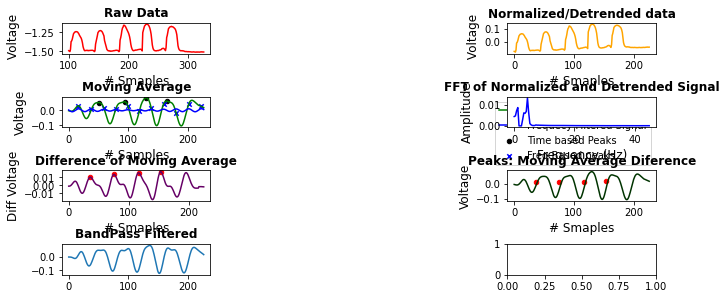

Medicaiton Time:  2_to_3_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.8447910649129358
Kurtosis:  15.706195708166309
 6 Participant3/2021-07-10/lg_20210710-091053.csv ===========================
Sampling Frequency (Fs =):  92.16921692169217
num_samples_2: Fs*2.5  230.42304230423042
Number of Peaks in time based:  7
Number of Peaks in time based:  8
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 6 , 0.0539441266252175 , Freq =  2.4044143544789263
pld_amplidute:  115
xf[AMP.argmax()]:  2.4044143544789263
xf[AMP.argmax()]:  2.003678628732439
xf[AMP.argmax()]:  1.602942902985951
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.408092983211366


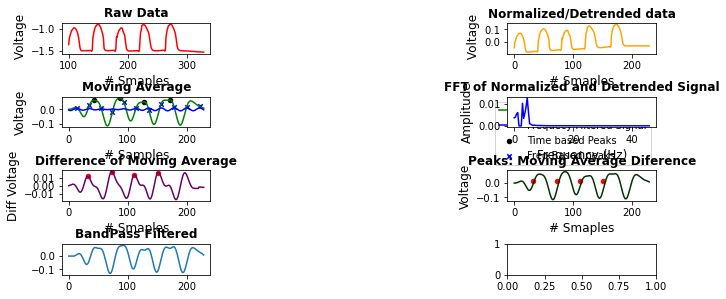

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.91705787636106
Kurtosis:  15.759773995753896
 7 Participant3/2021-07-10/lg_20210710-104537.csv ===========================
Sampling Frequency (Fs =):  91.18432769367764
num_samples_2: Fs*2.5  227.9608192341941
Number of Peaks in time based:  8
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.06028593809882219 , Freq =  2.0084653677021507
pld_amplidute:  113
xf[AMP.argmax()]:  2.0084653677021507
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.016930735404301


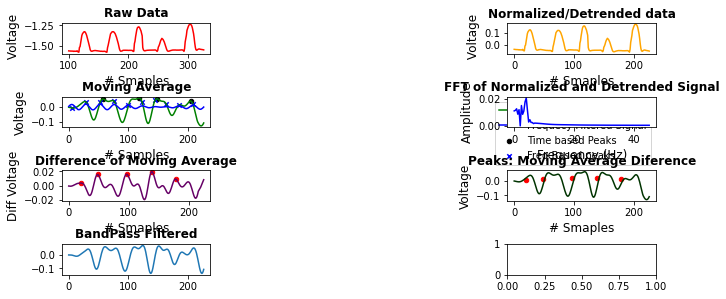

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.082210936295127
Kurtosis:  9.014711739487048
 8 Participant3/2021-07-11/lg_20210711-094656.csv ===========================
Sampling Frequency (Fs =):  89.92248062015504
num_samples_2: Fs*2.5  224.8062015503876
Number of Peaks in time based:  7
Number of Peaks in time based:  8
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.06097257227534181 , Freq =  2.007198228128461
pld_amplidute:  112
xf[AMP.argmax()]:  2.007198228128461
xf[AMP.argmax()]:  2.810077519379845
xf[AMP.argmax()]:  2.408637873754153
xf[AMP.argmax()]:  1.6057585825027687
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.014396456256922


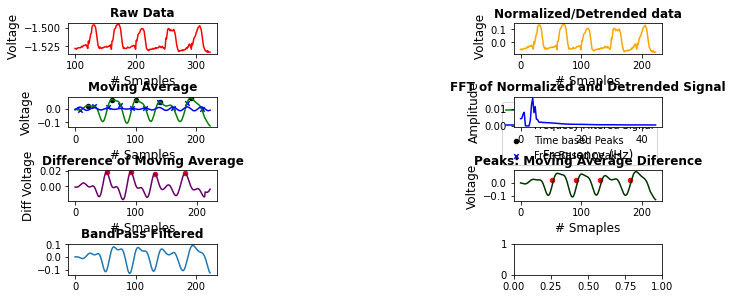

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.052950146203054
Kurtosis:  17.972058187372788
 9 Participant3/2021-07-11/lg_20210711-154554.csv ===========================
Sampling Frequency (Fs =):  91.83856502242152
num_samples_2: Fs*2.5  229.5964125560538
Number of Peaks in time based:  9
Number of Peaks in time based:  11
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.056906895923419555 , Freq =  2.005208843284313
pld_amplidute:  114
xf[AMP.argmax()]:  2.005208843284313
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.010417686568626


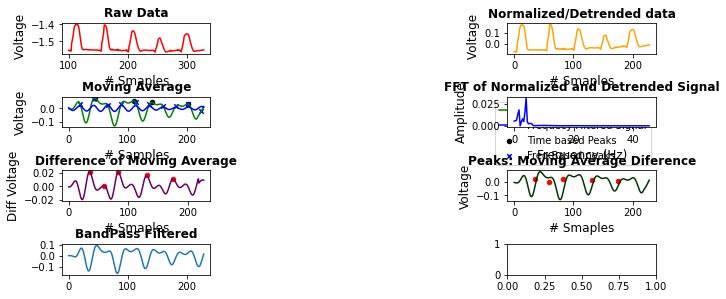

Medicaiton Time:  2_to_3_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.199045015007358
Kurtosis:  31.05379493696026
 10 Participant3/2021-07-12/lg_20210712-084406.csv ===========================
Sampling Frequency (Fs =):  90.1846452866861
num_samples_2: Fs*2.5  225.46161321671525
Number of Peaks in time based:  7
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.06747814157723536 , Freq =  2.0041032285930247
pld_amplidute:  112
xf[AMP.argmax()]:  2.0041032285930247
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2065651657488394


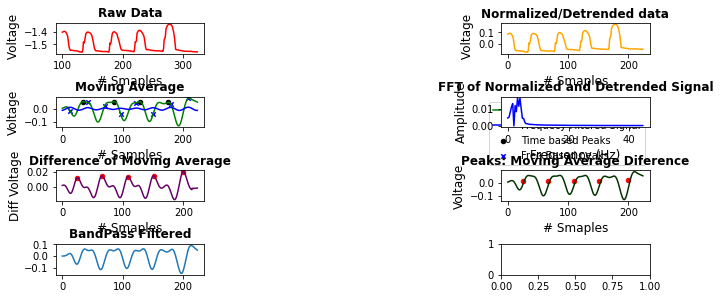

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.1336555955512257
Kurtosis:  9.037209271692483
 11 Participant3/2021-07-12/lg_20210712-105043.csv ===========================
Sampling Frequency (Fs =):  92.57232212666146
num_samples_2: Fs*2.5  231.43080531665365
Number of Peaks in time based:  8
Number of Peaks in time based:  11
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.0568775663727145 , Freq =  2.0037299161615034
pld_amplidute:  115
xf[AMP.argmax()]:  2.0037299161615034
xf[AMP.argmax()]:  2.805221882626105
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.007459832323007


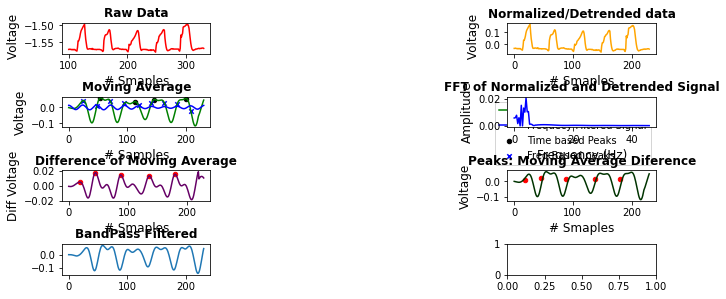

Medicaiton Time:  2_to_3_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.922352126057523
Kurtosis:  16.07204788200785
 12 Participant3/2021-07-13/lg_20210713-075054.csv ===========================
Sampling Frequency (Fs =):  94.7468958930277
num_samples_2: Fs*2.5  236.86723973256926
Number of Peaks in time based:  8
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.05502251802218937 , Freq =  2.0073494892590613
pld_amplidute:  118
xf[AMP.argmax()]:  2.0073494892590613
xf[AMP.argmax()]:  1.605879591407249
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.61322908066631


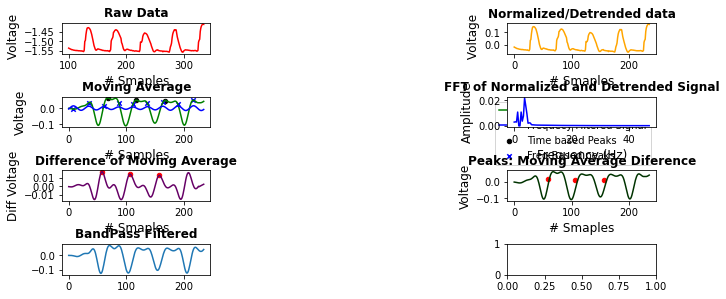

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.802621065130034
Kurtosis:  25.014106212026434
 13 Participant3/2021-07-13/lg_20210713-104541.csv ===========================
Sampling Frequency (Fs =):  88.12915479582146
num_samples_2: Fs*2.5  220.32288698955367
Number of Peaks in time based:  6
Number of Peaks in time based:  8
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 4 , 0.059674083640822204 , Freq =  1.6023482690149355
pld_amplidute:  110
xf[AMP.argmax()]:  1.6023482690149355
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.204696538029871


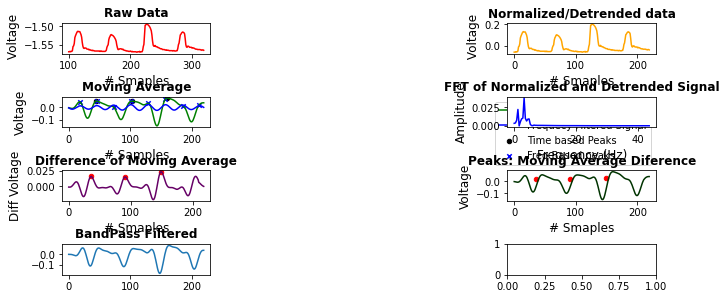

Medicaiton Time:  2_to_3_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.588735324581605
Kurtosis:  36.52897689674197
 14 Participant3/2021-07-14/lg_20210714-074534.csv ===========================
Sampling Frequency (Fs =):  96.78048780487805
num_samples_2: Fs*2.5  241.9512195121951
Number of Peaks in time based:  8
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.06364414761434532 , Freq =  2.0078939378605405
pld_amplidute:  120
xf[AMP.argmax()]:  2.0078939378605405
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.015787875721081


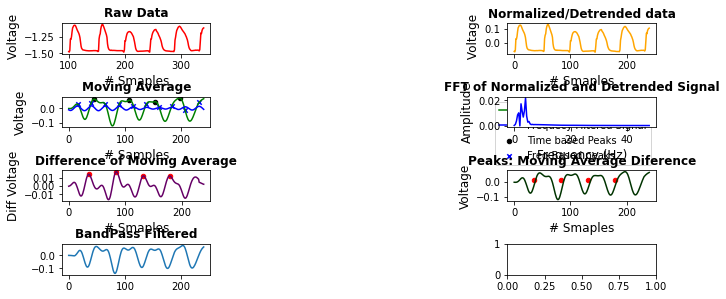

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.376467919608903
Kurtosis:  20.5341570353462
 15 Participant3/2021-07-14/lg_20210714-104520.csv ===========================
Sampling Frequency (Fs =):  91.25475285171103
num_samples_2: Fs*2.5  228.13688212927758
Number of Peaks in time based:  5
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.0543183803719539 , Freq =  2.00120072043226
pld_amplidute:  114
xf[AMP.argmax()]:  2.00120072043226
xf[AMP.argmax()]:  2.4014408645187117
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.402641584950972


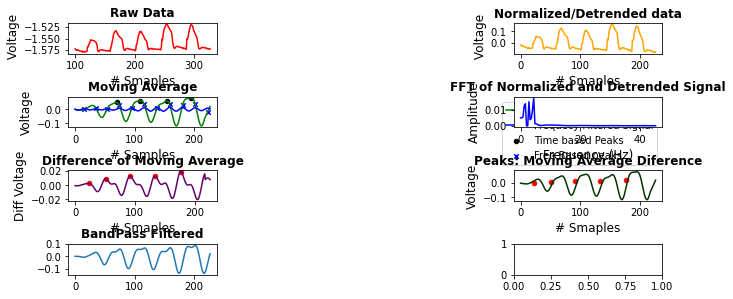

Medicaiton Time:  2_to_3_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.040362870164026
Kurtosis:  16.08323588494424
 16 Participant3/2021-07-15/lg_20210715-074541.csv ===========================
Sampling Frequency (Fs =):  83.56374807987712
num_samples_2: Fs*2.5  208.90937019969277
Number of Peaks in time based:  6
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 4 , 0.05487353351884287 , Freq =  1.6069951553822521
pld_amplidute:  104
xf[AMP.argmax()]:  1.6069951553822521
xf[AMP.argmax()]:  2.008743944227815
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.6157390996100673


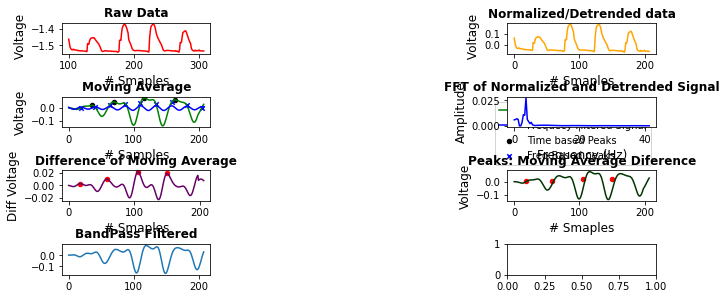

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.710570631766126
Kurtosis:  39.25209385206678
 17 Participant3/2021-07-15/lg_20210715-085044.csv ===========================
Sampling Frequency (Fs =):  90.65155807365439
num_samples_2: Fs*2.5  226.62889518413596
Number of Peaks in time based:  8
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 4 , 0.04502956976109815 , Freq =  1.6044523552859182
pld_amplidute:  113
xf[AMP.argmax()]:  1.6044523552859182
xf[AMP.argmax()]:  2.005565444107398
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.610017799393316


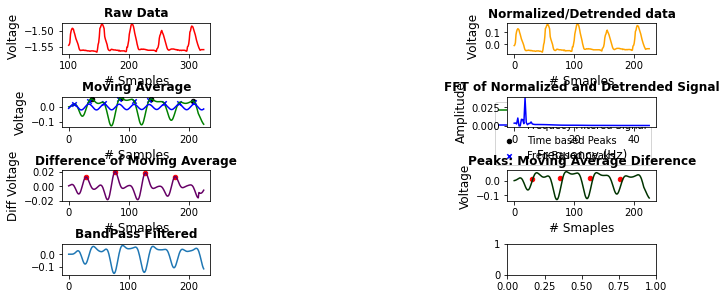

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  8.044811960897828
Kurtosis:  72.3658783895439
 18 Participant3/2021-07-16/lg_20210716-075517.csv ===========================
Sampling Frequency (Fs =):  92.8377153218495
num_samples_2: Fs*2.5  232.09428830462375
Number of Peaks in time based:  7
Number of Peaks in time based:  8
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 6 , 0.052138330116304386 , Freq =  2.4009753962547284
pld_amplidute:  116
xf[AMP.argmax()]:  2.4009753962547284
xf[AMP.argmax()]:  2.000812830212274
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.401788226467002


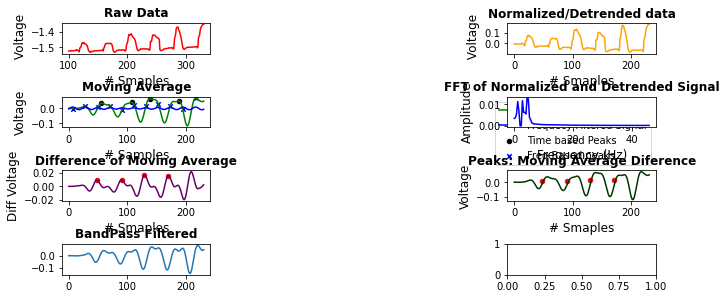

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.5067586308842977
Kurtosis:  11.984146670101753
 19 Participant3/2021-07-16/lg_20210716-091019.csv ===========================
Sampling Frequency (Fs =):  87.8316559926807
num_samples_2: Fs*2.5  219.57913998170173
Number of Peaks in time based:  8
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.05898801387024003 , Freq =  2.005288949604582
pld_amplidute:  109
xf[AMP.argmax()]:  2.005288949604582
xf[AMP.argmax()]:  1.6042311596836656
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.6095201092882476


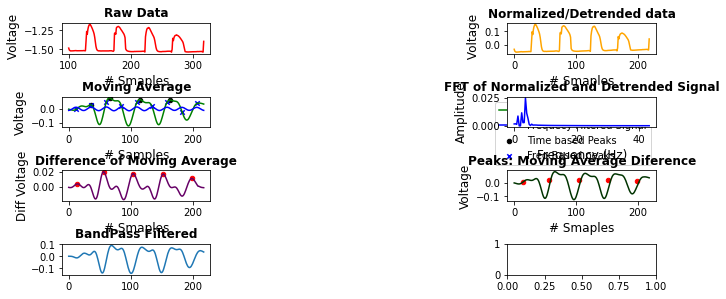

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.977979789864286
Kurtosis:  40.337564286379894
 20 Participant3/2021-07-08/rg_20210708-100026.csv ===========================
Sampling Frequency (Fs =):  90.20771513353115
num_samples_2: Fs*2.5  225.5192878338279
Number of Peaks in time based:  8
Number of Peaks in time based:  13
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 3 , 0.01629494515346463 , Freq =  1.2027695351137486
pld_amplidute:  112
xf[AMP.argmax()]:  1.2027695351137486
xf[AMP.argmax()]:  1.603692713484998
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.009231783712496


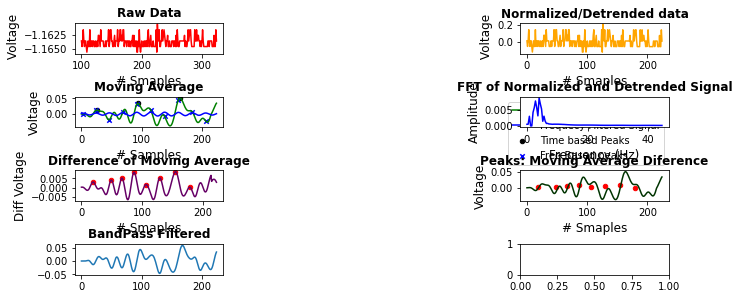

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.470186157570545
Kurtosis:  11.564686112646065
 21 Participant3/2021-07-08/rg_20210708-130053.csv ===========================
Sampling Frequency (Fs =):  95.37512846865364
num_samples_2: Fs*2.5  238.4378211716341
Number of Peaks in time based:  5
Number of Peaks in time based:  8
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 4 , 0.06796829354687589 , Freq =  1.6029433356076241
pld_amplidute:  119
xf[AMP.argmax()]:  1.6029433356076241
xf[AMP.argmax()]:  2.00367916950953
xf[AMP.argmax()]:  2.404415003411436
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2058866712152483


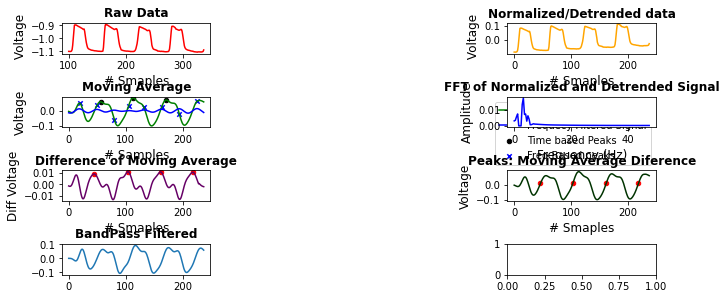

Medicaiton Time:  2_to_3_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.68986283635398
Kurtosis:  24.691714222487594
 22 Participant3/2021-07-09/rg_20210709-083010.csv ===========================
Sampling Frequency (Fs =):  91.42857142857142
num_samples_2: Fs*2.5  228.57142857142856
Number of Peaks in time based:  5
Number of Peaks in time based:  7
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.05877954742856547 , Freq =  2.0050125313283202
pld_amplidute:  114
xf[AMP.argmax()]:  2.0050125313283202
xf[AMP.argmax()]:  2.4060150375939844
xf[AMP.argmax()]:  1.6040100250626563
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2080200501253127


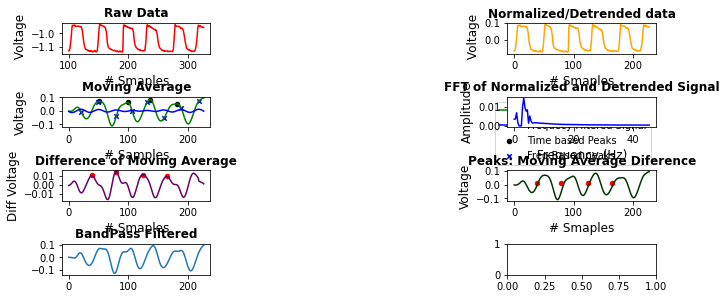

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.974811222143158
Kurtosis:  16.906749377715165
 23 Participant3/2021-07-09/rg_20210709-093033.csv ===========================
Sampling Frequency (Fs =):  93.72384937238493
num_samples_2: Fs*2.5  234.30962343096235
Number of Peaks in time based:  9
Number of Peaks in time based:  13
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 6 , 0.02435607710563322 , Freq =  2.403175624932947
pld_amplidute:  117
xf[AMP.argmax()]:  2.403175624932947
xf[AMP.argmax()]:  1.2015878124664734
NEW FREQUENCYxf[np.array(AMP).argmax()]:  5.206880520688051


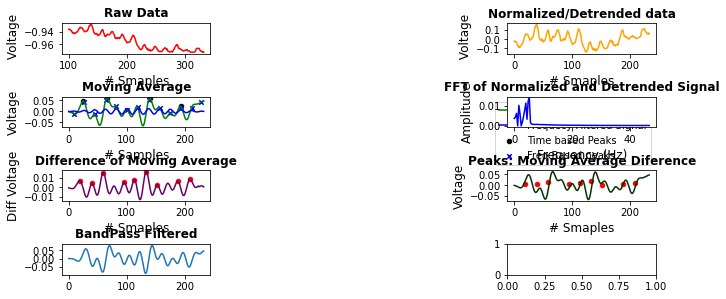

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.769675819317817
Kurtosis:  14.047871241575812
 24 Participant3/2021-07-09/rg_20210709-103945.csv ===========================
Sampling Frequency (Fs =):  94.7468958930277
num_samples_2: Fs*2.5  236.86723973256926
Number of Peaks in time based:  12
Number of Peaks in time based:  13
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 6 , 0.013831716043806801 , Freq =  2.4088193871108734
pld_amplidute:  118
xf[AMP.argmax()]:  2.4088193871108734
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.61322908066631


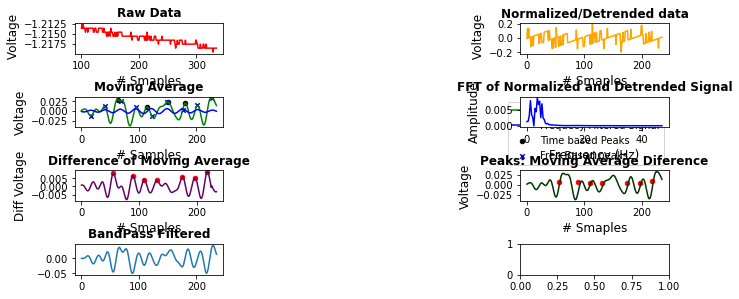

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.311761151536814
Kurtosis:  10.328695334026367
 25 Participant3/2021-07-09/rg_20210709-135557.csv ===========================
Sampling Frequency (Fs =):  93.05816135084427
num_samples_2: Fs*2.5  232.64540337711068
Number of Peaks in time based:  6
Number of Peaks in time based:  7
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 6 , 0.06152283333357845 , Freq =  2.4066765866597657
pld_amplidute:  116
xf[AMP.argmax()]:  2.4066765866597657
xf[AMP.argmax()]:  2.0055638222164713
xf[AMP.argmax()]:  1.6044510577731772
xf[AMP.argmax()]:  2.80778935110306
xf[AMP.argmax()]:  1.2033382933298828
xf[AMP.argmax()]:  0.8022255288865886
xf[AMP.argmax()]:  0.4011127644432943
xf[AMP.argmax()]:  0.0
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.4122404088762375


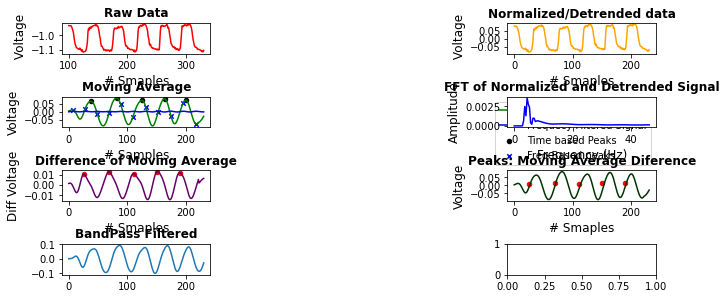

Medicaiton Time:  2_to_3_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.373561220262736
Kurtosis:  20.24332103278286
 26 Participant3/2021-07-10/rg_20210710-091053.csv ===========================
Sampling Frequency (Fs =):  90.0562851782364
num_samples_2: Fs*2.5  225.140712945591
Number of Peaks in time based:  6
Number of Peaks in time based:  6
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 6 , 0.0560108366555193 , Freq =  2.401500938086304
pld_amplidute:  112
xf[AMP.argmax()]:  2.401500938086304
xf[AMP.argmax()]:  2.0012507817385865
xf[AMP.argmax()]:  1.6010006253908693
xf[AMP.argmax()]:  2.8017510944340214
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2020012507817386


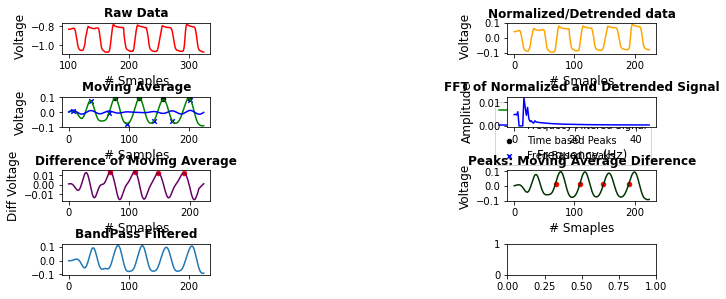

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.896859803695447
Kurtosis:  16.947380241078964
 27 Participant3/2021-07-10/rg_20210710-104537.csv ===========================
Sampling Frequency (Fs =):  92.53731343283582
num_samples_2: Fs*2.5  231.34328358208955
Number of Peaks in time based:  6
Number of Peaks in time based:  6
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 6 , 0.0715873608996032 , Freq =  2.40356658267106
pld_amplidute:  115
xf[AMP.argmax()]:  2.40356658267106
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.80713316534212


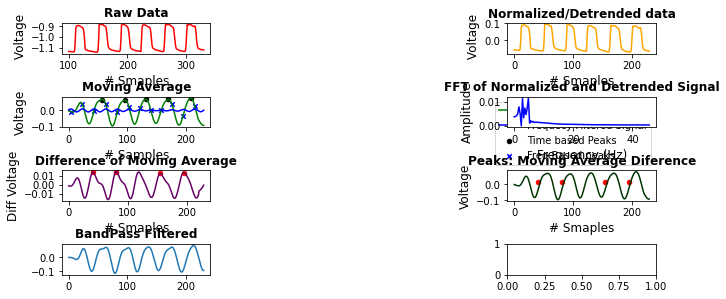

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.4965234547800397
Kurtosis:  12.82285082964657
 28 Participant3/2021-07-11/rg_20210711-094656.csv ===========================
Sampling Frequency (Fs =):  92.53731343283582
num_samples_2: Fs*2.5  231.34328358208955
Number of Peaks in time based:  5
Number of Peaks in time based:  8
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.06282971948283927 , Freq =  2.002972152225883
pld_amplidute:  115
xf[AMP.argmax()]:  2.002972152225883
xf[AMP.argmax()]:  2.40356658267106
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2047554435614134


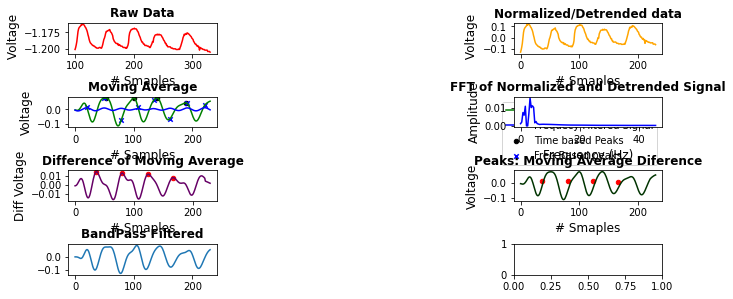

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.828506945374971
Kurtosis:  14.419447667698151
 29 Participant3/2021-07-11/rg_20210711-154554.csv ===========================
Sampling Frequency (Fs =):  92.27906976744185
num_samples_2: Fs*2.5  230.69767441860463
Number of Peaks in time based:  5
Number of Peaks in time based:  6
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 6 , 0.06212892694096795 , Freq =  2.4072800808897874
pld_amplidute:  115
xf[AMP.argmax()]:  2.4072800808897874
xf[AMP.argmax()]:  2.808493427704752
xf[AMP.argmax()]:  1.6048533872598583
xf[AMP.argmax()]:  2.006066734074823
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2097067745197165


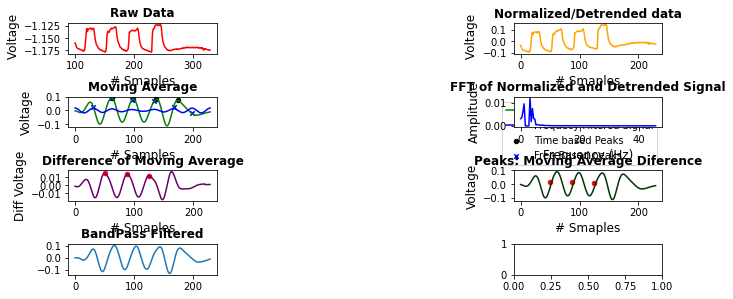

Medicaiton Time:  2_to_3_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.771617709189359
Kurtosis:  23.916042506800082
 30 Participant3/2021-07-12/rg_20210712-084406.csv ===========================
Sampling Frequency (Fs =):  86.59450457951706
num_samples_2: Fs*2.5  216.48626144879267
Number of Peaks in time based:  6
Number of Peaks in time based:  6
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.0687294077350479 , Freq =  2.0045024208221545
pld_amplidute:  108
xf[AMP.argmax()]:  2.0045024208221545
xf[AMP.argmax()]:  2.4054029049865853
xf[AMP.argmax()]:  1.6036019366577234
xf[AMP.argmax()]:  2.806303389151016
xf[AMP.argmax()]:  0.8018009683288617
xf[AMP.argmax()]:  0.40090048416443086
xf[AMP.argmax()]:  0.0
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.409905325808739


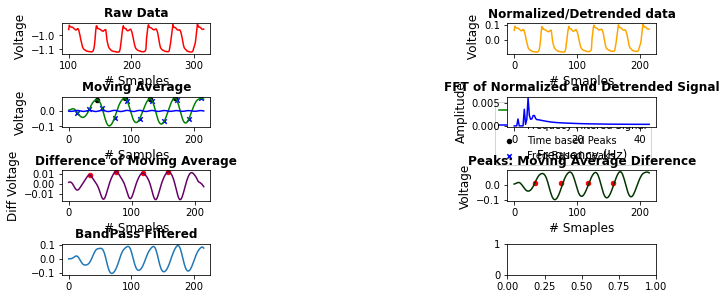

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.3968773555609095
Kurtosis:  25.70891900489242
 31 Participant3/2021-07-12/rg_20210712-105043.csv ===========================
Sampling Frequency (Fs =):  93.75
num_samples_2: Fs*2.5  234.375
Number of Peaks in time based:  6
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 6 , 0.04517660667908598 , Freq =  2.403846153846154
pld_amplidute:  117
xf[AMP.argmax()]:  2.403846153846154
xf[AMP.argmax()]:  2.003205128205128
xf[AMP.argmax()]:  1.6025641025641026
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.407051282051282


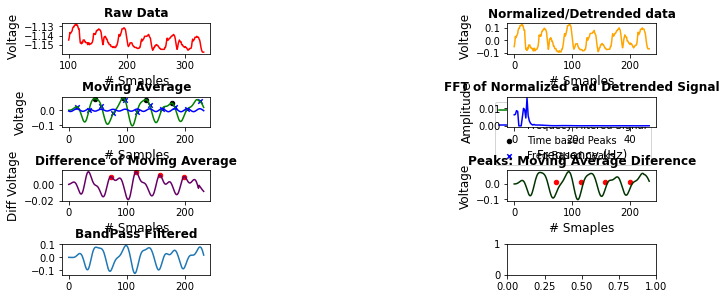

Medicaiton Time:  2_to_3_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.849114819863284
Kurtosis:  15.952753251978315
 32 Participant3/2021-07-13/rg_20210713-075054.csv ===========================
Sampling Frequency (Fs =):  96.57947686116701
num_samples_2: Fs*2.5  241.44869215291752
Number of Peaks in time based:  6
Number of Peaks in time based:  8
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 6 , 0.05990150726102219 , Freq =  2.404468303597519
pld_amplidute:  120
xf[AMP.argmax()]:  2.404468303597519
xf[AMP.argmax()]:  1.6029788690650126
xf[AMP.argmax()]:  2.0037235863312657
xf[AMP.argmax()]:  1.2022341517987596
xf[AMP.argmax()]:  2.805213020863772
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.007447172662531


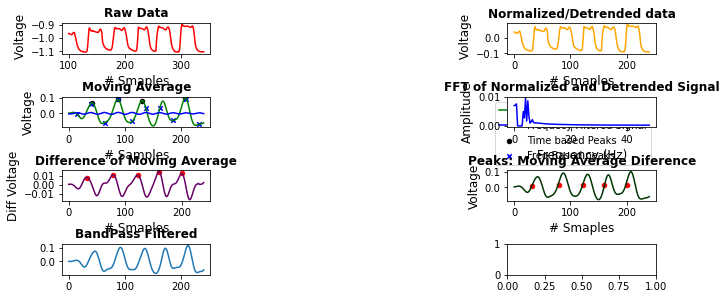

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.9323969327759656
Kurtosis:  15.050720926763383
 33 Participant3/2021-07-13/rg_20210713-104541.csv ===========================
Sampling Frequency (Fs =):  83.4314550042052
num_samples_2: Fs*2.5  208.578637510513
Number of Peaks in time based:  5
Number of Peaks in time based:  5
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 4 , 0.05916916185633831 , Freq =  1.6044510577731768
pld_amplidute:  104
xf[AMP.argmax()]:  1.6044510577731768
xf[AMP.argmax()]:  2.005563822216471
xf[AMP.argmax()]:  2.4066765866597652
xf[AMP.argmax()]:  1.2033382933298826
xf[AMP.argmax()]:  2.807789351103059
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.610014879989648


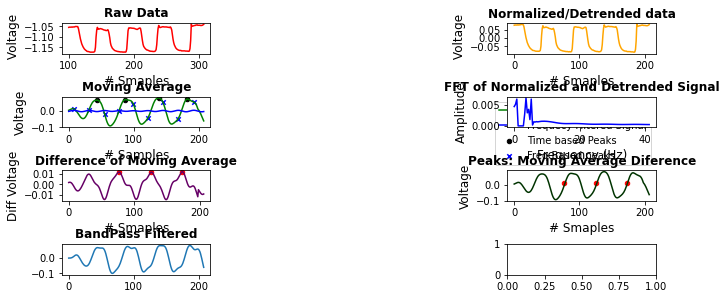

Medicaiton Time:  2_to_3_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.4080787116318136
Kurtosis:  11.156093303238867
 34 Participant3/2021-07-14/rg_20210714-074534.csv ===========================
Sampling Frequency (Fs =):  94.73684210526316
num_samples_2: Fs*2.5  236.84210526315792
Number of Peaks in time based:  6
Number of Peaks in time based:  8
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 6 , 0.03976820169024425 , Freq =  2.4085637823371995
pld_amplidute:  118
xf[AMP.argmax()]:  2.4085637823371995
xf[AMP.argmax()]:  2.0071364852809994
xf[AMP.argmax()]:  1.6057091882247996
xf[AMP.argmax()]:  1.2042818911685997
xf[AMP.argmax()]:  2.809991079393399
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.415700267618199


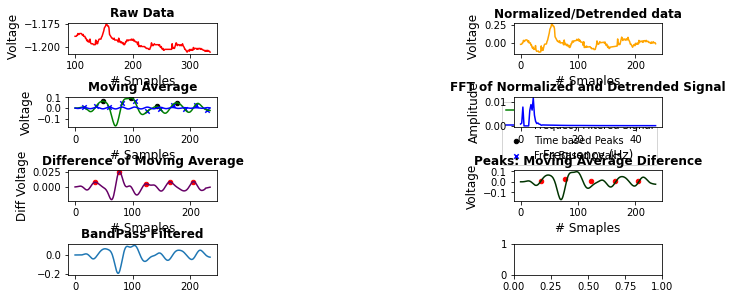

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.543930318918182
Kurtosis:  20.792278013218958
 35 Participant3/2021-07-14/rg_20210714-104520.csv ===========================
Sampling Frequency (Fs =):  91.97224975222993
num_samples_2: Fs*2.5  229.9306243805748
Number of Peaks in time based:  6
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.05200429238139736 , Freq =  2.008127723847815
pld_amplidute:  114
xf[AMP.argmax()]:  2.008127723847815
xf[AMP.argmax()]:  2.409753268617378
xf[AMP.argmax()]:  1.6065021790782519
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2130043581565038


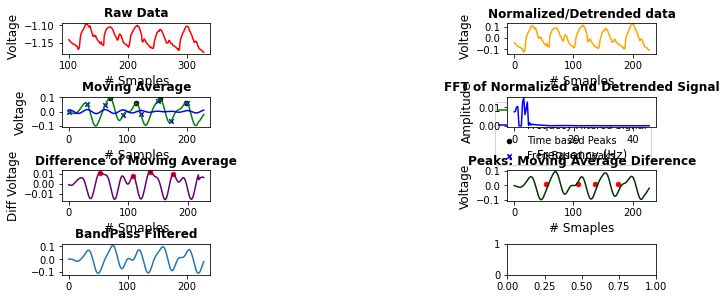

Medicaiton Time:  2_to_3_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.5036305124338982
Kurtosis:  11.282573099342125
 36 Participant3/2021-07-15/rg_20210715-074541.csv ===========================
Sampling Frequency (Fs =):  94.56625357483317
num_samples_2: Fs*2.5  236.41563393708293
Number of Peaks in time based:  6
Number of Peaks in time based:  6
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 6 , 0.04952952873052549 , Freq =  2.4042267858008435
pld_amplidute:  118
xf[AMP.argmax()]:  2.4042267858008435
xf[AMP.argmax()]:  2.0035223215007028
xf[AMP.argmax()]:  2.8049312501009838
xf[AMP.argmax()]:  1.2021133929004217
xf[AMP.argmax()]:  1.6028178572005622
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2056357144011245


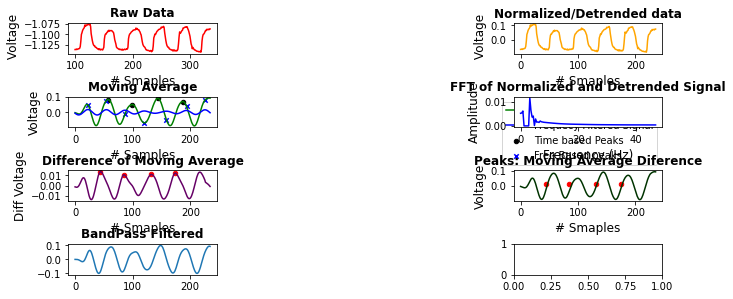

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.51897041178042
Kurtosis:  24.46532406500599
 37 Participant3/2021-07-15/rg_20210715-085044.csv ===========================
Sampling Frequency (Fs =):  92.33830845771143
num_samples_2: Fs*2.5  230.8457711442786
Number of Peaks in time based:  6
Number of Peaks in time based:  6
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.07360978051246828 , Freq =  2.007354531689379
pld_amplidute:  115
xf[AMP.argmax()]:  2.007354531689379
xf[AMP.argmax()]:  2.4088254380272547
xf[AMP.argmax()]:  0.8029418126757516
xf[AMP.argmax()]:  0.4014709063378758
xf[AMP.argmax()]:  0.0
xf[AMP.argmax()]:  2.8102963443651308
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2117672507030064


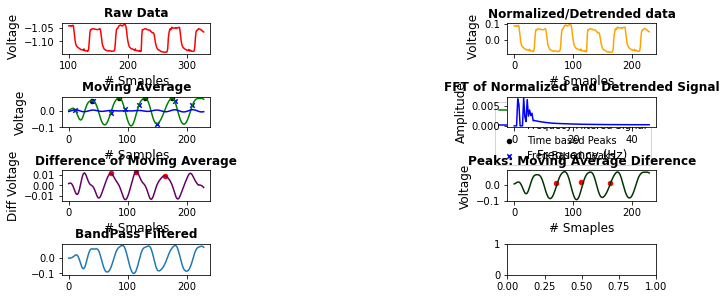

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.7909667772919353
Kurtosis:  14.54989848526472
 38 Participant3/2021-07-16/rg_20210716-075517.csv ===========================
Sampling Frequency (Fs =):  90.37952338923213
num_samples_2: Fs*2.5  225.94880847308033
Number of Peaks in time based:  6
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.04576849013518205 , Freq =  2.0084338530940475
pld_amplidute:  112
xf[AMP.argmax()]:  2.0084338530940475
xf[AMP.argmax()]:  2.410120623712857
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.016867706188095


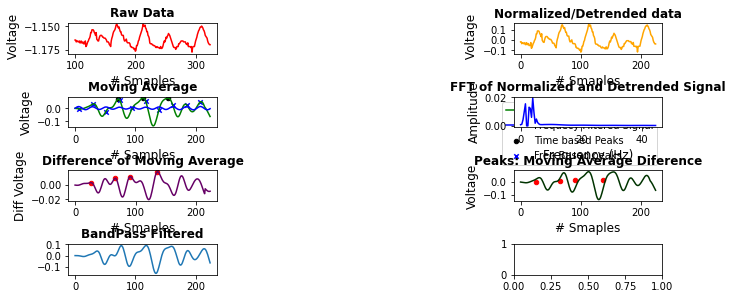

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.070581711267802
Kurtosis:  16.787899230371405
 39 Participant3/2021-07-16/rg_20210716-091019.csv ===========================
Sampling Frequency (Fs =):  89.48891031822566
num_samples_2: Fs*2.5  223.72227579556414
Number of Peaks in time based:  5
Number of Peaks in time based:  8
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.07576399939460524 , Freq =  2.0064778098256877
pld_amplidute:  111
xf[AMP.argmax()]:  2.0064778098256877
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.012955619651375


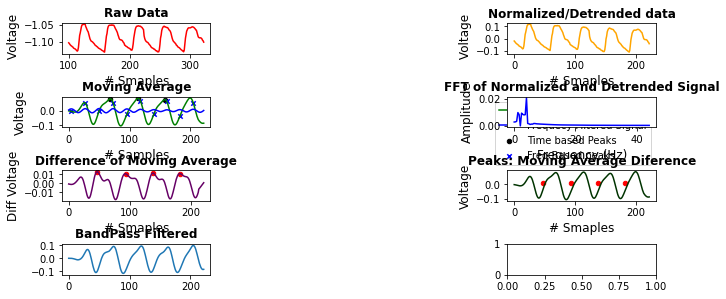

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.713169841827179
Kurtosis:  26.1573113582145


In [40]:
results_p3,peak2peak_diff_freq_list3,peak2peak_diff_time_list3,withd_threshold_df3,peak_amnplitude_df_freq3,peak_amnplitude_df_timebased3 = process_iotex_data("Participant3","results_p3.csv")



In [42]:
# results_p3.to_csv(output_file_results+"results_p3.csv",index=0)
# peak2peak_diff_freq_list3.to_csv(output_file_results+"results_p1_p2pdiff_freq3.csv",index=0)
# peak2peak_diff_time_list3.to_csv(output_file_results+"results_p1_p2pdiff_time3.csv",index=0)
# withd_threshold_df3.to_csv(output_file_results+"results_p1_width_threshold3.csv",index=0)
# peak_amnplitude_df_freq3.to_csv(output_file_results+"results_p1_peak_amplitude_frequency3.csv",index=0)
# peak_amnplitude_df_timebased3.to_csv(output_file_results+"results_p1_peak_amplitude_time3.csv",index=0)



 0 Participant4/2021-10-18/lg_20211018-184648.csv ===========================
Sampling Frequency (Fs =):  92.78642149929279
num_samples_2: Fs*2.5  231.96605374823196
Number of Peaks in time based:  7
Number of Peaks in time based:  7
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 7 , 0.05641208299511364 , Freq =  2.8117097424028117
pld_amplidute:  115
xf[AMP.argmax()]:  2.8117097424028117
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2133825627460704


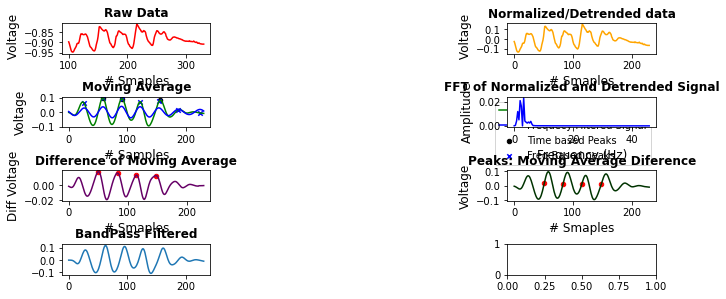

Medicaiton Time:  0_to_1_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.988429265961774
Kurtosis:  25.36285097278636
 1 Participant4/2021-10-19/lg_20211019-172844.csv ===========================
Sampling Frequency (Fs =):  92.67461669505963
num_samples_2: Fs*2.5  231.68654173764907
Number of Peaks in time based:  9
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 10 , 0.04625912394706321 , Freq =  4.0118881686173
pld_amplidute:  115
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.0118881686173


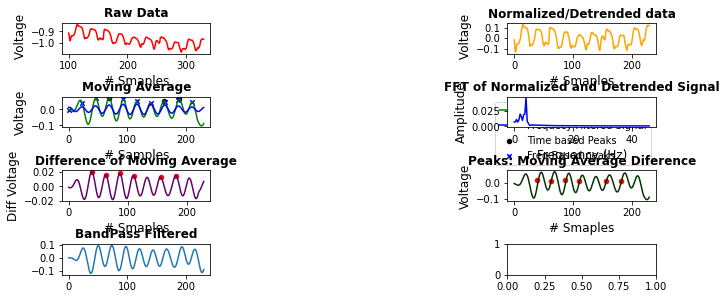

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.296100330886827
Kurtosis:  33.96932680355312
 2 Participant4/2021-10-19/lg_20211019-214518.csv ===========================
 3 Participant4/2021-10-20/lg_20211020-105349.csv ===========================
Sampling Frequency (Fs =):  91.06967615309127
num_samples_2: Fs*2.5  227.67419038272817
Number of Peaks in time based:  9
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 9 , 0.04957756372203944 , Freq =  3.610692006069697
pld_amplidute:  113
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.610692006069697


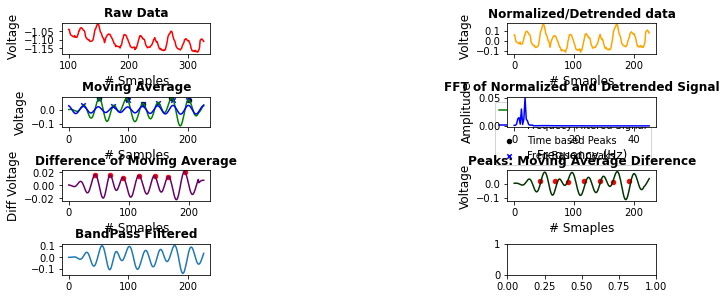

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  6.147020891366298
Kurtosis:  42.331088492814956
 5 Participant4/2021-10-21/lg_20211021-165751.csv ===========================
Sampling Frequency (Fs =):  92.62371615312792
num_samples_2: Fs*2.5  231.5592903828198
Number of Peaks in time based:  8
Number of Peaks in time based:  8
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 8 , 0.053621694443108416 , Freq =  3.2077477455628713
pld_amplidute:  115
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2077477455628713


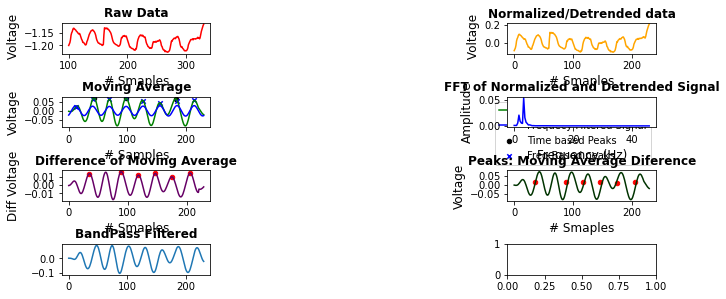

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  7.611765119200857
Kurtosis:  64.60682569999842
 6 Participant4/2021-10-22/lg_20211022-053129.csv ===========================
Sampling Frequency (Fs =):  175.82417582417582
num_samples_2: Fs*2.5  439.5604395604396
Number of Peaks in time based:  7
Number of Peaks in time based:  12
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 5 , 0.01969817807319932 , Freq =  2.002553255400636
pld_amplidute:  219
xf[AMP.argmax()]:  2.002553255400636
xf[AMP.argmax()]:  1.6020426043205087
xf[AMP.argmax()]:  2.80357455756089
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.806127812961526


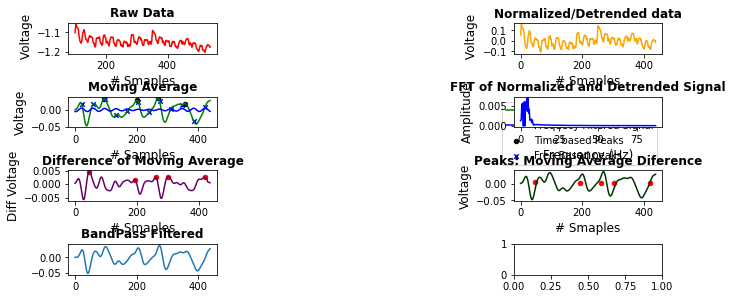

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.457255737492136
Kurtosis:  19.571055873737986
 7 Participant4/2021-10-22/lg_20211022-133556.csv ===========================
Sampling Frequency (Fs =):  93.17561419472247
num_samples_2: Fs*2.5  232.93903548680618
Number of Peaks in time based:  9
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 8 , 0.031686964291733066 , Freq =  3.21295221361112
pld_amplidute:  116
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.21295221361112


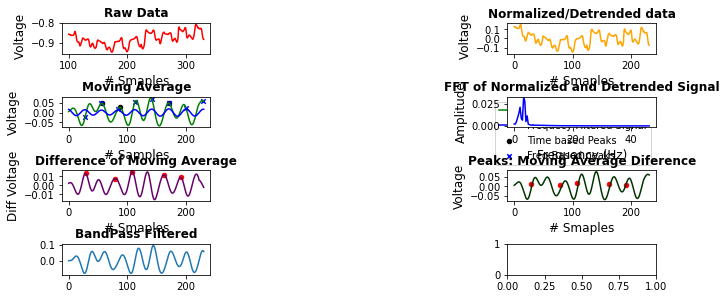

Medicaiton Time:  0_to_1_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.689974179209015
Kurtosis:  23.06778736985489
 11 Participant4/2021-10-27/lg_20211027-184737.csv ===========================
Sampling Frequency (Fs =):  95.8257713248639
num_samples_2: Fs*2.5  239.56442831215975
Number of Peaks in time based:  9
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 9 , 0.04180481114600802 , Freq =  3.608501849053452
pld_amplidute:  119
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.608501849053452


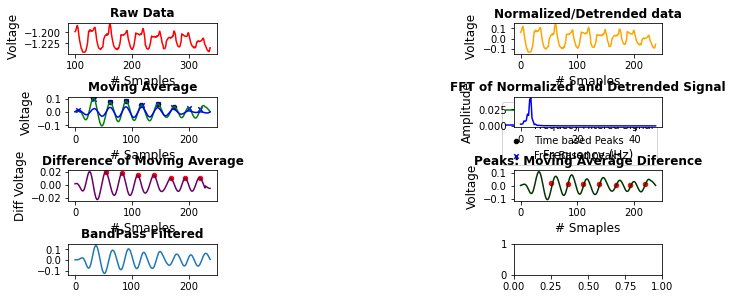

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.5918532267984355
Kurtosis:  33.33444089529928
 12 Participant4/2021-10-28/lg_20211028-115244.csv ===========================
Sampling Frequency (Fs =):  76.63088356729976
num_samples_2: Fs*2.5  191.5772089182494
Number of Peaks in time based:  7
Number of Peaks in time based:  7
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 7 , 0.06390504706321938 , Freq =  2.808461701419363
pld_amplidute:  95
xf[AMP.argmax()]:  2.808461701419363
xf[AMP.argmax()]:  2.4072528869308827
xf[AMP.argmax()]:  2.0060440724424025
xf[AMP.argmax()]:  1.6048352579539218
xf[AMP.argmax()]:  1.2036264434654413
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2096705159078436


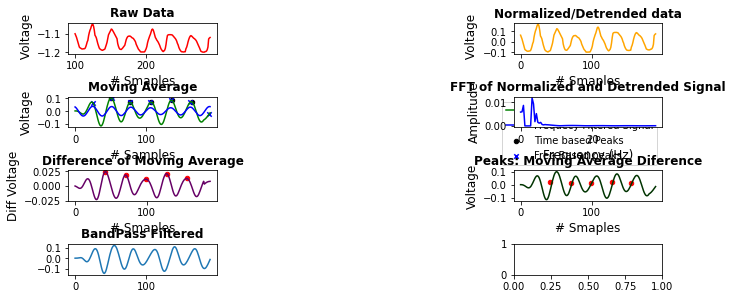

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.026725706008324
Kurtosis:  16.030011026904624
 13 Participant4/2021-10-28/lg_20211028-175651.csv ===========================
Sampling Frequency (Fs =):  97.50692520775623
num_samples_2: Fs*2.5  243.76731301939057
Number of Peaks in time based:  9
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 9 , 0.05528052498693251 , Freq =  3.611367600287268
pld_amplidute:  121
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.611367600287268


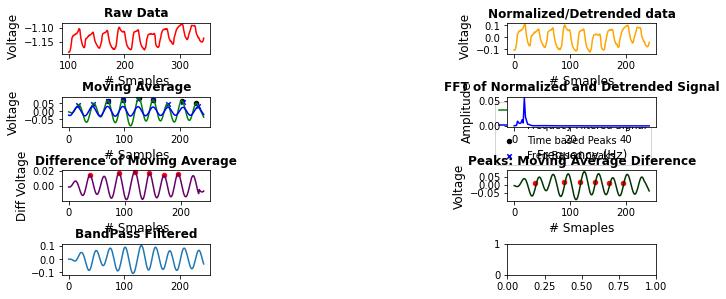

Medicaiton Time:  0_to_1_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  8.136266416107814
Kurtosis:  74.12369559282115
 14 Participant4/2021-10-29/lg_20211029-153037.csv ===========================
Sampling Frequency (Fs =):  97.50692520775623
num_samples_2: Fs*2.5  243.76731301939057
Number of Peaks in time based:  9
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 9 , 0.05528052498693251 , Freq =  3.611367600287268
pld_amplidute:  121
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.611367600287268


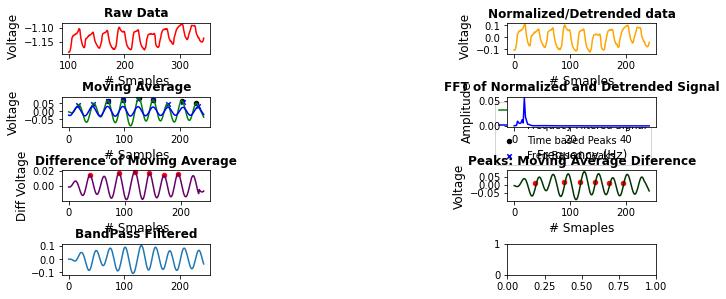

Medicaiton Time:  0_to_1_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  8.136266416107814
Kurtosis:  74.12369559282115
 15 Participant4/2021-10-29/lg_20211029-182954.csv ===========================
Sampling Frequency (Fs =):  96.96969696969697
num_samples_2: Fs*2.5  242.42424242424244
Number of Peaks in time based:  8
Number of Peaks in time based:  8
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 8 , 0.038553389556529 , Freq =  3.2056098171800653
pld_amplidute:  121
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2056098171800653


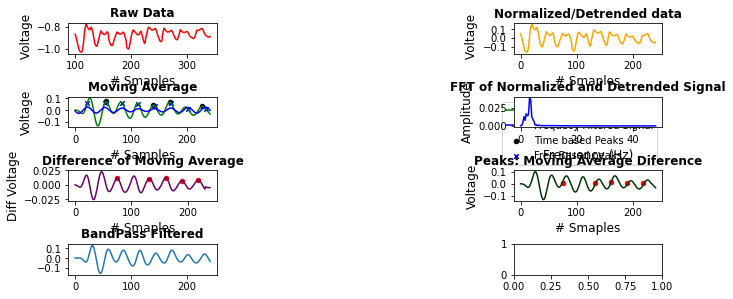

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.970464531003166
Kurtosis:  26.931320775893855
 16 Participant4/2021-10-30/lg_20211030-095315.csv ===========================
Sampling Frequency (Fs =):  95.52238805970148
num_samples_2: Fs*2.5  238.8059701492537
Number of Peaks in time based:  9
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 9 , 0.051090009936967246 , Freq =  3.612191145114762
pld_amplidute:  119
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.612191145114762


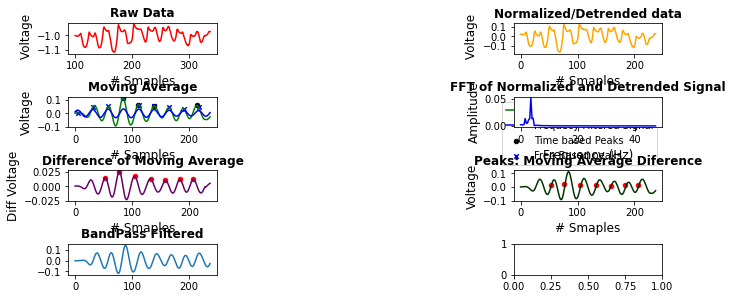

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  7.4318676463764755
Kurtosis:  63.53060589772366
 17 Participant4/2021-10-30/lg_20211030-185943.csv ===========================
Sampling Frequency (Fs =):  94.85614646904969
num_samples_2: Fs*2.5  237.14036617262423
Number of Peaks in time based:  9
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 8 , 0.034167680986097924 , Freq =  3.201895239461593
pld_amplidute:  118
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.201895239461593


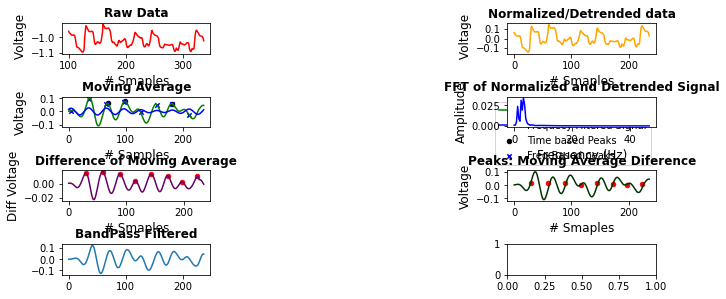

Medicaiton Time:  0_to_1_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.427148118990353
Kurtosis:  19.23798983639479
 18 Participant4/2021-10-31/lg_20211031-133028.csv ===========================
Sampling Frequency (Fs =):  93.94495412844036
num_samples_2: Fs*2.5  234.8623853211009
Number of Peaks in time based:  8
Number of Peaks in time based:  8
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 8 , 0.05670861091758673 , Freq =  3.211793303536423
pld_amplidute:  117
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.211793303536423


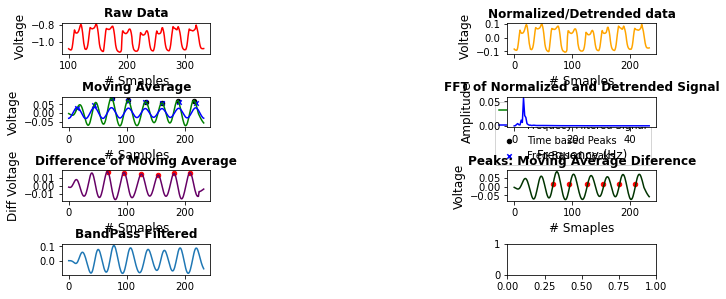

Medicaiton Time:  0_to_1_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  7.8158820029427565
Kurtosis:  67.5921148080408
 19 Participant4/2021-10-31/lg_20211031-190553.csv ===========================
Sampling Frequency (Fs =):  94.3778801843318
num_samples_2: Fs*2.5  235.9447004608295
Number of Peaks in time based:  8
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 8 , 0.057916921567805674 , Freq =  3.212864006275125
pld_amplidute:  117
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.212864006275125


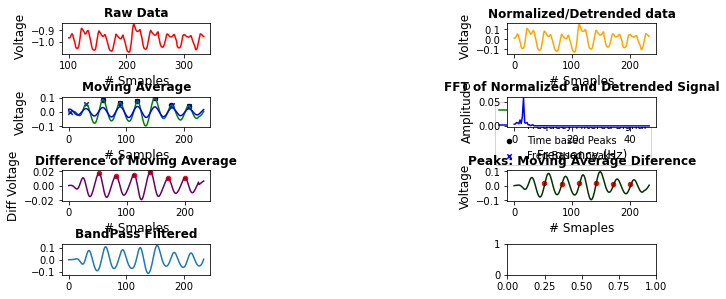

Medicaiton Time:  0_to_1_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  8.172734117041577
Kurtosis:  74.17911433464
 20 Participant4/2021-10-18/rg_20211018-184648.csv ===========================
Sampling Frequency (Fs =):  93.32079021636876
num_samples_2: Fs*2.5  233.30197554092192
Number of Peaks in time based:  8
Number of Peaks in time based:  7
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 7 , 0.06943032842810028 , Freq =  2.803628890620521
pld_amplidute:  116
xf[AMP.argmax()]:  2.803628890620521
xf[AMP.argmax()]:  2.4031104776747325
xf[AMP.argmax()]:  1.6020736517831549
xf[AMP.argmax()]:  2.0025920647289435
xf[AMP.argmax()]:  0.8010368258915774
xf[AMP.argmax()]:  1.2015552388373663
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2041473035663097


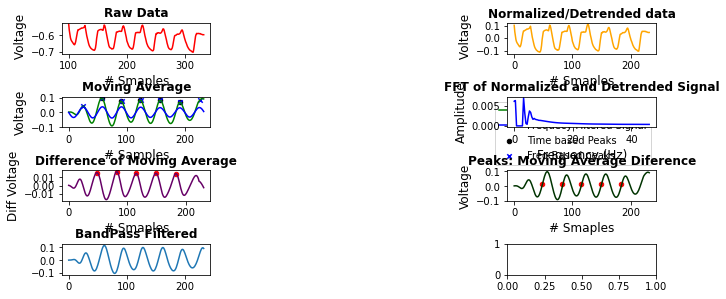

Medicaiton Time:  0_to_1_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.838293410954171
Kurtosis:  16.013964076148067
 21 Participant4/2021-10-19/rg_20211019-172844.csv ===========================
Sampling Frequency (Fs =):  91.69054441260744
num_samples_2: Fs*2.5  229.2263610315186
Number of Peaks in time based:  10
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 10 , 0.039933384279497906 , Freq =  4.0039539044806745
pld_amplidute:  114
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.0039539044806745


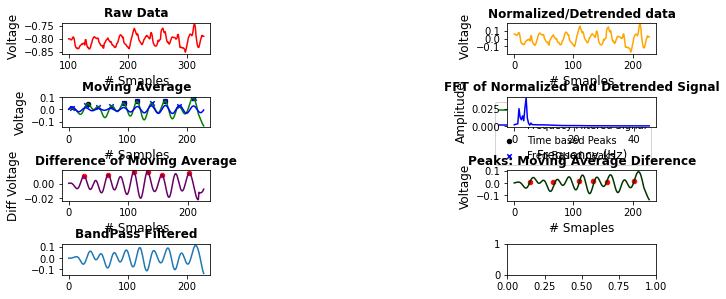

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.020564604282482
Kurtosis:  27.699317868145997
 22 Participant4/2021-10-19/rg_20211019-214518.csv ===========================
 23 Participant4/2021-10-20/rg_20211020-105349.csv ===========================
Sampling Frequency (Fs =):  95.20153550863724
num_samples_2: Fs*2.5  238.00383877159308
Number of Peaks in time based:  10
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 9 , 0.045551448693050785 , Freq =  3.600058065452669
pld_amplidute:  119
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.600058065452669


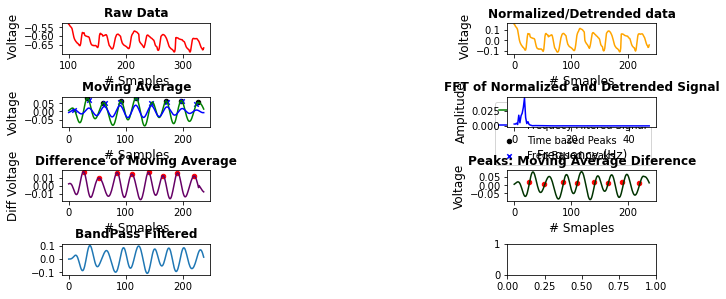

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.30966014210331
Kurtosis:  31.274953363599344
 24 Participant4/2021-10-20/rg_20211020-190820.csv ===========================
Sampling Frequency (Fs =):  92.66409266409266
num_samples_2: Fs*2.5  231.66023166023166
Number of Peaks in time based:  8
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 7 , 0.047846215765758586 , Freq =  2.8080028080028083
pld_amplidute:  115
xf[AMP.argmax()]:  2.8080028080028083
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2091460662889237


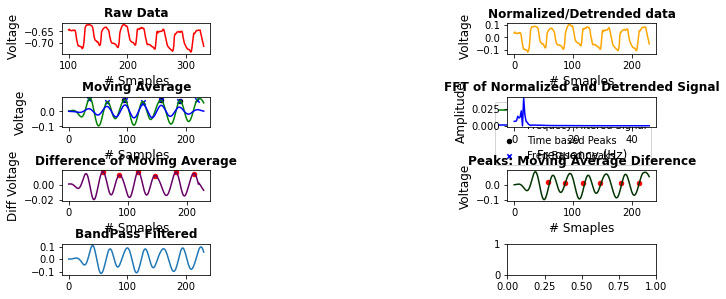

Medicaiton Time:  0_to_1_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.384576950668
Kurtosis:  34.14664699446029
 25 Participant4/2021-10-21/rg_20211021-165751.csv ===========================
Sampling Frequency (Fs =):  91.34157944814463
num_samples_2: Fs*2.5  228.35394862036156
Number of Peaks in time based:  8
Number of Peaks in time based:  8
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 7 , 0.06567597829636984 , Freq =  2.8043467374430366
pld_amplidute:  114
xf[AMP.argmax()]:  2.8043467374430366
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.204967699934899


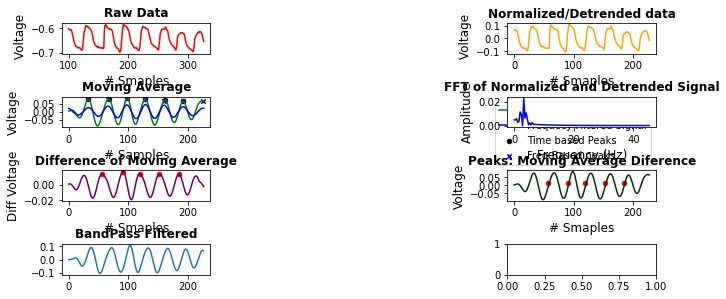

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.115452564129861
Kurtosis:  31.312468204952154
 26 Participant4/2021-10-22/rg_20211022-053129.csv ===========================
Sampling Frequency (Fs =):  92.13051823416507
num_samples_2: Fs*2.5  230.32629558541265
Number of Peaks in time based:  11
Number of Peaks in time based:  11
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 11 , 0.020456564708246475 , Freq =  4.40624217641659
pld_amplidute:  115
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.40624217641659


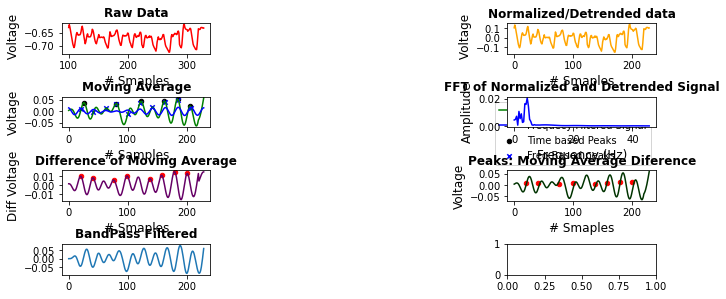

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  3.8354936028597093
Kurtosis:  14.845615983871166
 27 Participant4/2021-10-22/rg_20211022-133556.csv ===========================
Sampling Frequency (Fs =):  94.20702754036088
num_samples_2: Fs*2.5  235.5175688509022
Number of Peaks in time based:  9
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 9 , 0.052710055176590075 , Freq =  3.6079287143116936
pld_amplidute:  117
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.6079287143116936


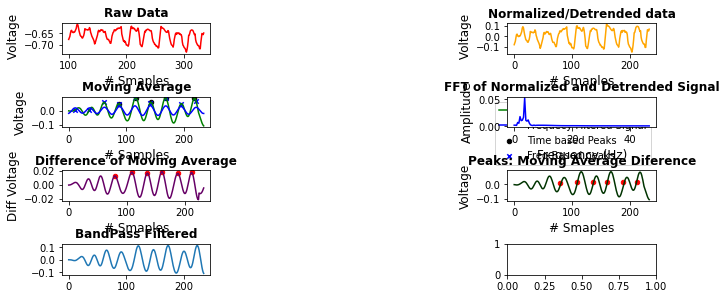

Medicaiton Time:  0_to_1_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  6.935126644056144
Kurtosis:  56.801705312706105
 31 Participant4/2021-10-27/rg_20211027-184737.csv ===========================
Sampling Frequency (Fs =):  95.16728624535317
num_samples_2: Fs*2.5  237.91821561338293
Number of Peaks in time based:  8
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 8 , 0.061368907349803374 , Freq =  3.2123978479444104
pld_amplidute:  118
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2123978479444104


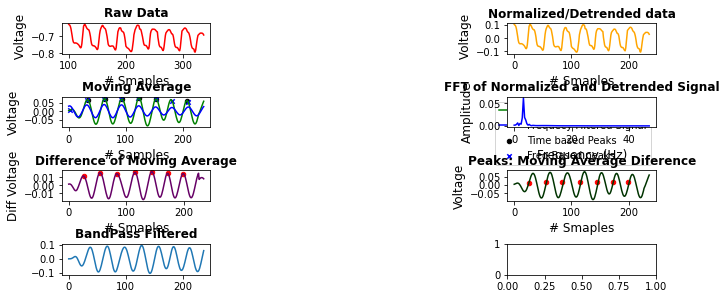

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  8.127431057067895
Kurtosis:  73.02454137812252
 33 Participant4/2021-10-28/rg_20211028-175651.csv ===========================
Sampling Frequency (Fs =):  92.21902017291066
num_samples_2: Fs*2.5  230.54755043227664
Number of Peaks in time based:  6
Number of Peaks in time based:  7
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 7 , 0.061493856407857116 , Freq =  2.806665831349455
pld_amplidute:  115
xf[AMP.argmax()]:  2.806665831349455
xf[AMP.argmax()]:  2.4057135697281042
xf[AMP.argmax()]:  2.0047613081067532
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.608570354592156


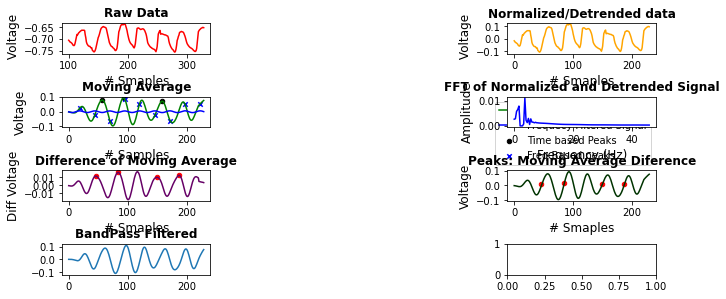

Medicaiton Time:  0_to_1_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  4.736091627930801
Kurtosis:  24.974156550620087
 34 Participant4/2021-10-29/rg_20211029-153037.csv ===========================
Sampling Frequency (Fs =):  94.3778801843318
num_samples_2: Fs*2.5  235.9447004608295
Number of Peaks in time based:  9
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 10 , 0.05128576010321677 , Freq =  4.0160800078439065
pld_amplidute:  117
NEW FREQUENCYxf[np.array(AMP).argmax()]:  4.0160800078439065


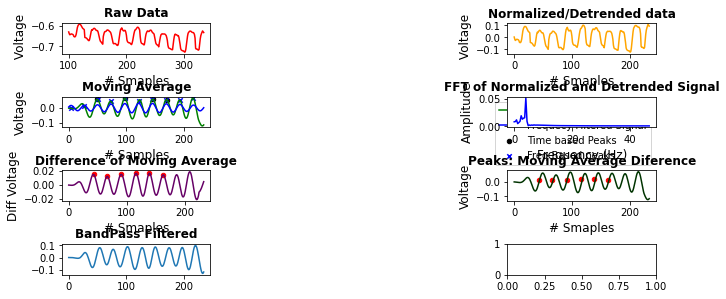

Medicaiton Time:  1_to_2_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  6.4825615269213275
Kurtosis:  50.67603136637767
 35 Participant4/2021-10-29/rg_20211029-182954.csv ===========================
Sampling Frequency (Fs =):  96.17486338797814
num_samples_2: Fs*2.5  240.43715846994533
Number of Peaks in time based:  8
Number of Peaks in time based:  10
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 8 , 0.04878623400128323 , Freq =  3.2058287795992713
pld_amplidute:  120
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2058287795992713


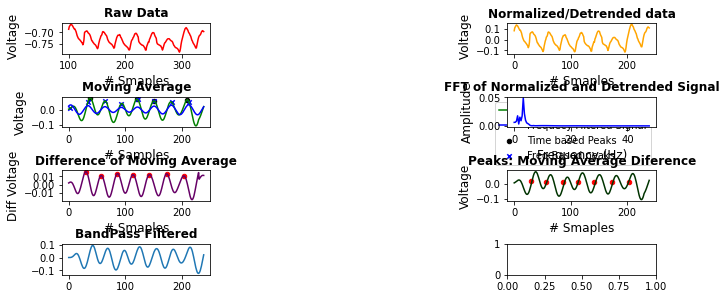

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.889358846322252
Kurtosis:  41.51342035673682
 36 Participant4/2021-10-30/rg_20211030-095315.csv ===========================
Sampling Frequency (Fs =):  97.35788630904723
num_samples_2: Fs*2.5  243.39471577261807
Number of Peaks in time based:  7
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 8 , 0.05325950605764547 , Freq =  3.20519790317851
pld_amplidute:  121
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.20519790317851


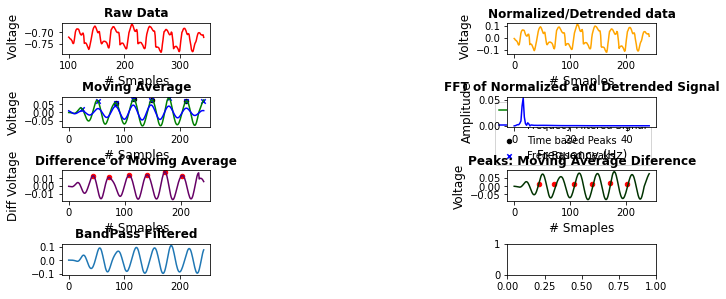

Medicaiton Time:  4_plus
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  6.958621990405363
Kurtosis:  50.69463354350587
 37 Participant4/2021-10-30/rg_20211030-185943.csv ===========================
Sampling Frequency (Fs =):  93.57495881383855
num_samples_2: Fs*2.5  233.93739703459636
Number of Peaks in time based:  8
Number of Peaks in time based:  8
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 8 , 0.052300203195747054 , Freq =  3.212874122363555
pld_amplidute:  116
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.212874122363555


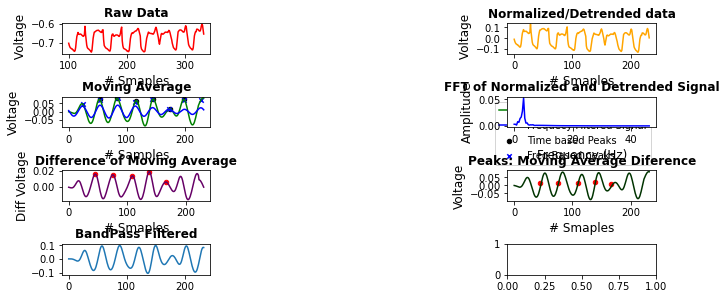

Medicaiton Time:  0_to_1_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  6.405039559147564
Kurtosis:  46.812230698760516
 38 Participant4/2021-10-31/rg_20211031-133028.csv ===========================
Sampling Frequency (Fs =):  95.02183406113538
num_samples_2: Fs*2.5  237.55458515283846
Number of Peaks in time based:  8
Number of Peaks in time based:  9
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 8 , 0.053674918945649054 , Freq =  3.2074880695741896
pld_amplidute:  118
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.2074880695741896


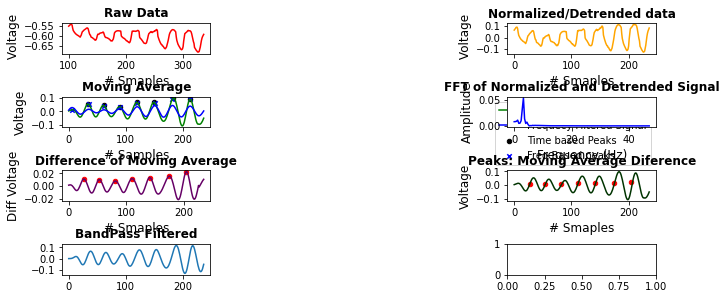

Medicaiton Time:  0_to_1_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  6.510646728211211
Kurtosis:  47.67629996690257
 39 Participant4/2021-10-31/rg_20211031-190553.csv ===========================
Sampling Frequency (Fs =):  97.15370018975332
num_samples_2: Fs*2.5  242.8842504743833
Number of Peaks in time based:  8
Number of Peaks in time based:  8
np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 7 , 0.051641630086488775 , Freq =  2.81023099722427
pld_amplidute:  121
xf[AMP.argmax()]:  2.81023099722427
NEW FREQUENCYxf[np.array(AMP).argmax()]:  3.613154139288347


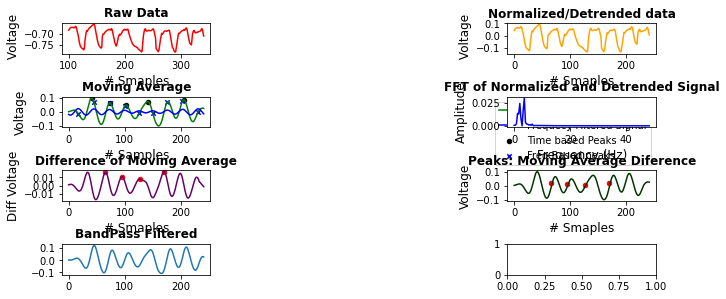

Medicaiton Time:  0_to_1_hrs
df_finger_tapping_2_5_index_norm:  <class 'numpy.ndarray'>
Skewness:  5.17915728040445
Kurtosis:  28.061776363252118


In [43]:
results_p4,peak2peak_diff_freq_list4,peak2peak_diff_time_list4,withd_threshold_df4,peak_amnplitude_df_freq4,peak_amnplitude_df_timebased4 = process_iotex_data("Participant4","results_p4.csv")




In [44]:
results_p4.to_csv(output_file_results+"results_p4.csv",index=0)
peak2peak_diff_freq_list4.to_csv(output_file_results+"results_p1_p2pdiff_freq4.csv",index=0)
peak2peak_diff_time_list4.to_csv(output_file_results+"results_p1_p2pdiff_time4.csv",index=0)
withd_threshold_df4.to_csv(output_file_results+"results_p1_width_threshold4.csv",index=0)
peak_amnplitude_df_freq4.to_csv(output_file_results+"results_p1_peak_amplitude_frequency4.csv",index=0)
peak_amnplitude_df_timebased4.to_csv(output_file_results+"results_p1_peak_amplitude_time4.csv",index=0)



# Time Since Medication Statistics

In [ ]:
participants =['0-1', '1-2', '2-3','4+']

fig = go.Figure(data=[
    go.Bar(name='P1', x=participants, y=[4,2,8,23],text=[4,2,8,23]),
    go.Bar(name='P2', x=participants, y=[0,6,1,12],text=[0,6,1,12]),
    go.Bar(name='P3', x=participants, y=[0,7,12,16],text=[0,7,12,16]),
    go.Bar(name='P4', x=participants, y=[13,1,0,17],text=[13,1,0,17])
])
# Change the bar mode
fig.update_layout(barmode='group')
fig.show()

In [ ]:
withd_threshold_df = withd_threshold_df.reset_index()

In [96]:
#################################################################################################################
# SELECT PARTICIPANT DF BASED ON MEDICAIOTN TIMES.
#################################################################################################################
####### Width Threshold.
withd_threshold_df_4plus = withd_threshold_df[withd_threshold_df["med_time"]=="4_plus"]
withd_threshold_df_1_to_2_hrs = withd_threshold_df[withd_threshold_df["med_time"]=="1_to_2_hrs"]
withd_threshold_df_2_to_3_hrs = withd_threshold_df[withd_threshold_df["med_time"]=="2_to_3_hrs"]
withd_threshold_df_0_to_1_hrs = withd_threshold_df[withd_threshold_df["med_time"]=="0_to_1_hrs"]

############ Peak to Peak Diff.
peak2peak_diff_freq_list1_4plus = peak2peak_diff_freq_list1[peak2peak_diff_freq_list1["med_time"]=="4_plus"]
peak2peak_diff_freq_list1_1_to_2_hrs = peak2peak_diff_freq_list1[peak2peak_diff_freq_list1["med_time"]=="1_to_2_hrs"]
peak2peak_diff_freq_list1_2_to_3_hrs = peak2peak_diff_freq_list1[peak2peak_diff_freq_list1["med_time"]=="2_to_3_hrs"]
peak2peak_diff_freq_list1_0_to_1_hrs = peak2peak_diff_freq_list1[peak2peak_diff_freq_list1["med_time"]=="0_to_1_hrs"]


peak2peak_diff_time_list1_4plus = peak2peak_diff_freq_list1[peak2peak_diff_time_list1["med_time"]=="4_plus"]
peak2peak_diff_time_list1_1_to_2_hrs = peak2peak_diff_freq_list1[peak2peak_diff_time_list1["med_time"]=="1_to_2_hrs"]
peak2peak_diff_time_list1_2_to_3_hrs = peak2peak_diff_freq_list1[peak2peak_diff_time_list1["med_time"]=="2_to_3_hrs"]
peak2peak_diff_time_list1_0_to_1_hrs = peak2peak_diff_freq_list1[peak2peak_diff_time_list1["med_time"]=="0_to_1_hrs"]

############ Peak Amplitude


peak_amnplitude_df_freq_0_1= peak_amnplitude_df_freq[peak_amnplitude_df_time["med_time"]=="0_to_1_hrs"]
peak_amnplitude_df_freq_1_2 = peak_amnplitude_df_freq[peak_amnplitude_df_time["med_time"]=="1_to_2_hrs"]
peak_amnplitude_df_freq_2_3 = peak_amnplitude_df_freq[peak_amnplitude_df_time["med_time"]=="2_to_3_hrs"]
peak_amnplitude_df_freq_4plus = peak_amnplitude_df_freq[peak_amnplitude_df_time["med_time"]=="4_plus"]

peak_amnplitude_df_time_0_1= peak_amnplitude_df_freq[peak_amnplitude_df_time["med_time"]=="0_to_1_hrs"]
peak_amnplitude_df_time_1_2 = peak_amnplitude_df_freq[peak_amnplitude_df_time["med_time"]=="1_to_2_hrs"]
peak_amnplitude_df_time_2_3 = peak_amnplitude_df_freq[peak_amnplitude_df_time["med_time"]=="2_to_3_hrs"]
peak_amnplitude_df_time_4plus = peak_amnplitude_df_freq[peak_amnplitude_df_time["med_time"]=="4_plus"]




In [ ]:


#################################################################################################################
# PARTICIPANT 2
#################################################################################################################


####### Width Threshold.
withd_threshold_df_4plus2 = withd_threshold_df2[withd_threshold_df2["med_time"]=="4_plus"]
withd_threshold_df_1_to_2_hrs2 = withd_threshold_df2[withd_threshold_df2["med_time"]=="1_to_2_hrs"]
withd_threshold_df_2_to_3_hrs2 = withd_threshold_df2[withd_threshold_df2["med_time"]=="2_to_3_hrs"]
withd_threshold_df_0_to_1_hrs2 = withd_threshold_df2[withd_threshold_df2["med_time"]=="0_to_1_hrs"]

############ Peak to Peak Diff.

peak2peak_diff_freq_list1_4plus2 = peak2peak_diff_freq_list2[peak2peak_diff_freq_list2["med_time"]=="4_plus"]
peak2peak_diff_freq_list1_1_to_2_hrs2 = peak2peak_diff_freq_list2[peak2peak_diff_freq_list2["med_time"]=="1_to_2_hrs"]
peak2peak_diff_freq_list1_2_to_3_hrs2 = peak2peak_diff_freq_list2[peak2peak_diff_freq_list2["med_time"]=="2_to_3_hrs"]
peak2peak_diff_freq_list1_0_to_1_hrs2 = peak2peak_diff_freq_list2[peak2peak_diff_freq_list2["med_time"]=="0_to_1_hrs"]


peak_amnplitude_df_freq_0_12 = peak_amnplitude_df_freq2[peak_amnplitude_df_freq2["med_time"]=="0_to_1_hrs"]
peak_amnplitude_df_freq_1_22 = peak_amnplitude_df_freq2[peak_amnplitude_df_freq2["med_time"]=="1_to_2_hrs"]
peak_amnplitude_df_freq_2_32 = peak_amnplitude_df_freq2[peak_amnplitude_df_freq2["med_time"]=="2_to_3_hrs"]
peak_amnplitude_df_freq_4plus2 = peak_amnplitude_df_freq2[peak_amnplitude_df_freq2["med_time"]=="4_plus"]


############ Peak Amplitude


peak_amnplitude_df_time_0_12= peak_amnplitude_df_timebased2[peak_amnplitude_df_timebased2["med_time"]=="0_to_1_hrs"]
peak_amnplitude_df_time_1_22 = peak_amnplitude_df_timebased2[peak_amnplitude_df_timebased2["med_time"]=="1_to_2_hrs"]
peak_amnplitude_df_time_2_32 = peak_amnplitude_df_timebased2[peak_amnplitude_df_timebased2["med_time"]=="2_to_3_hrs"]
peak_amnplitude_df_time_4plus2 = peak_amnplitude_df_timebased2[peak_amnplitude_df_timebased2["med_time"]=="4_plus"]


peak_amnplitude_df_freq_0_12= peak_amnplitude_df_freq2[peak_amnplitude_df_freq2["med_time"]=="0_to_1_hrs"]
peak_amnplitude_df_freq_1_22 = peak_amnplitude_df_freq2[peak_amnplitude_df_freq2["med_time"]=="1_to_2_hrs"]
peak_amnplitude_df_freq_2_32 = peak_amnplitude_df_freq2[peak_amnplitude_df_freq2["med_time"]=="2_to_3_hrs"]
peak_amnplitude_df_freq_4plus2 = peak_amnplitude_df_freq2[peak_amnplitude_df_freq2["med_time"]=="4_plus"]


#################################################################################################################
# PARTICIPANT 3
#################################################################################################################
withd_threshold_df_4plus3 = withd_threshold_df3[withd_threshold_df3["med_time"]=="4_plus"]
withd_threshold_df_1_to_2_hrs3 = withd_threshold_df3[withd_threshold_df3["med_time"]=="1_to_2_hrs"]
withd_threshold_df_2_to_3_hrs3 = withd_threshold_df3[withd_threshold_df3["med_time"]=="2_to_3_hrs"]
withd_threshold_df_0_to_1_hrs3 = withd_threshold_df3[withd_threshold_df3["med_time"]=="0_to_1_hrs"]


peak2peak_diff_freq_list1_4plus3 = peak2peak_diff_freq_list3[peak2peak_diff_freq_list3["med_time"]=="4_plus"]
peak2peak_diff_freq_list1_1_to_2_hrs3 = peak2peak_diff_freq_list3[peak2peak_diff_freq_list3["med_time"]=="1_to_2_hrs"]
peak2peak_diff_freq_list1_2_to_3_hrs3 = peak2peak_diff_freq_list3[peak2peak_diff_freq_list3["med_time"]=="2_to_3_hrs"]
peak2peak_diff_freq_list1_0_to_1_hrs3 = peak2peak_diff_freq_list3[peak2peak_diff_freq_list3["med_time"]=="0_to_1_hrs"]




peak_amnplitude_df_freq_0_13 = peak_amnplitude_df_freq3[peak_amnplitude_df_freq3["med_time"]=="0_to_1_hrs"]
peak_amnplitude_df_freq_1_23 = peak_amnplitude_df_freq3[peak_amnplitude_df_freq3["med_time"]=="1_to_2_hrs"]
peak_amnplitude_df_freq_2_33 = peak_amnplitude_df_freq3[peak_amnplitude_df_freq3["med_time"]=="2_to_3_hrs"]
peak_amnplitude_df_freq_4plus3 = peak_amnplitude_df_freq3[peak_amnplitude_df_freq3["med_time"]=="4_plus"]



peak_amnplitude_df_time_0_13= peak_amnplitude_df_timebased3[peak_amnplitude_df_timebased3["med_time"]=="0_to_1_hrs"]
peak_amnplitude_df_time_1_23 = peak_amnplitude_df_timebased3[peak_amnplitude_df_timebased3["med_time"]=="1_to_2_hrs"]
peak_amnplitude_df_time_2_33 = peak_amnplitude_df_timebased3[peak_amnplitude_df_timebased3["med_time"]=="2_to_3_hrs"]
peak_amnplitude_df_time_4plus3 = peak_amnplitude_df_timebased3[peak_amnplitude_df_timebased3["med_time"]=="4_plus"]



In [ ]:
#################################################################################################################
# PARTICIPANT 4
#################################################################################################################

withd_threshold_df_4plus4 = withd_threshold_df4[withd_threshold_df4["med_time"]=="4_plus"]
withd_threshold_df_1_to_2_hrs4 = withd_threshold_df4[withd_threshold_df4["med_time"]=="1_to_2_hrs"]
withd_threshold_df_2_to_3_hrs4 = withd_threshold_df4[withd_threshold_df4["med_time"]=="2_to_3_hrs"]
withd_threshold_df_0_to_1_hrs4 = withd_threshold_df4[withd_threshold_df4["med_time"]=="0_to_1_hrs"]


peak2peak_diff_freq_list1_4plus4 = peak2peak_diff_freq_list4[peak2peak_diff_freq_list4["med_time"]=="4_plus"]
peak2peak_diff_freq_list1_1_to_2_hrs4 = peak2peak_diff_freq_list4[peak2peak_diff_freq_list4["med_time"]=="1_to_2_hrs"]
peak2peak_diff_freq_list1_2_to_3_hrs4 = peak2peak_diff_freq_list4[peak2peak_diff_freq_list4["med_time"]=="2_to_3_hrs"]
peak2peak_diff_freq_list1_0_to_1_hrs4 = peak2peak_diff_freq_list4[peak2peak_diff_freq_list4["med_time"]=="0_to_1_hrs"]





peak_amnplitude_df_freq_0_14 = peak_amnplitude_df_freq4[peak_amnplitude_df_freq4["med_time"]=="0_to_1_hrs"]
peak_amnplitude_df_freq_1_24 = peak_amnplitude_df_freq4[peak_amnplitude_df_freq4["med_time"]=="1_to_2_hrs"]
peak_amnplitude_df_freq_2_34 = peak_amnplitude_df_freq4[peak_amnplitude_df_freq4["med_time"]=="2_to_3_hrs"]
peak_amnplitude_df_freq_4plus4 = peak_amnplitude_df_freq4[peak_amnplitude_df_freq4["med_time"]=="4_plus"]




peak_amnplitude_df_time_0_14= peak_amnplitude_df_timebased4[peak_amnplitude_df_timebased4["med_time"]=="0_to_1_hrs"]
peak_amnplitude_df_time_1_24 = peak_amnplitude_df_timebased4[peak_amnplitude_df_timebased4["med_time"]=="1_to_2_hrs"]
peak_amnplitude_df_time_2_34 = peak_amnplitude_df_timebased4[peak_amnplitude_df_timebased4["med_time"]=="2_to_3_hrs"]
peak_amnplitude_df_time_4plus4 = peak_amnplitude_df_timebased4[peak_amnplitude_df_timebased4["med_time"]=="4_plus"]



In [54]:
########################################################################################################
# Plotting Module for results analysis.
########################################################################################################
def width_thresh_box(withd_threshold_df):
    fig = go.Figure()
    for i in range(withd_threshold_df.shape[0]):
    #     print(i)
        fig.add_trace(go.Box(y=withd_threshold_df.iloc[i][:13], boxpoints='all'))
    fig.show()
def peak_topeak_diff_box(peak2peak_diff_freq_list1):
    fig = go.Figure()
    for i in range(peak2peak_diff_freq_list1.shape[0]):
    #     print(i)
        fig.add_trace(go.Box(y=peak2peak_diff_freq_list1.iloc[i][:13], boxpoints='all'))
    fig.show()
    
def plot_allsessions_inone(peak_amnplitude_df_freq_0_1):
    list_all = []
    for i in range(peak_amnplitude_df_freq_0_1.shape[0]):
        for j in peak_amnplitude_df_freq_0_1.iloc[i][:13].to_list():
            list_all.append(j)
    return list_all
    
#p2p
def p2pplot_allsessions_inone(peak_amnplitude_df_freq_0_1):
    list_all = []
    for i in range(peak_amnplitude_df_freq_0_1.shape[0]):
        for j in peak_amnplitude_df_freq_0_1.iloc[i][:12].to_list():
            list_all.append(j)
    return list_all
    
def plot_all_raw():
    fig = Figure()
    for i,value in p1_med_off.iterrows():

        print("value: ",value["FileName"])
        df = pd.read_csv(root + value["Participant"] + "/" + value["DateList"] + "/"+ value["FileName"])
        st_time = df["time"].iloc[0]
        stop_time = df["time"].iloc[df.shape[0]-1]
        total_time_nano = stop_time - st_time
        total_sec = total_time_nano/1000000000
        Fs = df.shape[0]/round(total_sec, 2) # int(total_sec)
        print("Sampling Frequency (Fs =): ", Fs)
        num_samples_2 = Fs*2.5
        print("num_samples_2: Fs*2.5 ",num_samples_2)
        # Subset 2.5 seconds of data.
        start_idx = 100
        end_idx = start_idx+int(num_samples_2) 
        if int(num_samples_2)>=30:

            df_finger_tapping_2_5_index_norm =preprocessing.normalize([df["index"][start_idx:end_idx]])
    #         ax.plot(df_finger_tapping_2_5_index_norm[0] ,label = "line 1")
            fig.add_trace(go.Scatter( y=df_finger_tapping_2_5_index_norm[0],
                                mode='lines',
                                name=value["FileName"]))

        
        

# Peak Width Parameter :
- 1) Only for Time Based peak detector

In [62]:
print("Width of All Sessions:- P1")
freq_width1 = p2pplot_allsessions_inone(withd_threshold_df_0_to_1_hrs)
freq_width2= p2pplot_allsessions_inone(withd_threshold_df_1_to_2_hrs)
freq_width3 = p2pplot_allsessions_inone(withd_threshold_df_2_to_3_hrs)
freq_width4 = p2pplot_allsessions_inone(withd_threshold_df_4plus)
fig = go.Figure()
fig.add_trace(go.Box(y=freq_width1, boxpoints='all',name="0-1"))
fig.add_trace(go.Box(y=freq_width2, boxpoints='all',name="1-2"))
fig.add_trace(go.Box(y=freq_width3, boxpoints='all',name="2-3"))
fig.add_trace(go.Box(y=freq_width4, boxpoints='all',name="4 plus"))
fig.show()
    
    

Width of All Sessions:- P1


In [63]:
print("Width of all sessions P2")
freq_width12 = p2pplot_allsessions_inone(withd_threshold_df_0_to_1_hrs2)
freq_width22= p2pplot_allsessions_inone(withd_threshold_df_1_to_2_hrs2)
freq_width32 = p2pplot_allsessions_inone(withd_threshold_df_2_to_3_hrs2)
freq_width42 = p2pplot_allsessions_inone(withd_threshold_df_4plus)
fig = go.Figure()
fig.add_trace(go.Box(y=freq_width12, boxpoints='all',name="0-1"))
fig.add_trace(go.Box(y=freq_width22, boxpoints='all',name="1-2"))
fig.add_trace(go.Box(y=freq_width32, boxpoints='all',name="2-3"))
fig.add_trace(go.Box(y=freq_width42, boxpoints='all',name="4 plus"))

fig.show()
    
    

Width of all sessions P2


In [64]:
print("Width of all sessions P3")
freq_width13 = p2pplot_allsessions_inone(withd_threshold_df_0_to_1_hrs3)
freq_width23= p2pplot_allsessions_inone(withd_threshold_df_1_to_2_hrs3)
freq_width33 = p2pplot_allsessions_inone(withd_threshold_df_2_to_3_hrs3)
freq_width43 = p2pplot_allsessions_inone(withd_threshold_df_4plus3)
fig = go.Figure()
fig.add_trace(go.Box(y=freq_width13, boxpoints='all',name="0-1"))
fig.add_trace(go.Box(y=freq_width23, boxpoints='all',name="1-2"))
fig.add_trace(go.Box(y=freq_width33, boxpoints='all',name="2-3"))
fig.add_trace(go.Box(y=freq_width43, boxpoints='all',name="4 plus"))

fig.show()
    
    

Width of all sessions P3


In [65]:
print("Width of all sessions P4")
freq_width14 = p2pplot_allsessions_inone(withd_threshold_df_0_to_1_hrs4)
freq_width24= p2pplot_allsessions_inone(withd_threshold_df_1_to_2_hrs4)
freq_width34 = p2pplot_allsessions_inone(withd_threshold_df_2_to_3_hrs4)
freq_width44 = p2pplot_allsessions_inone(withd_threshold_df_4plus4)
fig = go.Figure()
fig.add_trace(go.Box(y=freq_width14, boxpoints='all',name="0-1"))
fig.add_trace(go.Box(y=freq_width24, boxpoints='all',name="1-2"))
fig.add_trace(go.Box(y=freq_width34, boxpoints='all',name="2-3"))
fig.add_trace(go.Box(y=freq_width44, boxpoints='all',name="4 plus"))

fig.show()
    
    

Width of all sessions P4


## Peak to Peak Difference feature:
- 1) Frequency Based
- 2) Time based

In [93]:
print("Peak to Peak (frequency based) p1")
freq_p2p1 = p2pplot_allsessions_inone(peak2peak_diff_freq_list1_0_to_1_hrs)
freq_p2p2= p2pplot_allsessions_inone(peak2peak_diff_freq_list1_1_to_2_hrs)
freq_p2p3 = p2pplot_allsessions_inone(peak2peak_diff_freq_list1_2_to_3_hrs)
freq_p2p4 = p2pplot_allsessions_inone(peak2peak_diff_freq_list1_4plus)
fig = go.Figure()
fig.add_trace(go.Box(y=freq_p2p1, boxpoints='all',name="0-1"))
fig.add_trace(go.Box(y=freq_p2p2, boxpoints='all',name="1-2"))
fig.add_trace(go.Box(y=freq_p2p3, boxpoints='all',name="2-3"))
fig.add_trace(go.Box(y=freq_p2p4, boxpoints='all',name="4 plus"))
fig.show()
    

Peak to Peak (frequency based) p1


In [78]:
print("Peak to Peak (frequency based) P2")

freq_p2p12 = p2pplot_allsessions_inone(peak2peak_diff_freq_list1_0_to_1_hrs2)
freq_p2p22= p2pplot_allsessions_inone(peak2peak_diff_freq_list1_1_to_2_hrs2)
freq_p2p32 = p2pplot_allsessions_inone(peak2peak_diff_freq_list1_2_to_3_hrs2)
freq_p2p42 = p2pplot_allsessions_inone(peak2peak_diff_freq_list1_4plus2)
fig = go.Figure()
fig.add_trace(go.Box(y=freq_p2p12, boxpoints='all',name="0-1"))
fig.add_trace(go.Box(y=freq_p2p22, boxpoints='all',name="1-2"))
fig.add_trace(go.Box(y=freq_p2p32, boxpoints='all',name="2-3"))
fig.add_trace(go.Box(y=freq_p2p42, boxpoints='all',name="4 plus"))

fig.show()
    

Peak to Peak (frequency based) P2


In [79]:
print("Peak to Peak  (frequency based) P3")

freq_p2p13 = p2pplot_allsessions_inone(peak2peak_diff_freq_list1_0_to_1_hrs3)
freq_p2p23= p2pplot_allsessions_inone(peak2peak_diff_freq_list1_1_to_2_hrs3)
freq_p2p33 = p2pplot_allsessions_inone(peak2peak_diff_freq_list1_2_to_3_hrs3)
freq_p2p43 = p2pplot_allsessions_inone(peak2peak_diff_freq_list1_4plus3)
fig = go.Figure()
fig.add_trace(go.Box(y=freq_p2p13, boxpoints='all',name="0-1"))
fig.add_trace(go.Box(y=freq_p2p23, boxpoints='all',name="1-2"))
fig.add_trace(go.Box(y=freq_p2p33, boxpoints='all',name="2-3"))
fig.add_trace(go.Box(y=freq_p2p43, boxpoints='all',name="4 plus"))

fig.show()
    

Peak to Peak  (frequency based) P3


In [80]:
print("Peak to Peak (Frequency Based) P4")

freq_p2p14 = p2pplot_allsessions_inone(peak2peak_diff_freq_list1_0_to_1_hrs4)
freq_p2p24= p2pplot_allsessions_inone(peak2peak_diff_freq_list1_1_to_2_hrs4)
freq_p2p34 = p2pplot_allsessions_inone(peak2peak_diff_freq_list1_2_to_3_hrs4)
freq_p2p44 = p2pplot_allsessions_inone(peak2peak_diff_freq_list1_4plus4)
fig = go.Figure()
fig.add_trace(go.Box(y=freq_p2p14, boxpoints='all',name="0-1"))
fig.add_trace(go.Box(y=freq_p2p24, boxpoints='all',name="1-2"))
fig.add_trace(go.Box(y=freq_p2p34, boxpoints='all',name="2-3"))
fig.add_trace(go.Box(y=freq_p2p44, boxpoints='all',name="4 plus"))

fig.show()
    

Peak to Peak (Frequency Based) P4


In [81]:
print("Peak Amplitude of all sessions (frequency based) P1")
freq_time_amp1 = plot_allsessions_inone(peak_amnplitude_df_freq_0_1)
freq_time_amp2= plot_allsessions_inone(peak_amnplitude_df_freq_1_2)
freq_time_amp3 = plot_allsessions_inone(peak_amnplitude_df_freq_2_3)
freq_time_amp4 = plot_allsessions_inone(peak_amnplitude_df_freq_4plus)
fig = go.Figure()
fig.add_trace(go.Box(y=freq_time_amp1, boxpoints='all',name="0-1"))
fig.add_trace(go.Box(y=freq_time_amp2, boxpoints='all',name="1-2"))
fig.add_trace(go.Box(y=freq_time_amp3, boxpoints='all',name="2-3"))
fig.add_trace(go.Box(y=freq_time_amp4, boxpoints='all',name="4 plus"))

fig.show()
    

Peak Amplitude of all sessions (frequency based) P1


- 2) Time Based Peak to Peak difference feature:

In [95]:
print("Peak to Peak (time based) p1")
time_p2p1 = p2pplot_allsessions_inone(peak2peak_diff_time_list1_0_to_1_hrs)
time_p2p2= p2pplot_allsessions_inone(peak2peak_diff_time_list1_1_to_2_hrs)
time_p2p3 = p2pplot_allsessions_inone(peak2peak_diff_time_list1_2_to_3_hrs)
time_p2p4 = p2pplot_allsessions_inone(peak2peak_diff_time_list1_4plus)
fig = go.Figure()
fig.add_trace(go.Box(y=time_p2p1, boxpoints='all',name="0-1"))
fig.add_trace(go.Box(y=time_p2p2, boxpoints='all',name="1-2"))
fig.add_trace(go.Box(y=time_p2p3, boxpoints='all',name="2-3"))
fig.add_trace(go.Box(y=time_p2p4, boxpoints='all',name="4 plus"))
fig.show()
    

Peak to Peak (time based) p1


NameError: name 'peak2peak_diff_time_list1_0_to_1_hrs' is not defined

# Peak Amplitude Feature:

- 1) Timebased Based
- 2) Frequency Based

### 1) Peak Amplitude Time Based:

In [94]:
time_amp1 = plot_allsessions_inone(peak_amnplitude_df_time_0_1)
time_amp2= plot_allsessions_inone(peak_amnplitude_df_time_1_2)
time_amp3 = plot_allsessions_inone(peak_amnplitude_df_time_2_3)
time_amp4 = plot_allsessions_inone(peak_amnplitude_df_time_4plus)

time_amp12 = plot_allsessions_inone(peak_amnplitude_df_time_0_12)
time_amp22= plot_allsessions_inone(peak_amnplitude_df_time_1_22)
time_amp32 = plot_allsessions_inone(peak_amnplitude_df_time_2_32)
time_amp42 = plot_allsessions_inone(peak_amnplitude_df_time_4plus2)


time_amp13 = plot_allsessions_inone(peak_amnplitude_df_time_0_13)
time_amp23= plot_allsessions_inone(peak_amnplitude_df_time_1_23)
time_amp33 = plot_allsessions_inone(peak_amnplitude_df_time_2_33)
time_amp43 = plot_allsessions_inone(peak_amnplitude_df_time_4plus3)

time_amp14 = plot_allsessions_inone(peak_amnplitude_df_time_0_14)
time_amp24= plot_allsessions_inone(peak_amnplitude_df_time_1_24)
time_amp34 = plot_allsessions_inone(peak_amnplitude_df_time_2_34)
time_amp44 = plot_allsessions_inone(peak_amnplitude_df_time_4plus4)


In [86]:
print("Time Based Peak Detector's peak amplitude P1")
fig = go.Figure()
fig.add_trace(go.Box(y=time_amp1, boxpoints='all',name="0-1"))
fig.add_trace(go.Box(y=time_amp2, boxpoints='all',name="1-2"))
fig.add_trace(go.Box(y=time_amp3, boxpoints='all',name="2-3"))
fig.add_trace(go.Box(y=time_amp4, boxpoints='all',name="4 plus"))
fig.show()
    

Time Based Peak Detector's peak amplitude P1


In [87]:
print("Time Based Peak Detector's peak amplitude P2")
fig = go.Figure()
fig.add_trace(go.Box(y=time_amp12, boxpoints='all',name="0-1"))
fig.add_trace(go.Box(y=time_amp22, boxpoints='all',name="1-2"))
fig.add_trace(go.Box(y=time_amp32, boxpoints='all',name="2-3"))
fig.add_trace(go.Box(y=time_amp42, boxpoints='all',name="4 plus"))
fig.show()
    

Time Based Peak Detector's peak amplitude P2


In [89]:
print("Time Based Peak Detector's peak amplitude P3")
fig = go.Figure()
fig.add_trace(go.Box(y=time_amp13, boxpoints='all',name="0-1"))
fig.add_trace(go.Box(y=time_amp23, boxpoints='all',name="1-2"))
fig.add_trace(go.Box(y=time_amp33, boxpoints='all',name="2-3"))
fig.add_trace(go.Box(y=time_amp43, boxpoints='all',name="4 plus"))
fig.show()
    

Time Based Peak Detector's peak amplitude P3


In [90]:
print("Time Based Peak Detector's peak amplitude P4")
fig = go.Figure()
fig.add_trace(go.Box(y=time_amp14, boxpoints='all',name="0-1"))
fig.add_trace(go.Box(y=time_amp24, boxpoints='all',name="1-2"))
fig.add_trace(go.Box(y=time_amp34, boxpoints='all',name="2-3"))
fig.add_trace(go.Box(y=time_amp44, boxpoints='all',name="4 plus"))
fig.show()
    

Time Based Peak Detector's peak amplitude P4


# Peak Amplitudes for time Based Peaks.

In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_time_0_1)

In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_time_1_2)

In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_time_2_3)

In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_time_4plus)

## Width Threshold Box plots based on Medicaiton State

In [ ]:
width_thresh_box(withd_threshold_df_4plus)

In [ ]:
width_thresh_box(withd_threshold_df_1_to_2_hrs)

In [ ]:
width_thresh_box(withd_threshold_df_2_to_3_hrs)

In [ ]:
width_thresh_box(withd_threshold_df_0_to_1_hrs)

In [ ]:
p1_med_off = results_p1[results_p1["med_on_off"]==0]
p2_med_on = results_p1[results_p1["med_on_off"]==1]

In [ ]:
fig.show()

In [ ]:
peak2peak_diff_freq_list1

# Peak to Peak diff Frequency Based plots

In [ ]:
peak_topeak_diff_box(peak2peak_diff_freq_list1_0_to_1_hrs2)


In [ ]:

peak_topeak_diff_box(peak2peak_diff_freq_list1_1_to_2_hrs2)



In [ ]:
peak_topeak_diff_box(peak2peak_diff_freq_list1_2_to_3_hrs2)


In [ ]:
peak_topeak_diff_box(peak2peak_diff_freq_list1_4plus2)

# Peak Amplitude

In [ ]:

peak_topeak_diff_box(peak_amnplitude_df_freq_0_12)


In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_time_1_22)


In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_time_2_32)


In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_time_4plus2)


In [ ]:
freq_time_amp12 = plot_allsessions_inone(peak_amnplitude_df_freq_0_12)
freq_time_amp22= plot_allsessions_inone(peak_amnplitude_df_freq_1_22)
freq_time_amp32 = plot_allsessions_inone(peak_amnplitude_df_freq_2_32)
freq_time_amp42 = plot_allsessions_inone(peak_amnplitude_df_freq_4plus2)
fig = go.Figure()
fig.add_trace(go.Box(y=freq_time_amp12, boxpoints='all',name="0-1"))
fig.add_trace(go.Box(y=freq_time_amp22, boxpoints='all',name="1-2"))
fig.add_trace(go.Box(y=freq_time_amp32, boxpoints='all',name="2-3"))
fig.add_trace(go.Box(y=freq_time_amp42, boxpoints='all',name="4 plus"))

fig.show()
    

In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_freq_0_13)


In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_freq_1_23)


In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_freq_2_33)


In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_freq_4plus3)

In [ ]:
freq_time_amp13 = plot_allsessions_inone(peak_amnplitude_df_freq_0_13)
freq_time_amp23= plot_allsessions_inone(peak_amnplitude_df_freq_1_23)
freq_time_amp33 = plot_allsessions_inone(peak_amnplitude_df_freq_2_33)
freq_time_amp43 = plot_allsessions_inone(peak_amnplitude_df_freq_4plus3)
fig = go.Figure()
fig.add_trace(go.Box(y=freq_time_amp13, boxpoints='all',name="0-1"))
fig.add_trace(go.Box(y=freq_time_amp23, boxpoints='all',name="1-2"))
fig.add_trace(go.Box(y=freq_time_amp33, boxpoints='all',name="2-3"))
fig.add_trace(go.Box(y=freq_time_amp43, boxpoints='all',name="4 plus"))

fig.show()
    

In [ ]:
freq_time_amp14 = plot_allsessions_inone(peak_amnplitude_df_freq_0_14)
freq_time_amp24= plot_allsessions_inone(peak_amnplitude_df_freq_1_24)
freq_time_amp34 = plot_allsessions_inone(peak_amnplitude_df_freq_2_34)
freq_time_amp44 = plot_allsessions_inone(peak_amnplitude_df_freq_4plus4)
fig = go.Figure()
fig.add_trace(go.Box(y=freq_time_amp14, boxpoints='all',name="0-1"))
fig.add_trace(go.Box(y=freq_time_amp24, boxpoints='all',name="1-2"))
fig.add_trace(go.Box(y=freq_time_amp34, boxpoints='all',name="2-3"))
fig.add_trace(go.Box(y=freq_time_amp44, boxpoints='all',name="4 plus"))

fig.show()
    

In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_freq_0_14)


In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_freq_0_14)


In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_time_1_24)


In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_time_2_34)


In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_time_4plus4)


In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_freq_0_14)



In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_freq_1_24)


In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_freq_2_34)


In [ ]:
peak_topeak_diff_box(peak_amnplitude_df_freq_4plus4)

In [ ]:
peak_topeak_diff_box(peak2peak_diff_freq_list1_0_to_1_hrs4)


In [ ]:
peak_topeak_diff_box(peak2peak_diff_freq_list1_1_to_2_hrs4)


In [ ]:
peak_topeak_diff_box(peak2peak_diff_freq_list1_2_to_3_hrs4)


In [ ]:
peak_topeak_diff_box(peak2peak_diff_freq_list1_4plus4)

In [ ]:
results_p1.describe()

In [ ]:
results_p2.describe()

In [ ]:
results_p3.describe()

In [ ]:
results_p4.describe()

In [ ]:

med_0 = [results_p1["med_on_off"].value_counts().to_list()[0],results_p2["med_on_off"].value_counts().to_list()[0],results_p3["med_on_off"].value_counts().to_list()[0],results_p4["med_on_off"].value_counts().to_list()[0]]
    
med_1 = [results_p1["med_on_off"].value_counts().to_list()[1],results_p2["med_on_off"].value_counts().to_list()[1],results_p3["med_on_off"].value_counts().to_list()[1],results_p4["med_on_off"].value_counts().to_list()[1]]



In [ ]:
med_0

In [ ]:
results_p1["time_since_medication"].value_counts()

In [ ]:
results_p2["time_since_medication"].value_counts()

In [ ]:
results_p3["time_since_medication"].value_counts()

In [ ]:
results_p4["time_since_medication"].value_counts()

In [ ]:
results_p1["feel_medication"].value_counts()

In [ ]:
results_p2["feel_medication"].value_counts()

In [ ]:
results_p3["feel_medication"].value_counts()

In [ ]:
results_p4["feel_medication"].value_counts()

# SNR Anlaysis

In [ ]:

# fig = go.Figure()
# fig.add_trace(go.Bar(
#     y=med_0,
#     name='Med Off',
#     marker_color='indianred'
# ))
# fig.add_trace(go.Bar(
#     y=med_1,
#     name='Med On',
#     marker_color='lightsalmon'
# ))
# # Here we modify the tickangle of the xaxis, resulting in rotated labels.
# fig.update_layout(barmode='group', xaxis_tickangle=-45)
# fig.show()


In [ ]:
fig = px.line(x=results_p3["FileName"], y=results_p3["med_on_off"])
fig.add_bar(x=results_p3["FileName"], y=results_p3["DominantFreq"],textposition='outside')
fig.show()

In [ ]:
len(results_p3[results_p3["med_on_off"]==0]["DominantFreq"])

In [ ]:
len(results_p3[results_p3["med_on_off"]==1]["DominantFreq"])

In [ ]:
results_p4.columns

In [ ]:
fig = px.violin(results_p1[results_p1["Stage1_Random_Peaks"] !=-911], y="SNR_mean_std", color="med_on_off",
                violinmode='overlay') # draw violins on top of each other
                # default violinmode is 'group' as in example above)
fig.show()


In [ ]:
results_p2[results_p2["Stage1_Random_Peaks"] !=-911]

In [ ]:
fig = px.violin(results_p1[results_p1["SNR_mean_std"] >=0], y="SNR_mean_std", color="med_on_off",
                violinmode='overlay',points="all") # draw violins on top of each other
                # default violinmode is 'group' as in example above)
fig.show()


In [ ]:
fig = px.violin(results_p2[results_p2["SNR_mean_std"] >=0], y="SNR_mean_std", color="med_on_off",
                violinmode='overlay',points="all") # draw violins on top of each other
                # default violinmode is 'group' as in example above)
fig.show()


In [ ]:
fig = px.violin(results_p3[results_p3["SNR_mean_std"] >=0], y="SNR_mean_std", color="med_on_off",
                violinmode='overlay',points="all") # draw violins on top of each other
                # default violinmode is 'group' as in example above)
fig.show()


In [ ]:
fig = px.violin(results_p4[results_p4["SNR_mean_std"] >=0], y="SNR_mean_std", color="med_on_off",
                violinmode='overlay',points="all") # draw violins on top of each other
                # default violinmode is 'group' as in example above)
fig.show()


In [ ]:
fig = px.box(results_p1[results_p1["SNR_mean_std"] >=0], y="width_threshold", color="med_on_off",points="all") # draw violins on top of each other
fig.show()


In [ ]:
fig = px.box(results_p2[results_p2["SNR_mean_std"] >=0], y="width_threshold", color="med_on_off",points="all") # draw violins on top of each other
fig.show()

In [ ]:
fig = px.box(results_p3[results_p3["SNR_mean_std"] >=0], y="width_threshold", color="med_on_off",points="all") # draw violins on top of each other
fig.show()

In [ ]:
fig = px.box(results_p4[results_p4["SNR_mean_std"] >=0], y="width_threshold", color="med_on_off",points="all") # draw violins on top of each other
fig.show()

In [ ]:
results_p1.columns

In [ ]:
fig = px.box(results_p1[results_p1["SNR_mean_std"] >=0], y="Method1_TimeBased_Peaks", color="med_on_off",points="all") # draw violins on top of each other
fig.show()


In [ ]:
results_p2.columns

In [ ]:
fig = px.box(results_p2[results_p2["SNR_mean_std"] >=0], y="Method1_TimeBased_Peaks", color="med_on_off",points="all") # draw violins on top of each other
fig.show()


In [ ]:
results_p3.columns

In [ ]:
results_p3.columns

In [ ]:
fig = px.box(results_p3[results_p3["SNR_mean_std"] >=0], y="Method1_TimeBased", color="med_on_off",points="all") # draw violins on top of each other
fig.show()


In [ ]:
fig = px.box(results_p4[results_p4["SNR_mean_std"] >=0], y="Method3_FreqBased_Peaks", color="med_on_off",points="all") # draw violins on top of each other
fig.show()


In [ ]:
fig = px.box(results_p1[results_p1["SNR_mean_std"] >=0], y="width_threshold", color="med_on_off",points="all") # draw violins on top of each other
fig.show()


In [ ]:
fig = px.box(results_p2[results_p2["SNR_mean_std"] >=0], y="width_threshold", color="med_on_off",points="all") # draw violins on top of each other
fig.show()


In [ ]:
fig = px.box(results_p3[results_p3["SNR_mean_std"] >=0], y="width_threshold", color="med_on_off",points="all") # draw violins on top of each other
fig.show()


In [ ]:
fig = px.box(results_p4[results_p4["SNR_mean_std"] >=0], y="width_threshold", color="med_on_off",points="all") # draw violins on top of each other
fig.show()


In [ ]:
fig = px.violin(results_p2, y="DominantFreq", color="med_on_off",
                violinmode='overlay',points="all") # draw violins on top of each other
                # default violinmode is 'group' as in example above)
fig.show()

In [ ]:
fig = px.violin(results_p3, y="DominantFreq", color="med_on_off",
                violinmode='overlay',points="all") # draw violins on top of each other
                # default violinmode is 'group' as in example above)
fig.show()

In [ ]:
fig = px.violin(results_p4, y="DominantFreq", color="med_on_off",
                violinmode='overlay',points="all") # draw violins on top of each other
                # default violinmode is 'group' as in example above)
fig.show()

In [ ]:

fig = go.Figure()
fig.add_trace(go.Violin(y=results_p1[results_p1["med_on_off"]==0]["DominantFreq"],name="0"))  
fig.add_trace(go.Violin(y=results_p1[results_p1["med_on_off"]==1]["DominantFreq"],name="1"))  
fig.show()


In [ ]:

fig = go.Figure()
fig.add_trace(go.Violin(y=results_p2[results_p2["med_on_off"]==0]["DominantFreq"],name="0"))  
fig.add_trace(go.Violin(y=results_p2[results_p2["med_on_off"]==1]["DominantFreq"],name="1"))  
fig.show()



In [ ]:

fig = go.Figure()
fig.add_trace(go.Violin(y=results_p3[results_p3["med_on_off"]==0]["DominantFreq"],name="0"))  
fig.add_trace(go.Violin(y=results_p3[results_p3["med_on_off"]==1]["DominantFreq"],name="1"))  
fig.show()



In [ ]:

fig = go.Figure()
fig.add_trace(go.Violin(y=results_p4[results_p4["med_on_off"]==0]["DominantFreq"],name="0"))  
fig.add_trace(go.Violin(y=results_p4[results_p4["med_on_off"]==1]["DominantFreq"],name="1"))  
fig.show()



In [ ]:
plt.title("Participant 3: Meds OFF/OFF Dominant Frequency")
plt.plot(results_p3[results_p3["med_on_off"]==0]["DominantFreq"],label ="0")
plt.plot(results_p3[results_p3["med_on_off"]==1]["DominantFreq"],label ="1")
plt.legend(['Med Off','Med On'])


In [ ]:
results_p2 = results_p2[results_p2["HumanRater1"]!="X"]


In [ ]:
results_p2[results_p2["med_on_off"]==0]["DominantFreq"]

In [ ]:
results_p2[results_p2["med_on_off"]==1]["DominantFreq"]

In [ ]:
plt.title("Participant 2: Meds OFF/OFF Dominant Frequency")
plt.plot(results_p2[results_p2["med_on_off"]==0]["DominantFreq"],label ="0")
plt.plot(results_p2[results_p2["med_on_off"]==1]["DominantFreq"],label ="1")
plt.legend(['Med Off','Med On'])


In [ ]:
results_p1[results_p1["med_on_off"]==1]["DominantFreq"]

In [ ]:
plt.title("Participant 1: Meds OFF/OFF Dominant Frequency")
plt.plot(results_p1[results_p1["med_on_off"]==0]["DominantFreq"],label ="0")
plt.plot(results_p1[results_p1["med_on_off"]==1]["DominantFreq"],label ="1")
plt.legend(['Med Off','Med On'])


In [ ]:
plt.title("Participant 4: Meds OFF/OFF Dominant Frequency")
plt.plot(results_p4[results_p4["med_on_off"]==0]["DominantFreq"],label ="0")
plt.plot(results_p4[results_p4["med_on_off"]==1]["DominantFreq"],label ="1")
plt.legend(['Med Off','Med On'])


In [ ]:
results_p1 =  results_p1[results_p1["SNR_mean_std"]>0]
results_p2 =  results_p2[results_p2["SNR_mean_std"]>0]
results_p3 =  results_p3[results_p3["SNR_mean_std"]>0]
results_p4 =  results_p4[results_p4["SNR_mean_std"]>0]

In [ ]:
plt.rcParams["figure.figsize"] = [10.50, 6.50] # WIDTH, HEIGHT
fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(results_p1.index.to_list(),results_p1["SNR_Filtered"],c=results_p1["med_on_off"].to_list(),marker='_')
axs[0, 0].set_title('SNR Particiant 1')
axs[0, 1].plot(results_p2.index.to_list(),results_p2.index,results_p2["SNR_Filtered"],c=results_p2["med_on_off"].to_list(),marker='_')
axs[0, 1].set_title('SNR Particiant 2')
axs[1, 0].plot(results_p3.index.to_list(),results_p3.index,results_p3["SNR_Filtered"],c=results_p3["med_on_off"].to_list(),marker='_')
axs[1, 0].set_title('SNR Particiant 3')
axs[1, 1].plot(results_p4.index.to_list(),results_p4.index,results_p4["SNR_Filtered"],c=results_p4["med_on_off"].to_list(),marker='_')
axs[1, 1].set_title('SNR Particiant 4')
fig.subplots_adjust(wspace=0.4,hspace=0.5)




In [ ]:
plt.rcParams["figure.figsize"] = [10.50, 6.50] # WIDTH, HEIGHT
fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(results_p1.index,results_p1["SNR_mean_std"])
axs[0, 0].set_title('SNR Particiant 1')
axs[0, 1].plot(results_p2.index,results_p2["SNR_mean_std"])
axs[0, 1].set_title('SNR Particiant 2')
axs[1, 0].plot(results_p3.index,results_p3["SNR_mean_std"])
axs[1, 0].set_title('SNR Particiant 3')
axs[1, 1].plot(results_p4.index,results_p4["SNR_mean_std"])
axs[1, 1].set_title('SNR Particiant 4')
fig.subplots_adjust(wspace=0.4,hspace=0.5)


In [ ]:
results_p1_max = results_p1[results_p1["SNR_mean_std"]==max(results_p1["SNR_mean_std"])]
results_p1_max

In [ ]:
results_p1_min = results_p1[results_p1["SNR_mean_std"]==min(results_p1["SNR_mean_std"])]
results_p1_min

In [ ]:
results_p2_max = results_p2[results_p2["SNR_mean_std"]==max(results_p2["SNR_mean_std"])]
results_p2_max

In [ ]:
results_p2_min = results_p2[results_p2["SNR_mean_std"]==min(results_p2["SNR_mean_std"])]
results_p2_min

In [ ]:
results_p3_max = results_p3[results_p3["SNR_mean_std"]==max(results_p3["SNR_mean_std"])]
results_p3_max

In [ ]:
results_p3_min = results_p3[results_p3["SNR_mean_std"]==min(results_p3["SNR_mean_std"])]
results_p3_min

In [ ]:
results_p4_max = results_p4[results_p4["SNR_mean_std"]==max(results_p4["SNR_mean_std"])]
results_p4_max

In [ ]:
results_p4_min = results_p4[results_p4["SNR_mean_std"]==min(results_p4["SNR_mean_std"])]
results_p4_min

# Preprocessing - Number of Sessions Cut

In [ ]:
# results_p1[results_p1["NOT"]!="X"]
results_p1["NOT"].value_counts()

In [ ]:
results_p2["NOT"].value_counts()

In [ ]:
results_p3["NOT"].value_counts()

In [ ]:
results_p4["NOT"].value_counts()

In [ ]:

results_p1 =results_p1[results_p1["Method1_TimeBased"] != -911]
fig = go.Figure()
fig.add_trace(go.Bar(
#     x=results_p1["FileName"],
    y=results_p1["HumanRater1"],
    name='HumanRater1',
    marker_color='red'
))
fig.add_trace(go.Bar(
#     x=results_p1["FileName"],
    y=results_p1["RandomPeaks"],
    name='RandomPeaks',
    marker_color='lightsalmon'
))
fig.add_trace(go.Bar(
#     x=results_p1["FileName"],
    y=results_p1["Method1_TimeBased"],
    name='Method1_TimeBased',
    marker_color='blue'
))
fig.add_trace(go.Bar(
#     x=results_p1["FileName"],
    y=results_p1["Method3_FreqBased"],
    name='Method3_FreqBased',
    marker_color='green'
))

# Here we modify the tickangle of the xaxis, resulting in rotated labels.
fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Box(y=results_p1[results_p1["width_threshold"] !=-911]["width_threshold"],  name="(P1) Width Threshold ",marker_color = "purple"))
fig.add_trace(go.Box(y=results_p2[results_p2["width_threshold"] !=-911]["width_threshold"], name="(P2) Width Threshold",marker_color = "blue"))
fig.add_trace(go.Box(y=results_p3[results_p3["width_threshold"] !=-911]["width_threshold"],  name="(P3) Width Threshold",marker_color = "green"))
fig.add_trace(go.Box(y=results_p4[results_p4["width_threshold"] !=-911]["width_threshold"],  name="(P4) Width Threshold",marker_color = "yellow"))
fig.update_traces( )
fig.show()


In [ ]:
fig = go.Figure()
fig.add_trace(go.Box(y=results_p1["DominantFreq"],  name="(P1) DominantFreq",marker_color = "purple"))
fig.add_trace(go.Box(y=results_p2["DominantFreq"], name="(P2) DominantFreq",marker_color = "blue"))
fig.add_trace(go.Box(y=results_p3["DominantFreq"],  name="(P3) DominantFreq",marker_color = "green"))
fig.add_trace(go.Box(y=results_p4["DominantFreq"],  name="(P4)DominantFreq",marker_color = "yellow"))
fig.update_traces(jitter=0)
fig.update_layout(title='Dominant Frequency')
fig.show()

In [ ]:


fig = go.Figure()
fig.add_trace(go.Box(y=results_p1["HumanRater1"],  name="(P1) HumanRater1",marker_color = "purple"))
fig.add_trace(go.Box(y=results_p1["HumanRater2"], name="(P1) HumanRater2",marker_color = "purple"))
fig.add_trace(go.Box(y=results_p2["HumanRater1"],  name="(P2) HumanRater1",marker_color = "blue"))
fig.add_trace(go.Box(y=results_p2["HumanRater2"], name="(P2) HumanRater2",marker_color = "blue"))
fig.add_trace(go.Box(y=results_p3["HumanRater1"],  name="(P3) HumanRater1",marker_color = "green"))
fig.add_trace(go.Box(y=results_p3["HumanRater2"], name="(P3) HumanRater2",marker_color = "green"))
fig.update_traces(boxpoints='all', jitter=0)
fig.show()


# Time based Peak to Peak Difference Plots for 4 Participants:

In [ ]:
def peak2_peak_figures(x_list , min_list, max_list,mean_list,title_text1):
    plt.plot(min_list)
    plt.plot(max_list)
    plt.plot(mean_list)
    plt.title(title_text1,fontsize=16)
    plt.xlabel('Number of Sessions',fontsize=16)
    plt.ylabel('p2p Distance',fontsize=16)
    return plt


In [ ]:
# Takes: a pea to peak difference datafram of each file returned by the read_iotex_function.
# Returns: x_list , min_list, max_list, mean_list.
def peak_2_peak_results(p2p_df):
    x_list = list(range(0, len(p2p_df)))
    min_list = []
    max_list = []
    mean_list = []  
    for i in range(p2p_df.shape[0]):
        # print(i)
        row = p2p_df.iloc[i,:9]
        #print("row: ",row)
        drop_na = row.dropna()
        # print("drop_na: ",drop_na)
        mean_val= drop_na.mean()
        max_val = drop_na.max()
        min_val = drop_na.min()
       # print("mean_val,max_val, min_val: ",mean_val,max_val, min_val)
        min_list.append(min_val)
        max_list.append(max_val)
        mean_list.append(mean_val)
    return x_list , min_list, max_list,mean_list

    

In [ ]:

    
x_list , min_list, max_list,mean_list= peak_2_peak_results(peak2peak_diff_time_list1)
title_text1 ='Participant 1: Peak to Peak difference in amplitude (Time Based)'
# peak2_peak_figures(list_of_numbers2,mean_peak2peak_diff_freq_list2,max_peak2peak_diff_freq_list2,min_peak2peak_diff_freq_list2,title_text)

# plot1 =peak2_peak_figures(x_list , min_list, max_list,mean_list,title_text1)


x_list2 , min_list2, max_list2,mean_list2= peak_2_peak_results(peak2peak_diff_time_list2)

title_text2 ='Participant 2: Peak to Peak difference in amplitude (Time Based)'

# plot2 =peak2_peak_figures(x_list2 , min_list2, max_list2,mean_list2,title_text2)


x_list3 , min_list3, max_list3,mean_list3= peak_2_peak_results(peak2peak_diff_time_list3)

title_text3 ='Participant 3: Peak to Peak difference in amplitude (Time Based)'

# plot3 =peak2_peak_figures(x_list3 , min_list3, max_list3,mean_list3,title_text3)


x_list4 , min_list4, max_list4,mean_list4 = peak_2_peak_results(peak2peak_diff_time_list4)

title_text4 ='Participant 4: Peak to Peak difference in amplitude (Time Based)'

# plot4 = peak2_peak_figures(x_list4 , min_list4, max_list4,mean_list4,title_text4)




In [ ]:
peak2peak_diff_time_list2

In [ ]:
plt.rcParams["figure.figsize"] = [10.50, 6.50] # WIDTH, HEIGHT
fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(min_list)
axs[0, 0].plot(max_list)
axs[0, 0].plot(mean_list)
# axs.set(xlabel='Number of Sessions', ylabel='p2p Distance')
axs[0, 0].set_title('Peak to Peak Differences Participant 1')
axs[0, 1].plot(min_list2)
axs[0, 1].plot(max_list2)
axs[0, 1].plot(mean_list2)
# axs[0, 1].xlabel('Number of Sessions',fontsize=16)
# axs[0, 1].ylabel('p2p Distance',fontsize=16)
axs[0, 1].set_title('Peak to Peak Differences Participant 2')
axs[1, 0].plot(min_list3)
axs[1, 0].plot(max_list3)
axs[1, 0].plot(mean_list3)
# axs[1, 0].xlabel('Number of Sessions',fontsize=16)
# axs[1, 0].ylabel('p2p Distance',fontsize=16)
axs[1, 0].set_title('Peak to Peak Differences Participant 3')
axs[1, 1].plot(min_list4)
axs[1, 1].plot(max_list4)
axs[1, 1].plot(mean_list4)
# axs[1, 1].xlabel('Number of Sessions',fontsize=16)
# axs[1, 1].ylabel('p2p Distance',fontsize=16)
axs[1, 1].set_title('Peak to Peak Differences Participant 4')
fig.subplots_adjust(wspace=0.5,hspace=0.5)


## Frequency based filtering for Peak to Peak Difference Plots for 4 Participants

In [ ]:
# np.arrange(1,3,len(mean_peak2peak_diff_freq_list))
list_of_numbers_freq1 = list(range(0, len(peak2peak_diff_freq_list1)))

mean_peak2peak_diff_freq_list1 = peak2peak_diff_freq_list1.mean(axis=1)
max_peak2peak_diff_freq_list1 = peak2peak_diff_freq_list1.max(axis=1)
min_peak2peak_diff_freq_list1 = peak2peak_diff_freq_list1.min(axis=1)
title_text5 ='Participant 1: Peak to Peak difference in amplitude (Freq Based)'

# np.arrange(1,3,len(mean_peak2peak_diff_freq_list))
list_of_numbers_freq_2 = list(range(0, len(peak2peak_diff_freq_list2)))

mean_peak2peak_diff_freq_list2 = peak2peak_diff_freq_list2.mean(axis=1)
max_peak2peak_diff_freq_list2 = peak2peak_diff_freq_list2.max(axis=1)
min_peak2peak_diff_freq_list2 = peak2peak_diff_freq_list2.min(axis=1)
title_text6 ='Participant 2: Peak to Peak difference in amplitude (Freq Based)'
# fig2 = peak2_peak_figures(peak2peak_diff_freq_list2["filename"],mean_peak2peak_diff_freq_list2,max_peak2peak_diff_freq_list2,min_peak2peak_diff_freq_list2,title_text6)
# fig2.show()
# np.arrange(1,3,len(mean_peak2peak_diff_freq_list))
list_of_numbers3 = list(range(0, len(peak2peak_diff_freq_list3)))
print(len(list_of_numbers3),len(peak2peak_diff_freq_list3))

mean_peak2peak_diff_freq_list3 = peak2peak_diff_freq_list3.mean(axis=1)
max_peak2peak_diff_freq_list3 = peak2peak_diff_freq_list3.max(axis=1)
min_peak2peak_diff_freq_list3 = peak2peak_diff_freq_list3.min(axis=1)
title_text7 ='Participant 3: Peak to Peak difference in amplitude (Freq Based)'

# fig2 = peak2_peak_figures(list_of_numbers_freq_2,mean_peak2peak_diff_freq_list2,max_peak2peak_diff_freq_list2,min_peak2peak_diff_freq_list2,title_text7)
# fig2.show()
# np.arrange(1,3,len(mean_peak2peak_diff_freq_list))
list_of_numbers_freq4 = list(range(0, len(peak2peak_diff_freq_list4)))
# print(len(list_of_numbers4),len(peak2peak_diff_freq_list4))

mean_peak2peak_diff_freq_list4 = peak2peak_diff_freq_list4.mean(axis=1)
max_peak2peak_diff_freq_list4 = peak2peak_diff_freq_list4.max(axis=1)
min_peak2peak_diff_freq_list4 = peak2peak_diff_freq_list4.min(axis=1)
title_text8 ='Participant 4: Peak to Peak difference in amplitude (Freq Based)'


# fig2 = peak2_peak_figures(list_of_numbers_freq4,mean_peak2peak_diff_freq_list4,max_peak2peak_diff_freq_list4,min_peak2peak_diff_freq_list4,title_text8)
# fig2.show()





In [ ]:
plt.rcParams["figure.figsize"] = [10.50, 6.50] # WIDTH, HEIGHT
fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(mean_peak2peak_diff_freq_list1)
axs[0, 0].plot(max_peak2peak_diff_freq_list1)
axs[0, 0].plot(min_peak2peak_diff_freq_list1)
# axs.set(xlabel='Number of Sessions', ylabel='p2p Distance')
axs[0, 0].set_title(title_text5)
axs[0, 1].plot(mean_peak2peak_diff_freq_list2)
axs[0, 1].plot(max_peak2peak_diff_freq_list2)
axs[0, 1].plot(min_peak2peak_diff_freq_list2)
# axs[0, 1].xlabel('Number of Sessions',fontsize=16)
# axs[0, 1].ylabel('p2p Distance',fontsize=16)
axs[0, 1].set_title(title_text6)
axs[1, 0].plot(mean_peak2peak_diff_freq_list3)
axs[1, 0].plot(max_peak2peak_diff_freq_list3)
axs[1, 0].plot(min_peak2peak_diff_freq_list3)
# axs[1, 0].xlabel('Number of Sessions',fontsize=16)
# axs[1, 0].ylabel('p2p Distance',fontsize=16)
axs[1, 0].set_title(title_text7)
axs[1, 1].plot(mean_peak2peak_diff_freq_list4)
axs[1, 1].plot(max_peak2peak_diff_freq_list4)
axs[1, 1].plot(min_peak2peak_diff_freq_list4)
# axs[1, 1].xlabel('Number of Sessions',fontsize=16)
# axs[1, 1].ylabel('p2p Distance',fontsize=16)
axs[1, 1].set_title(title_text8)
fig.subplots_adjust(wspace=1.5,hspace=0.5)




In [ ]:
df = results_p3[results_p3["HumanRater1"].str.contains("MARK") == False]
df_int =df[df["HumanRater1"].str.contains("HARD") == False]
df_int =df[df["HumanRater1"].str.contains("SIGNAL") == False]
df2 = results_p2[results_p2["HumanRater1"].str.contains("MARK") == False]
df_int2 =df2[df2["HumanRater1"].str.contains("HARD") == False]
# df_int2 =df2[df2["HumanRater1"].str.contains("14 (HARD") == False]
df_int2 =df2[df2["HumanRater1"].str.contains("SIGNAL") == False]


In [ ]:
mHeader = ["HumanRating", "TimeBased","FrequencyBased"]
p_4_mean = [results_p4[results_p4["Method1_TimeBased"]!=-911]["Human Rater"].mean(),results_p4[results_p4["Method1_TimeBased"]!=-911]["Method1_TimeBased"].mean(),results_p4[results_p4["Method3_FreqBased"]!=-911]["Method3_FreqBased"].mean()]
p4_std = [results_p4[results_p4["Method1_TimeBased"]!=-911]["Human Rater"].std(),results_p4[results_p4["Method1_TimeBased"]!=-911]["Method1_TimeBased"].std(),results_p4[results_p4["Method3_FreqBased"]!=-911]["Method3_FreqBased"].std()]
p3_mean = [pd.to_numeric(df_int[df_int["Method1_TimeBased"]!=-911]["HumanRater1"]).mean() ,pd.to_numeric(df_int[df_int["Method1_TimeBased"]!=-911]["Method1_TimeBased"]).mean(),pd.to_numeric(df_int[df_int["Method3_FreqBased"]!=-911]["Method3_FreqBased"]).mean()]

p3_std = [pd.to_numeric(df_int[df_int["Method1_TimeBased"]!=-911]["HumanRater1"]).std(),pd.to_numeric(df_int[df_int["Method1_TimeBased"]!=-911]["Method1_TimeBased"]).std(),pd.to_numeric(df_int[df_int["Method3_FreqBased"]!=-911]["Method3_FreqBased"]).mean()]

p2_mean = [pd.to_numeric(df_int2[df_int2["Method1_TimeBased"]!=-911]["HumanRater1"]).mean(),pd.to_numeric(df_int2[df_int2["Method1_TimeBased"]!=-911]["Method1_TimeBased"]).mean(),pd.to_numeric(df_int2[df_int2["Method3_FreqBased"]!=-911]["Method3_FreqBased"]).mean()]
p2_std = [pd.to_numeric(df_int2[df_int2["Method1_TimeBased"]!=-911]["HumanRater1"]).std(), pd.to_numeric(df_int2[df_int2["Method1_TimeBased"]!=-911]["Method1_TimeBased"]).std(),pd.to_numeric(df_int2[df_int2["Method3_FreqBased"]!=-911]["Method3_FreqBased"]).std()]


p1_mean = [pd.to_numeric(results_p1[results_p1["Method1_TimeBased"]!=-911]["HumanRater1"]).mean(), pd.to_numeric(df_int2[df_int2["Method1_TimeBased"]!=-911]["Method1_TimeBased"]).mean(),pd.to_numeric(df_int2[df_int2["Method3_FreqBased"]!=-911]["Method3_FreqBased"]).mean() ]
p1_std = [pd.to_numeric(df_int2[df_int2["Method1_TimeBased"]!=-911]["HumanRater1"]).std(), pd.to_numeric(df_int2[df_int2["Method1_TimeBased"]!=-911]["Method1_TimeBased"]).std(),pd.to_numeric(df_int2[df_int2["Method3_FreqBased"]!=-911]["Method3_FreqBased"]).std()]



In [ ]:
pd.DataFrame([mHeader,p_4_mean,p4_std,p3_mean,p3_std,p2_mean,p2_std,p1_mean,p1_std])


In [ ]:
# ===========================================================================================================================
# ========================================= STOP HERE File Writes ==================================================================================
# ===========================================================================================================================
results_p1.to_csv(root_results_write + "results_p1.csv")
results_p2.to_csv(root_results_write + "results_p2.csv")
results_p3.to_csv(root_results_write + "results_p3.csv")



# Results Anlaysis

In [ ]:
results_p1.columns

In [ ]:
results_p1["FileName"].shape

In [ ]:
results_p1 = results_p1[results_p1.Method1_TimeBased != -911.0]

results_p1 = results_p1.drop(["Method3_DominantFreqUpperBound","Method3_DominantFreqLowerBound"],axis=1)


In [ ]:
results_p1.columns

In [ ]:
fig3= go.Figure()
fig3.add_trace(go.Bar(
    x=results_p1["FileName"],
    y=results_p1["Human Rater"],
    name='Human Rater',
    marker_color='green'
))
                  
fig3.add_trace(go.Bar(
    x=results_p1["FileName"],
    y= results_p1["Method1_TimeBased"],#results_p1[results_p1.Method1_TimeBased !=-911.0],
    name='Time Based',
    marker_color='blue'
))
fig3.add_trace(go.Bar(
    x=results_p1["FileName"],
    y= results_p1["Method3_FreqBased"], #results_p1[results_p1.Method3_FreqBased !=-911.0],
    name='Frequency Based',
    marker_color='indianred'
))

fig3.show()
# True Positive Rate (sensitivity) - TP/TP+FN
# True Negative Rate (specificity) - TN/TN+FP



In [ ]:
fig= go.Figure()
fig.add_trace(go.Scatter(
    x=results_p1["FileName"],
    y= results_p1["SNR_mean_std"], #results_p1[results_p1.Method3_FreqBased !=-911.0],
    name='Frequency Based',
    marker_color='#17becf'
))

### 
